In [1]:
# import os
# import sys
# sys.path

In [2]:
# modified_library_path = os.path.abspath("./OmniXAI-main")
# sys.path.append(modified_library_path)

In [3]:
# sys.path

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import argparse
import warnings

from utils.config_utils import load_yaml
from models.builder import MODEL_GETTER
from utils.costom_logger import timeLogger
warnings.simplefilter("ignore")

C:\Users\User1\anaconda3\envs\finegrained\Lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\User1\anaconda3\envs\finegrained\Lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\User1\anaconda3\envs\finegrained\Lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [5]:

def simple_grad_cam(features, classifier, target_class):
    """
    calculate gradient map.
    """
    features = nn.Parameter(features)

    logits = torch.matmul(features, classifier)
    
    logits[0, :, :, target_class].sum().backward()
    features_grad = features.grad[0].sum(0).sum(0).unsqueeze(0).unsqueeze(0)
    gramcam = F.relu(features_grad * features[0])
    gramcam = gramcam.sum(-1)
    gramcam = (gramcam - torch.min(gramcam)) / (torch.max(gramcam) - torch.min(gramcam))

    return gramcam


def get_heat(model, img):
    # only need forward backbone

    with torch.no_grad():
        outs = model.forward_backbone(img.unsqueeze(0))
    
    features = []
    for name in outs:
        features.append(outs[name][0])

    layer_weights = [8, 4, 2, 1]
    heatmap = np.zeros([args.data_size, args.data_size, 3])
    for i in range(len(features)):
        f = features[i]
        f = f.cpu()
        if len(f.size()) == 2:
            S = int(f.size(0) ** 0.5)
            f = f.view(S, S, -1)

        # if you use original backbone without our module, 
        # please set classifier to your model's classifier. (e.g. model.classifier)
        gramcam = simple_grad_cam(f.unsqueeze(0), classifier=torch.ones(f.size(-1), 200)/f.size(-1), target_class=args.target_class)
        gramcam = gramcam.detach().numpy()
        gramcam = cv2.resize(gramcam, (args.data_size, args.data_size))
        # heatmap colour : red
        heatmap[:, :, 2] += layer_weights[i] * gramcam

    heatmap = heatmap / sum(layer_weights)
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
    heatmap[heatmap < args.threshold] = 0 # threshold
    heatmap *= 255
    heatmap = heatmap.astype(np.uint8)

    return heatmap

In [6]:

# if __name__ == "__main__":

#     parser = argparse.ArgumentParser("PIM-FGVC Heatmap Generation")
#     parser.add_argument("--c", default="", type=str)
#     parser.add_argument("--img", default="", type=str)
#     parser.add_argument("--target_class", default=0, type=int)
#     parser.add_argument("--threshold", default=0.75, type=float)
#     parser.add_argument("--save_img", default="", type=str, help="save path")
#     parser.add_argument("--pretrained", default="", type=str)
#     parser.add_argument("--model_name", default="swin-t", type=str, choices=["swin-t", "resnet50", "vit", "efficient"])
#     args = parser.parse_args()
#     assert args.c != "", "Please provide config file (.yaml)"
    
#     args = parser.parse_args()
#     load_yaml(args, args.c)

#     assert args.pretrained != ""

import argparse

# Define default values for arguments
args = argparse.Namespace(
    c="./configs/CUB200_SwinT.yaml",              # Config file
    img="./vis/005/colon-polyps.jpg",            # Image path
    target_class=0,    # Target class
    threshold=0.75,    # Threshold value
    save_img="./vis/005/",       # Save path for image
    pretrained="./records/CUB200-T2/T3000/backup/best.pt",     # Pretrained model path
    model_name="swin-t"  # Model name
)

# Assert that necessary arguments are provided
assert args.c != "", "Please provide config file (.yaml)"
assert args.pretrained != "", "Please provide the path to the pretrained model"

# Your code logic here
# Load YAML config file if needed
load_yaml(args, args.c)
args.pretrained ="./records/CUB200-T2/T3000/backup/best.pt"
args

Namespace(c='./configs/CUB200_SwinT.yaml', img='./vis/005/colon-polyps.jpg', target_class=0, threshold=0.75, save_img='./vis/005/', pretrained='./records/CUB200-T2/T3000/backup/best.pt', model_name='swin-t', project_name='CUB200-T2', exp_name='T3000', use_wandb=False, wandb_entity='poyung', train_root='../../datasets/GastroVision22Aug/train/', val_root='../../datasets/GastroVision22Aug/val/', test_root='../../datasets/GastroVision22Aug/test/', data_size=384, num_workers=2, batch_size=32, optimizer='SGD', max_lr=0.0005, wdecay=0.0005, max_epochs=50, warmup_batchs=800, use_amp=True, use_fpn=True, fpn_size=1536, use_selection=True, num_classes=22, num_selects={'layer1': 2048, 'layer2': 512, 'layer3': 128, 'layer4': 32}, use_combiner=True, lambda_b=0.5, lambda_s=0.0, lambda_n=5.0, lambda_c=1.0, update_freq=2, log_freq=100, eval_freq=10)

In [7]:
fg_model = MODEL_GETTER[args.model_name](
    use_fpn = args.use_fpn,
    fpn_size = args.fpn_size,
    use_selection = args.use_selection,
    num_classes = args.num_classes,
    num_selects = args.num_selects,
    use_combiner = args.use_combiner,
) # about return_nodes, we use our default setting

### load model
#'./records/CUB200-T2/T3000/backup/best.pt'
checkpoint = torch.load(args.pretrained, map_location=torch.device('cpu'))
fg_model.load_state_dict(checkpoint['model'])
args.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
fg_model.to(args.device)

Building...


PluginMoodel(
  (backbone): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (0): BasicLayer(
        dim=192, input_resolution=(96, 96), depth=2
        (blocks): ModuleList(
          (0): SwinTransformerBlock(
            (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=192, out_features=576, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=192, out_features=192, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (mlp): Mlp(
       

In [8]:
### read image and convert image to tensor
img_transforms = transforms.Compose([
        transforms.Resize((510, 510), Image.BILINEAR),
        transforms.CenterCrop((args.data_size, args.data_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])
])
img = cv2.imread(args.img)
img = img[:, :, ::-1] # BGR to RGB.

# to PIL.Image
img = Image.fromarray(img)
img = img_transforms(img)
img = img.to(args.device)

# get heatmap and original image
heatmap = get_heat(fg_model, img)

rgb_img = cv2.imread(args.img)
rgb_img = cv2.resize(rgb_img, (510, 510))
pad_size = (510 - args.data_size) // 2
rgb_img = rgb_img[pad_size:-pad_size, pad_size:-pad_size]

mix = rgb_img * 0.5 + heatmap * 0.5
mix = mix.astype(np.uint8)

# cv2.namedWindow('heatmap', 0)
# cv2.imshow('heatmap', heatmap)
# cv2.namedWindow('rgb_img', 0)
# cv2.imshow('rgb_img', rgb_img)
# cv2.namedWindow('mix', 0)
# cv2.imshow('mix', mix)
# cv2.watiKey(0)

if args.save_img != "":
    cv2.imwrite(args.save_img + "/heatmap.jpg", heatmap)
    cv2.imwrite(args.save_img + "/rbg_img.jpg", rgb_img)
    cv2.imwrite(args.save_img + "/mix.jpg", mix)

## GradCam Visualization

In [131]:
import torch
from torch import nn
from torch.utils import data
from torchvision import transforms, datasets, models
import json

import matplotlib.pyplot as plt
import numpy as np
import math

import plotly.io as pio
pio.renderers.default = "png"
from PIL import Image as PilImage
from omnixai.data.image import Image
from omnixai.preprocessing.image import Resize
from omnixai.explainers.vision.specific.gradcam.pytorch.gradcam import GradCAM
from omnixai.explainers.vision import VisionExplainer

In [148]:
# Load images for testing
# img_1 = Resize((384, 384)).transform(Image(PilImage.open('./vis/004/1.jpg').convert('RGB')))
# img_2 = Resize((384, 384)).transform(Image(PilImage.open('./vis/004/2.jpg').convert('RGB')))
# img_3 = Resize((384, 384)).transform(Image(PilImage.open('./vis/004/3.jpg').convert('RGB')))
# img_4 = Resize((384, 384)).transform(Image(PilImage.open('./vis/004/colon-polyps.jpg').convert('RGB')))

img_1 = Resize((224, 224)).transform(Image(PilImage.open('./vis/004/1.jpg').convert('RGB')))
img_2 = Resize((224, 224)).transform(Image(PilImage.open('./vis/004/2.jpg').convert('RGB')))
img_3 = Resize((224, 224)).transform(Image(PilImage.open('./vis/004/3.jpg').convert('RGB')))
img_4 = Resize((224, 224)).transform(Image(PilImage.open('./vis/004/colon-polyps.jpg').convert('RGB')))
class_labels = ["Cecum", "Cecum", "Colon Polyps"]

img = Image(
    data=np.concatenate([
        img_1.to_numpy(), img_2.to_numpy(), img_3.to_numpy(), img_4.to_numpy()]),
    batched=True
)
print(type(img))
print(img.shape)

<class 'omnixai.data.image.Image'>
(4, 224, 224, 3)


## Trainsformation

In [149]:
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

## Preprocessing

In [150]:
transform = img_transforms

device = "cuda" if torch.cuda.is_available() else "cpu"
# The preprocessing function

preprocess = lambda ims: torch.stack([transform(im.to_pil()) for im in ims]).to(device)
# The postprocessing function
postprocess = lambda logits: torch.nn.functional.softmax(logits, dim=1)

## Fine-Grained Explainer

In [135]:
fg_model

PluginMoodel(
  (backbone): SwinTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 192, kernel_size=(4, 4), stride=(4, 4))
      (norm): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (0): BasicLayer(
        dim=192, input_resolution=(96, 96), depth=2
        (blocks): ModuleList(
          (0): SwinTransformerBlock(
            (norm1): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (attn): WindowAttention(
              (qkv): Linear(in_features=192, out_features=576, bias=True)
              (attn_drop): Dropout(p=0.0, inplace=False)
              (proj): Linear(in_features=192, out_features=192, bias=True)
              (proj_drop): Dropout(p=0.0, inplace=False)
              (softmax): Softmax(dim=-1)
            )
            (drop_path): Identity()
            (norm2): LayerNorm((192,), eps=1e-05, elementwise_affine=True)
            (mlp): Mlp(
       

In [136]:
def ptprocess(X):
    res = X["comb_outs"]
    print(res)
    return res

In [137]:
# A ResNet model to explain
# model = models.resnet50(pretrained=True).to(device)
# Initialize a VisionExplainer
explainer = VisionExplainer(
    explainers= ["lime"],
#     ["gradcam", "lime", "ig", "ce", "scorecam", "smoothgrad", "guidedbp", "layercam"],
    mode="classification",
    model=fg_model,
    preprocess=preprocess,
    postprocess=ptprocess,
    params={
#         "gradcam": {"target_layer": fg_model.fpn_classifier_layer4}
#         ,
        "ce": {"binary_search_steps": 2, "num_iterations": 100}
#         ,"scorecam": {"target_layer": fg_model.combiner.classifier},
#         ,"layercam": {"target_layer": fg_model.combiner.classifier},
    }
)
# Generate explanations
local_explanations = explainer.explain(img)

tensor([[ -1.2206,   2.3045,   5.1379,  -7.4429,  -1.8160,  -6.8483,  -8.0255,
           1.1417,  -6.6285,  -9.8727,   5.6550,   5.2347,   3.7661, -10.5525,
          -2.4012,   4.4847,  -4.2341,  13.1650,  28.2200,  -5.6269,  -4.5983,
           4.9788],
        [  3.0159,  -6.8969,  -2.9646,  21.1733,   0.7140,   6.7229,   3.6701,
          -4.3424,  -1.7171,  -2.0793,  -9.6423,  -4.3158,  -4.8800,   5.4107,
          -1.6446,  -7.8087,  15.8664,  -1.8477,  -4.4002,  -5.8504,   3.9143,
          -2.8282],
        [ -5.0042,  -6.0181,  30.2855,  -1.1735,  -1.3220,  -2.8145,  -8.9934,
           4.0563, -10.2467,  -4.0407,   6.2739,  11.5138, -15.8377, -13.9067,
          14.2681,  -1.4371,  -6.4009,   9.1887,  16.8610,  -5.8032,  -7.6562,
           8.1268],
        [ 11.0093,  -9.0608,  -5.5746,   1.9583,  -2.4882,  24.8395,   4.0970,
          -6.5941,   6.5876,  -8.2534,  -5.2650,   6.0441,  -5.8023,   7.9810,
          -4.8982,  -8.7520,   5.2117, -12.6069,  -4.0892,   3.2514,  -

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([[-1.8335e+00,  1.0152e+00,  5.4697e+00, -8.1941e+00, -2.3380e+00,
         -7.2483e+00, -7.8608e+00,  1.3884e+00, -5.2141e+00, -8.9393e+00,
          5.6579e+00,  6.1078e+00,  3.0800e+00, -9.8891e+00, -2.0631e+00,
          3.7027e+00, -3.7045e+00,  1.4069e+01,  2.6113e+01, -6.5651e+00,
         -3.6831e+00,  4.0391e+00],
        [-3.1459e+00, -3.4951e+00,  9.0334e+00, -1.4091e+01, -3.9550e+00,
         -2.1292e+00, -9.5875e+00, -5.2086e-01, -4.0344e+00, -5.3332e+00,
          5.7682e+00,  1.3247e+01,  5.7718e+00, -1.3204e+01, -7.2427e+00,
          8.8248e+00, -5.7418e+00,  1.6434e+01,  9.7347e+00, -8.6656e+00,
         -2.9344e+00,  7.2800e+00],
        [ 2.4744e-02,  2.9921e+00,  5.7726e+00, -9.1563e+00, -2.9771e+00,
         -4.3041e+00, -4.5708e+00, -1.3038e+00, -4.4739e+00, -1.0164e+01,
          4.7072e+00,  9.9954e+00,  6.5040e+00, -9.6589e+00, -4.9307e+00,
          4.3122e+00, -5.9259e+00,  1.2480e+01,  2.2840e+01, -6.4080e+00,
         -4.9771e+00,  3.0143e+00],
    

tensor([[ -1.8628,   1.4429,   7.3711, -13.2744,  -3.9987,  -6.6929, -10.0278,
           3.5917,  -5.5893,  -8.2888,   5.0836,  11.2491,   5.2794, -13.1342,
          -5.1159,   6.0201,  -5.4631,  15.5443,  17.6137,  -5.7297,  -3.6044,
          10.2191],
        [  0.9577,   7.0154,   4.0368,  -8.3337,  -0.4995,  -1.9456,  -5.6133,
          -1.1670,  -4.9646, -12.1862,   4.6237,   6.6502,   9.1800,  -7.5004,
          -5.2528,   7.7454,  -6.2957,   6.5314,  23.1020,  -5.3333,  -7.0628,
           2.1528],
        [  2.3588,   2.2247,   3.6933, -15.2918,  -1.8766,  -3.3939,  -9.9107,
           3.6033,  -4.2947, -11.1144,   3.1624,  14.9150,   9.8666, -13.5219,
          -7.4597,   7.9890,  -8.8267,  11.9839,  13.8506,  -5.7904,  -6.1245,
          12.1999],
        [  0.1838,   1.2565,  10.0717, -15.3512,  -5.4983,  -2.5735,  -8.1935,
           0.6443,  -7.6150,  -5.2693,   4.0801,   7.6402,   9.2486, -14.6503,
          -4.7452,   5.2369,  -7.0600,  13.7405,  12.5013,  -6.6569,  -

tensor([[  1.3889,   0.4217,   4.0431, -10.8353,  -1.0423,   3.0507,  -4.4502,
           1.8181,  -1.9269,  -9.1936,   6.1267,  10.6723,   5.9719, -12.3981,
          -4.6744,   4.9113,  -4.9510,   7.3670,  11.4020,  -7.4114,  -7.2580,
           9.9460],
        [ -2.8709,  -1.1311,   8.1382, -14.9716,  -3.6145,  -6.1415, -11.2225,
           4.5509,  -3.7942,  -9.4084,   7.3650,  14.9266,   7.8084, -14.0052,
          -7.9575,   9.5303,  -7.4203,  16.2750,  13.4139,  -7.3615,  -2.7044,
           7.7979],
        [  1.5877,   1.2605,   4.2834,  -9.9930,  -0.2619,  -3.0065,  -7.1628,
          -0.9442,  -4.3032,  -7.4952,   6.8739,   7.5500,   5.4233, -11.5301,
          -5.1501,   5.2561,   0.3414,   9.6045,  14.3469,  -8.0513,  -5.6066,
           5.6421],
        [ -0.1753,   3.9641,   6.6533, -12.6181,  -5.4004,  -3.6510,  -6.8616,
           1.0575,  -6.1429, -10.7305,   4.5358,  12.1312,  10.3571, -12.8847,
          -5.2844,   6.3824,  -6.9830,  10.5512,  21.1517,  -5.1278,  -

tensor([[-1.0538e+00, -7.9567e-01,  8.6724e+00, -1.3105e+01, -4.8026e+00,
         -1.1935e+00, -5.4049e+00,  9.8301e-01, -5.1814e+00, -8.5204e+00,
          3.5043e+00,  1.2252e+01,  6.3871e+00, -1.2125e+01, -5.5880e+00,
          3.4466e+00, -6.2035e+00,  1.4292e+01,  1.4640e+01, -6.0500e+00,
         -4.7890e+00,  9.4941e+00],
        [ 1.7163e+00, -9.8450e-03,  6.5874e+00, -9.2184e+00, -4.4617e+00,
          2.0443e+00, -4.6696e+00,  4.4234e-01, -4.5056e+00, -1.4769e+01,
          1.7945e+00,  1.5085e+01,  6.3440e+00, -1.1514e+01, -4.9765e+00,
          2.4519e+00, -7.6007e+00,  1.0719e+01,  1.7731e+01, -4.1945e+00,
         -6.0001e+00,  6.2993e+00],
        [-1.5749e+00,  1.0082e+00,  9.9599e+00, -1.1415e+01, -6.4093e+00,
         -4.3359e+00, -4.9008e+00, -1.4129e+00, -5.1603e+00, -5.9908e+00,
          5.4041e+00,  1.2699e+01,  6.7201e+00, -1.2576e+01, -5.8359e+00,
          5.9302e+00, -5.1272e+00,  1.3256e+01,  7.2217e+00, -4.9237e+00,
         -4.6304e+00,  8.0746e+00],
    

tensor([[-1.1171e+00,  1.7893e+00,  1.3252e+01, -1.6628e+01, -7.1461e+00,
         -5.1362e+00, -1.1616e+01,  1.0484e+00, -6.9889e+00, -9.1903e+00,
          6.6312e+00,  1.4599e+01,  1.0990e+01, -1.4382e+01, -9.0442e+00,
          9.4862e+00, -1.0572e+01,  1.5619e+01,  1.3071e+01, -4.6038e+00,
         -3.6356e+00,  1.0311e+01],
        [-1.3870e+00, -1.1241e+00,  8.0249e+00, -1.2276e+01, -5.4087e+00,
         -3.0702e-01, -7.1121e+00,  1.2743e+00, -4.4950e+00, -7.5180e+00,
          5.1045e+00,  1.3331e+01,  6.1582e+00, -9.8284e+00, -5.3933e+00,
          3.5534e+00, -3.9260e+00,  1.4243e+01,  1.5429e+01, -7.2801e+00,
         -5.1427e+00,  7.4706e+00],
        [ 2.0468e+00,  5.8862e+00,  7.5719e+00, -1.3496e+01,  9.4451e-03,
         -7.7040e-02, -6.9065e+00, -2.1618e+00, -7.0504e+00, -8.0212e+00,
          5.3978e+00,  1.0513e+01,  1.1536e+01, -1.5054e+01, -6.5995e+00,
          7.1465e+00, -6.3519e+00,  9.4523e+00,  9.9259e+00, -6.8434e+00,
         -6.7800e+00,  1.1459e+01],
    

tensor([[ -0.7016,   3.1184,   8.9061, -16.1497,  -5.7836,  -5.3583,  -5.7024,
           2.1118,  -6.8588, -11.0534,   4.0949,  15.4059,  11.6138, -16.9518,
          -7.8171,   7.9291,  -9.1728,  14.3732,  10.2622,  -4.6232,  -5.6357,
          13.9994],
        [ -0.7628,   2.7978,   4.2334, -12.7687,  -3.5214,  -5.2419,  -8.1936,
           3.6953,  -4.6626, -10.0281,   4.5144,  12.5145,   7.6332, -11.2821,
          -7.4240,   7.5891,  -5.5431,  13.6740,  17.5618,  -7.0348,  -4.7263,
           8.7023],
        [ -1.0960,  -0.6046,   6.5952, -14.8804,  -3.0259,  -4.2813,  -7.6185,
           3.9035,  -3.9780,  -8.6038,   4.7477,  13.3682,   4.9379, -14.8600,
          -5.6952,   6.6345,  -7.4641,  15.1813,  14.2947,  -9.8455,  -4.7200,
          13.2492],
        [  5.6862,   5.1094,   4.9874, -14.9809,  -2.7598,   4.8116,  -3.1929,
          -5.1000,  -4.3737, -11.5985,   6.7820,  13.2297,  13.7148, -13.2900,
          -7.5885,   7.0088,  -4.6386,   3.6230,   8.0298,  -6.0484,  -

tensor([[  0.9491,   3.4598,   6.1795, -11.8628,  -4.2137,  -5.2878,  -7.8839,
           1.4736,  -7.0279, -10.4696,   2.8778,  11.4924,   9.9505, -11.1485,
          -8.0796,   7.4366,  -5.7903,  13.5566,  18.2478,  -6.3393,  -4.4531,
           6.0967],
        [ -1.0566,   0.4743,   6.9861, -11.2007,  -5.6682,  -5.4800,  -8.0338,
           0.8545,  -5.5498,  -8.2116,   5.4473,  11.2093,   6.5698,  -8.9037,
          -4.4173,   7.3023,  -5.2149,  13.2416,  15.8476,  -5.8798,  -1.6610,
           4.3067],
        [  1.1093,  -1.0311,   7.1356, -11.2777,  -5.4162,  -0.0742,  -7.7581,
           1.4771,  -4.5943, -14.5555,   2.6442,  19.2933,   3.9252, -11.8133,
          -5.1942,   2.5304,  -7.1680,  15.4896,  19.4484,  -3.3386,  -6.2848,
           5.4909],
        [ -1.9957,   0.2945,   8.1888, -12.7171,  -6.3299,  -3.7738,  -8.0715,
           4.4759,  -4.5194, -11.1730,   6.5282,  13.3606,   6.8118, -10.8960,
          -5.2888,   5.5751,  -8.7426,  15.1172,  16.1770,  -5.7712,  -

tensor([[  1.0220,   0.2709,   5.2084, -13.0583,  -2.7305,  -5.6714,  -9.9873,
           1.4022,  -4.5463,  -6.8986,   5.7415,   9.9576,   8.1466, -13.4311,
          -7.3450,   7.5203,  -1.2066,  15.2253,  12.2933,  -8.1631,  -3.3799,
           8.5454],
        [ -1.5118,  -1.0562,   8.1310, -12.1993,  -5.0258,  -1.2373,  -5.2077,
           2.0913,  -4.9199,  -8.4139,   4.8266,  11.9264,   4.5607, -13.7782,
          -3.6522,   2.9439,  -7.0618,  14.4127,  15.7375,  -6.3277,  -5.6918,
           9.4268],
        [ -1.1343,   0.9388,   8.6638, -13.8770,  -5.3884,  -1.0961,  -8.3595,
           0.4593,  -6.2003,  -6.5951,   4.8785,  10.8049,   9.7831, -12.3889,
          -5.5684,   5.7495,  -6.1793,  13.0220,  16.8770,  -7.2932,  -5.8580,
           9.3634],
        [ -3.5465,  -4.4064,   8.4432, -14.6100,  -5.9014,  -4.2436,  -8.7808,
           2.9532,  -4.5663,  -3.6421,   5.1608,   9.9458,   3.4583, -12.6334,
          -3.8007,   4.1675,  -0.9755,  18.9880,  11.0939,  -8.5684,  -

tensor([[ -1.4940,  -1.4962,   9.1951, -15.5586,  -6.4446,  -3.2275, -11.7974,
           2.9808,  -5.7317,  -7.6220,   3.2192,  13.8479,  10.7167, -13.0796,
          -8.4298,   7.4675,  -5.4737,  20.0082,  12.8152,  -9.2900,  -3.7906,
          10.7864],
        [ -0.3385,   1.5846,   5.0823, -11.8435,  -2.9264,  -0.5098,  -8.5365,
           3.1968,  -4.1935, -10.6428,   5.6510,  12.0777,   7.9981, -11.3231,
          -5.5346,   4.9438,  -6.4174,  11.3320,  19.8185,  -4.6671,  -4.4544,
           4.7605],
        [  1.8987,   4.0723,   4.2665, -14.0153,  -3.7900,  -4.8810,  -8.9190,
           2.7320,  -5.8216,  -9.4141,   4.4350,  11.1957,  10.2581, -12.0544,
          -7.3842,   7.2721,  -5.1371,  13.7721,  15.2364,  -6.3937,  -3.5995,
           7.4880],
        [ -0.6250,  -0.5650,   6.9868, -13.9556,  -5.3654,  -2.9550,  -7.0632,
           2.7980,  -2.8687,  -8.0689,   3.3776,  16.9425,   4.5088, -13.7068,
          -4.8940,   4.8037,  -8.7585,  15.5495,   7.3031,  -4.5942,  -

tensor([[-7.9028e-01, -4.3981e-01,  1.0436e+01, -1.4567e+01, -5.4904e+00,
         -7.0200e+00, -1.2005e+01, -1.3846e+00, -6.6136e+00, -1.0098e+01,
          7.0155e+00,  1.5426e+01,  1.3271e+01, -1.4360e+01, -1.1907e+01,
          1.2612e+01, -4.3537e+00,  1.6870e+01,  1.3217e+01, -4.8113e+00,
         -3.4250e+00,  7.6409e+00],
        [ 1.6857e-01,  1.0209e+00,  4.2662e+00, -1.1136e+01, -2.0231e+00,
          3.6232e+00, -3.8574e+00,  8.7273e-01, -3.6009e+00, -1.0242e+01,
          4.6354e+00,  1.3322e+01,  5.1545e+00, -9.7049e+00, -5.4795e+00,
          5.5171e+00, -5.2338e+00,  7.6974e+00,  1.4395e+01, -6.7918e+00,
         -6.6857e+00,  7.4139e+00],
        [-1.6170e+00,  2.5067e+00,  1.4736e+00, -8.9865e+00, -1.5651e+00,
         -1.3605e+00, -5.8359e+00,  9.6862e-02, -4.4223e+00, -1.2093e+01,
          5.4000e+00,  1.0688e+01,  8.7211e+00, -6.6716e+00, -5.9040e+00,
          1.0009e+01, -5.0276e+00,  8.0455e+00,  2.1759e+01, -6.7979e+00,
         -5.5045e+00,  4.0656e+00],
    

tensor([[ -0.9705,  -0.4392,   9.5538, -11.1707,  -4.9203,  -0.7991,  -6.2209,
           0.1955,  -5.1104, -10.5416,   4.1024,  13.6293,   7.5770, -11.4850,
          -5.2956,   3.6218,  -7.8772,  14.0402,  14.4654,  -4.0093,  -3.2627,
           4.6298],
        [  1.4991,   0.5500,   9.4117, -16.1840,  -3.5789,  -3.4520,  -4.6970,
          -1.7115,  -5.7076,  -9.9774,   7.6759,  16.1319,   7.6256, -17.5066,
          -5.0800,   6.1749,  -9.1622,  11.8042,   9.2148,  -6.0275,  -4.6561,
           9.7766],
        [ -0.6082,   0.8867,   7.9987, -10.9259,  -5.0376,  -4.6709,  -8.9086,
          -0.5962,  -5.5294, -14.6136,   5.9410,  14.4141,   9.8556, -10.8145,
          -7.2173,   8.4769,  -6.6545,  15.1333,  25.3929,  -6.0354,  -2.9248,
           1.9913],
        [ -0.9532,   0.6301,   5.6547, -14.5017,  -4.1987,  -0.0564,  -8.8923,
           3.9439,  -3.7026, -12.9946,   5.3588,  16.7531,   8.4039, -12.8850,
          -6.1323,   5.7823,  -7.7407,  13.1755,  17.2937,  -3.2548,  -

tensor([[ -0.5150,  -0.2627,   7.0225, -12.0720,  -3.1715,  -2.7043,  -4.9860,
           0.6504,  -5.7107,  -5.0262,   6.0281,   7.5237,   6.7776, -12.2757,
          -4.6826,   2.5732,  -3.1903,  13.0010,  17.3174,  -7.5965,  -3.9585,
           5.4076],
        [ -0.6284,   5.9374,   6.2964, -10.6354,  -4.6122,  -6.2080,  -4.4012,
          -0.3268,  -7.2150, -10.9814,   5.5577,  11.8176,  11.2375, -12.0551,
          -5.8482,   6.3697,  -7.7128,  10.6110,  21.5813,  -5.0971,  -5.8152,
           6.7820],
        [  2.1029,   5.3369,   9.5080, -11.7073,  -5.2710,  -6.8754,  -2.0942,
          -3.7477,  -9.7284,  -9.4981,   3.7753,  12.2636,  10.9585, -11.1471,
          -8.6300,   6.5347, -10.2335,  12.5933,  18.6443,  -3.7350,  -4.8582,
           1.9354],
        [ -1.3621,   2.5156,   6.2207, -10.4619,  -3.1976,  -7.6835,  -7.9292,
           0.5543,  -6.5832,  -8.7185,   5.9518,   7.4237,   8.5657, -11.1319,
          -4.7850,   4.9723,  -6.4127,  15.9736,  26.2492,  -6.0050,  -

tensor([[ -0.5851,   1.6658,   5.0901, -13.0069,  -4.5700,  -4.2112,  -7.1509,
           3.5415,  -4.6865,  -9.7064,   4.2853,  11.8983,   8.0404, -12.8697,
          -6.7243,   6.5049,  -5.7319,  12.3292,  17.0088,  -6.3067,  -5.0846,
          11.7026],
        [  3.5029,  -1.1148,   5.1404, -11.1282,  -4.1182,   1.0489,  -4.8464,
           1.6741,  -3.1850, -11.9626,   4.4921,  14.0950,   4.0611, -11.2246,
          -4.4727,   1.3330,  -5.8699,  12.6710,  17.2550,  -5.4978,  -3.6200,
           4.4917],
        [  0.1749,   4.1279,   5.1397, -10.0372,  -1.7788,   0.6974,  -6.1912,
          -2.3966,  -3.7335,  -9.1293,   6.2585,  10.2965,   7.2537,  -8.9676,
          -4.7421,   6.8233,  -5.3352,   5.9710,  15.6010,  -2.9726,  -7.4179,
           2.9119],
        [  0.3913,   2.1672,   9.4799, -13.7278,  -6.7116,  -3.8118,  -5.1079,
          -0.5810,  -6.5593,  -8.4305,   4.8597,  15.4471,   7.2246, -14.5667,
          -7.3239,   6.5186,  -6.1015,  12.9602,  10.9291,  -2.7632,  -

tensor([[ -2.4101,  -1.0612,  11.3571, -14.2345,  -4.2294,  -2.3663, -10.8653,
          -1.5774,  -5.3248,  -4.6002,   6.7725,  11.1846,   8.0650, -14.7280,
          -7.0411,   8.4260,  -4.9066,  15.3925,  10.7466,  -8.3023,  -2.8306,
           7.1943],
        [ -0.2079,  -1.9819,   6.4992, -13.7318,  -1.7113,  -0.3971,  -8.0525,
           0.9064,  -2.9626,  -7.0321,   3.6067,  13.1287,   6.4338, -14.2485,
          -5.8390,   6.3476,  -5.9445,  14.7690,   7.4079,  -8.6124,  -4.3264,
          11.5957],
        [  1.3249,   1.7682,   4.1684, -13.3037,  -2.2654,  -3.1734,  -5.3642,
          -1.0791,  -3.2682, -12.7163,   6.5477,  15.9936,   8.1236, -12.6716,
          -7.5665,   9.8934,  -8.4087,   7.6845,  14.7923,  -3.5113,  -4.6853,
           6.5581],
        [  0.3142,   0.0490,   6.4358, -13.1767,  -1.1895,   1.8926,  -5.2473,
          -0.9596,  -3.6511,  -7.7096,   4.1730,  13.7986,   6.3771, -12.7811,
          -6.2701,   7.3107,  -6.9708,   8.6694,   8.3317,  -6.4640,  -

tensor([[  2.2357,   2.3703,   5.6339, -11.5320,  -4.7898,  -1.7733,  -5.2797,
          -0.6602,  -7.0521, -14.9766,   2.3935,  15.1013,  11.1774, -10.8585,
          -6.7306,   6.2806,  -7.6153,  10.1376,  23.4195,  -4.6711,  -4.5801,
           3.4041],
        [ -2.0099,  -0.2089,  11.3640, -14.6927,  -5.6620,  -4.7199,  -7.8319,
          -1.0510,  -6.1672,  -6.1953,   6.2566,  12.0035,   8.2519, -14.7061,
          -6.3872,   6.9938,  -6.7956,  15.0048,  12.7324,  -5.2605,  -4.1775,
           9.3617],
        [ -1.6076,   0.3712,   8.3434, -13.7632,  -5.1116,  -1.1767,  -7.1975,
           1.3261,  -3.8846, -14.7543,   6.3173,  17.5685,   9.8530, -15.9788,
          -6.1728,   6.5625,  -9.9955,  12.8392,  19.0718,  -3.7294,  -7.9895,
           9.8600],
        [  1.1328,   3.8026,   6.4583, -13.4579,  -2.0178,   3.4041,  -3.6332,
           1.0728,  -6.2772, -10.4897,   4.0726,  11.3069,   9.2972, -12.0516,
          -6.2707,   5.2431,  -7.3011,   8.0203,   8.2555,  -8.0564,  -

tensor([[ -0.3043,   5.5688,   4.0425, -10.8868,  -2.9479,  -3.8168,  -8.5226,
           3.1845,  -4.7345, -10.6283,   6.1506,   7.3894,   9.7026,  -9.4392,
          -5.1268,   4.9629,  -6.6946,  10.0922,  22.8590,  -4.6560,  -5.1092,
           5.2593],
        [  0.5930,   3.7805,   6.0708, -11.1826,  -2.6487,  -3.4366,  -8.2879,
           2.2231,  -6.5138, -10.0849,   3.0438,  10.1935,   9.1372, -11.6763,
          -7.5291,   6.4495,  -6.6610,  11.4699,  19.5581,  -5.3795,  -5.8683,
           7.1816],
        [ -1.1953,   2.5571,   3.9457,  -9.2970,  -1.3792,  -5.9564,  -6.9446,
           2.4472,  -4.8848,  -5.6666,   5.9204,   3.3286,   5.2383, -10.3986,
          -2.0744,   2.8348,  -3.0549,  12.0064,  22.9405,  -7.0941,  -4.9625,
           4.7853],
        [ -1.4833,   4.0166,   3.1439,  -8.4886,  -1.9834,  -1.8884,  -5.5496,
           0.9189,  -5.1493,  -9.2937,   4.9593,   7.4110,   8.4323,  -7.5681,
          -5.2296,   7.2596,  -5.1781,   8.3529,  19.5298,  -5.6008,  -

tensor([[-2.0502e-01,  1.3744e+00,  3.3157e+00, -1.0887e+01, -1.0594e+00,
         -1.3618e-02, -6.0966e+00,  3.6522e+00, -3.5999e+00, -1.2992e+01,
          5.0035e+00,  1.2635e+01,  7.3575e+00, -1.0775e+01, -5.8373e+00,
          6.8583e+00, -6.6560e+00,  8.8300e+00,  1.8521e+01, -8.1159e+00,
         -5.1564e+00,  7.8572e+00],
        [-8.4416e-02,  5.1909e+00,  4.6705e+00, -9.0013e+00, -1.7562e+00,
         -5.2629e+00, -6.8294e+00, -1.6427e+00, -5.6268e+00, -1.1205e+01,
          7.6980e+00,  7.4134e+00,  1.0240e+01, -7.8656e+00, -4.8518e+00,
          7.7538e+00, -5.5662e+00,  9.5756e+00,  2.4150e+01, -6.3711e+00,
         -4.3142e+00,  1.6210e+00],
        [ 1.6550e+00,  3.0264e+00,  5.8236e+00, -9.7600e+00, -3.1708e+00,
         -3.0502e+00, -5.2866e+00, -1.2259e+00, -4.7498e+00, -1.3005e+01,
          4.9108e+00,  1.0654e+01,  8.6480e+00, -9.4524e+00, -5.7170e+00,
          4.5168e+00, -6.4330e+00,  1.1263e+01,  2.3915e+01, -5.2738e+00,
         -5.0000e+00,  1.7949e+00],
    

tensor([[ 2.0843e-01,  5.1853e+00,  3.4830e+00, -7.8111e+00, -1.2491e+00,
         -4.6580e+00, -6.1185e+00, -3.4946e-01, -4.9312e+00, -1.0992e+01,
          4.7483e+00,  7.7359e+00,  9.7725e+00, -9.1100e+00, -6.3194e+00,
          6.1156e+00, -7.3985e+00,  1.1720e+01,  2.4815e+01, -6.7498e+00,
         -5.2081e+00,  1.8684e+00],
        [-9.8921e-01,  4.5412e+00,  7.7196e+00, -1.2310e+01, -6.3110e+00,
         -7.0189e+00, -7.6141e+00,  1.8406e+00, -6.3569e+00, -8.2590e+00,
          4.9355e+00,  9.3669e+00,  7.7599e+00, -1.3058e+01, -5.0049e+00,
          4.9250e+00, -6.5984e+00,  1.4014e+01,  2.1121e+01, -4.3650e+00,
         -6.4033e+00,  8.7383e+00],
        [ 3.1035e-01,  3.1282e+00,  7.1447e+00, -1.5667e+01, -4.8345e+00,
         -3.5572e+00, -1.0610e+01,  2.2755e+00, -5.1687e+00, -1.1084e+01,
          4.9292e+00,  1.4658e+01,  1.4407e+01, -1.4575e+01, -9.8654e+00,
          1.0450e+01, -6.8950e+00,  1.3295e+01,  1.1604e+01, -5.2482e+00,
         -3.1766e+00,  9.6755e+00],
    

tensor([[ -2.3767,  -3.0782,   9.7161, -15.3211,  -4.7239,  -2.6939, -11.1799,
           4.0851,  -4.5720,  -5.8076,   6.0473,  12.0142,   2.1897, -14.0677,
          -4.7754,   5.7354,  -4.8407,  19.5484,  14.7808, -10.8459,  -1.8216,
          10.9223],
        [ -0.8068,   1.0309,   4.2598, -14.0120,  -2.4700,   2.8083,  -6.4130,
          -0.4619,  -3.5588, -11.1894,   4.1547,  15.3331,   8.5448, -11.9808,
          -7.6047,   7.0874,  -5.1299,   9.8846,  17.6834,  -5.9379,  -8.7512,
           9.3683],
        [  2.3578,   3.6566,   9.2982, -13.7597,  -6.3786,  -5.0194,  -5.0175,
          -0.3375,  -8.3072, -10.5778,   4.9309,  14.0492,   8.4600, -14.3801,
          -6.1880,   5.1248,  -9.0271,  12.7439,  14.9890,  -3.4088,  -5.2444,
           8.2960],
        [ -1.2311,   2.5582,   6.8015, -10.6956,  -3.9582,  -4.1391,  -7.5913,
           0.6708,  -4.7116, -14.4347,   4.5066,  14.7134,   7.9626, -13.5659,
          -6.5318,   4.2595,  -8.7765,  14.2124,  24.0860,  -5.3181,  -

tensor([[ -1.0636,  -1.4865,   5.7093, -14.5731,  -1.1306,  -0.1948,  -9.0602,
           2.6105,  -5.8499,  -8.8077,   1.6470,  12.9926,   6.5867, -11.9176,
          -6.5258,   6.8722,  -3.2685,  13.9094,  12.7751, -11.1632,  -2.0396,
           8.3318],
        [  0.0923,   7.0999,   4.3667,  -7.1781,  -2.0624,  -6.6178,  -3.8811,
          -4.3332,  -6.4820, -11.4900,   3.8881,   8.7792,  11.7332,  -6.5073,
          -7.2309,   8.6491,  -8.5352,  10.5783,  27.3451,  -5.6000,  -4.6447,
          -0.7519],
        [  0.4820,   4.5535,   3.6659,  -7.6729,   0.2716,  -0.8618,  -8.2471,
          -1.2110,  -5.0819, -16.1027,   3.6660,   9.9538,   7.1053,  -8.8749,
          -5.2808,   6.9507,  -4.9003,   9.1102,  29.5612,  -7.7566,  -7.1628,
           2.3937],
        [  0.9522,  -5.0800,   9.2538, -14.1207,  -5.1035,   1.1044,  -6.5888,
           1.2831,  -3.5455, -10.7090,   4.6818,  17.5512,   2.5197, -15.9115,
          -3.6765,  -0.8177,  -4.5469,  18.4251,  14.0348,  -5.4596,  -

tensor([[ -2.2551,  -3.1500,   7.5362, -12.3732,  -4.0118,  -3.7523,  -8.9120,
           1.3894,  -3.4589,  -4.5548,   6.3978,   9.5282,   3.9338, -11.4948,
          -5.4801,   5.6130,  -1.3176,  15.9350,   9.7685,  -8.2276,  -2.7921,
           8.7937],
        [  0.0670,   4.6080,   4.9129, -10.4019,  -3.6745,  -5.5651,  -6.4804,
           3.1392,  -6.4573,  -8.7550,   5.2924,   5.7123,   6.9518,  -8.9106,
          -3.0939,   3.6561,  -4.3787,  11.7971,  24.0144,  -6.6421,  -5.2515,
           5.6215],
        [ -1.0209,   2.8108,   3.6663,  -9.6068,  -3.3174,  -5.0699,  -6.2276,
           3.3979,  -4.6527,  -9.4692,   4.1000,   9.6565,   8.6012,  -8.6841,
          -6.3115,   5.8516,  -5.9729,  11.9666,  23.1556,  -6.7916,  -5.4225,
           6.2011],
        [ -1.8763,   0.2074,   7.3781, -11.9757,  -4.6597,  -5.0142,  -9.6740,
           2.5459,  -6.2007,  -8.7592,   4.8274,  10.8881,   5.1320, -11.2801,
          -4.8055,   7.0970,  -5.0109,  15.0783,  21.4749,  -7.2959,  -

tensor([[-5.9668e-01, -2.7582e+00,  1.0916e+01, -1.6477e+01, -4.3696e+00,
         -5.2867e+00, -7.3984e+00, -7.8097e-01, -6.9147e+00, -8.4757e+00,
          7.5771e+00,  1.5488e+01,  1.1072e+01, -1.7298e+01, -1.0845e+01,
          1.0100e+01, -5.9703e+00,  1.6431e+01,  1.2803e+01, -7.6456e+00,
         -3.8444e+00,  7.8085e+00],
        [-9.2996e-01, -4.2032e-01,  5.3221e+00, -1.4787e+01, -3.4515e+00,
         -2.7245e+00, -6.0203e+00,  1.0916e+00, -2.8204e+00, -8.6963e+00,
          5.5231e+00,  1.5389e+01,  7.7748e+00, -1.2428e+01, -5.3282e+00,
          8.1740e+00, -7.1340e+00,  9.3769e+00,  9.7629e+00, -6.2889e+00,
         -6.5790e+00,  8.9803e+00],
        [ 2.0626e-01, -1.8590e+00,  7.2820e+00, -8.9700e+00, -3.0860e+00,
          4.0990e+00, -5.6510e+00, -3.6698e+00, -4.1127e+00, -1.6944e+01,
          4.6637e+00,  1.8767e+01,  5.8483e+00, -9.5598e+00, -6.2220e+00,
          5.0582e+00, -8.3491e+00,  1.1783e+01,  1.9937e+01, -4.7031e+00,
         -4.9940e+00,  9.6781e-02],
    

tensor([[  0.6687,   3.6985,   2.7980,  -9.8305,   0.0444,  -1.7041,  -7.0031,
           2.5639,  -4.3071,  -5.3749,   6.5402,   4.0351,   5.5665,  -9.5805,
          -3.6255,   3.7641,  -2.3324,   8.8531,  12.8240,  -9.0408,  -5.8060,
           7.9509],
        [ -0.1535,  -0.3335,   6.5276, -11.2669,  -6.3318,  -2.4416,  -7.8739,
           5.1377,  -4.8942,  -9.5227,   4.2457,  12.5031,   5.4723,  -9.7684,
          -4.5423,   3.1504,  -6.8525,  15.0563,  16.2508,  -6.3313,  -1.7269,
           6.5900],
        [  0.4581,   0.6693,   8.0936, -13.1323,  -5.1312,  -4.8803,  -7.7590,
          -3.0202,  -5.8903, -12.9146,   6.0234,  18.5967,   9.2059, -12.5472,
          -9.8622,   9.2403,  -7.9762,  14.0291,  18.7786,  -3.7156,  -2.6137,
           3.0236],
        [ -3.1978,  -5.3963,   9.9035, -14.9289,  -4.4388,  -0.1232, -10.0371,
           1.4869,  -3.5834,  -4.7384,   6.6247,  10.9491,   5.7656, -11.9452,
          -6.6829,   4.9792,  -1.5318,  18.9787,  14.1132,  -9.4217,  -

tensor([[-3.2287e-01,  3.3823e+00,  6.7515e+00, -9.7989e+00, -3.6957e+00,
         -5.2968e+00, -4.2244e+00, -6.5242e-01, -4.8832e+00, -1.0209e+01,
          6.3508e+00,  1.0772e+01,  6.4558e+00, -1.1051e+01, -4.5243e+00,
          4.6674e+00, -8.0593e+00,  1.0968e+01,  2.1626e+01, -4.9356e+00,
         -4.8853e+00,  4.6602e+00],
        [ 2.1042e-01, -7.8447e-01,  5.5433e+00, -1.1822e+01, -4.2785e+00,
         -1.2797e+00, -7.2151e+00,  9.9848e-01, -5.2786e+00, -7.8941e+00,
          4.1202e+00,  1.1547e+01,  6.7744e+00, -1.0191e+01, -4.8391e+00,
          3.1252e+00, -4.3022e+00,  1.4562e+01,  2.0659e+01, -7.5934e+00,
         -4.4530e+00,  5.8279e+00],
        [ 2.3152e-01, -9.2466e-01,  9.5165e+00, -1.4182e+01, -4.8880e+00,
          1.3826e+00, -6.9737e+00,  3.0018e+00, -5.4365e+00, -9.0746e+00,
          3.2888e+00,  1.4560e+01,  4.2717e+00, -1.4048e+01, -5.3846e+00,
          4.4942e+00, -6.8739e+00,  1.4667e+01,  7.7128e+00, -8.0963e+00,
         -4.4253e+00,  1.0394e+01],
    

tensor([[-1.2561e+00,  2.6532e-01,  9.9455e+00, -1.3514e+01, -6.7824e+00,
         -4.1931e+00, -6.7870e+00,  1.2053e+00, -4.4963e+00, -7.9447e+00,
          7.5551e+00,  1.1090e+01,  6.5012e+00, -1.2912e+01, -4.0672e+00,
          5.1974e+00, -7.4387e+00,  1.3152e+01,  1.1898e+01, -5.4213e+00,
         -2.7078e+00,  7.9993e+00],
        [-2.3733e+00, -5.9104e-01,  8.8779e+00, -1.3628e+01, -4.9880e+00,
         -6.1566e+00, -7.4133e+00, -8.8889e-01, -4.6648e+00, -5.7298e+00,
          8.8441e+00,  1.0800e+01,  6.5858e+00, -1.2401e+01, -4.9586e+00,
          5.9313e+00, -3.8826e+00,  1.6694e+01,  9.5623e+00, -8.7391e+00,
         -2.1796e+00,  7.2010e+00],
        [ 3.3229e-01,  8.8465e-01,  7.0064e+00, -1.2179e+01, -3.9525e+00,
         -3.6827e-01, -6.4404e+00,  1.6305e+00, -4.5369e+00, -6.0848e+00,
          4.2547e+00,  1.1312e+01,  4.4680e+00, -1.1141e+01, -4.4668e+00,
          3.5496e+00, -4.4632e+00,  1.3021e+01,  9.4980e+00, -6.4523e+00,
         -4.7811e+00,  7.5113e+00],
    

tensor([[ -0.7120,  -0.4559,  10.6270, -13.9370,  -5.9702,  -5.9368,  -7.7738,
          -0.5154,  -6.5016,  -9.3565,   6.5338,  14.5388,   8.2808, -15.2615,
          -7.0405,   7.7768,  -9.5424,  15.2992,  18.4362,  -5.6693,  -4.3580,
           7.3398],
        [ -1.2460,   6.9565,   2.9527, -10.7163,  -2.2381,  -3.9355,  -5.6400,
          -0.3849,  -5.0341, -11.6699,   5.8444,   7.7506,   8.4177,  -7.9713,
          -2.8848,   9.5049,  -7.1505,   7.9347,  24.0273,  -7.3241,  -6.1817,
           3.7281],
        [  1.8524,   3.1850,   7.1835, -12.6671,  -6.1350,  -7.3342,  -9.0039,
           0.4184,  -5.7532, -11.2855,   6.6480,  13.6740,   9.4589, -11.7111,
          -7.6340,   7.2619,  -7.2327,  14.3057,  15.2641,  -4.2412,  -2.3568,
           6.5169],
        [ -0.6724,   3.8469,   7.5572, -13.1759,  -4.1361,  -5.5719,  -9.3707,
           0.6907,  -8.2125,  -7.9197,   3.1830,  10.1025,  14.5875, -11.6944,
          -9.0620,   8.9204,  -6.2541,  13.9893,  16.9736,  -7.6472,  -

tensor([[  1.9063,   4.5973,   5.0259, -14.3307,  -2.5029,   2.3345,  -6.4528,
           2.4547,  -5.4860, -10.0522,   5.4252,  11.1017,   8.7122, -10.1647,
          -6.2715,   6.7000,  -7.8107,  10.6378,   8.5423,  -8.8527,  -5.6417,
          11.1880],
        [  1.6154,   0.7218,   4.0204,  -9.5797,  -3.8416,  -1.0777,  -5.8884,
           0.4390,  -5.1122, -15.4821,   3.4533,  15.1701,   7.3756,  -8.5187,
          -6.2070,   4.7877,  -6.7049,  12.6945,  22.8739,  -5.2034,  -3.1527,
           1.7230],
        [  1.2689,   3.6911,   5.2416, -11.4568,  -4.3876,  -3.6944,  -6.1037,
           1.5005,  -6.5213, -10.2684,   3.1962,  11.3181,   8.7005,  -9.7108,
          -5.6947,   5.8532,  -5.8724,  12.2920,  22.1658,  -6.2786,  -4.5065,
           4.8996],
        [ -0.2636,   1.5195,   7.4017, -15.5228,  -5.2957,  -6.6365, -10.1961,
           4.9633,  -5.5216,  -9.6203,   6.3623,  11.4698,   9.4975, -13.6685,
          -6.9790,   5.9398,  -6.4643,  17.6412,  14.1231,  -5.7544,  -

tensor([[  7.0775,   5.9917,   3.3750, -18.8583,   0.2811,   6.1716,  -5.5940,
          -1.6458,  -4.3043, -12.5922,   6.8404,  11.9116,  14.4014, -13.1630,
          -8.3158,   7.8941,  -5.5479,   6.2593,   4.2703, -11.0191,  -6.3950,
          10.7771],
        [ -1.1932,  -1.2157,   8.6492, -13.6963,  -6.7367,  -2.7273, -10.8608,
           2.1606,  -5.2674,  -8.9677,   6.2882,  14.4374,   7.7032, -11.9806,
          -7.1050,   5.5832,  -4.9361,  18.0022,  14.6103,  -5.4153,  -1.1572,
           5.8528],
        [ -2.2761,  -1.2043,   8.4835, -10.5242,  -4.8000,  -1.6484,  -7.3767,
           0.1417,  -4.6411, -11.3551,   5.1597,  15.5521,   7.1408,  -9.4745,
          -7.3050,   6.2504,  -7.3115,  15.4236,  18.8954,  -6.5797,  -1.7740,
           1.7242],
        [  0.7321,  -0.7479,   9.3832, -15.3984,  -3.0363,  -1.8154,  -6.1114,
           2.7975,  -4.0000, -11.4017,   1.6500,  17.0317,   6.7873, -16.0657,
          -7.3578,   7.6484, -10.4083,  14.1997,  14.9107,  -7.3934,  -

tensor([[  1.4282,   4.0651,   5.2728,  -7.2121,  -0.8320,  -2.8778,  -1.3915,
          -3.3627,  -4.9600, -13.4579,   1.3208,  11.7397,   7.6307,  -7.5993,
          -6.5500,   6.3858, -10.3796,   9.4241,  24.9669,  -4.9733,  -5.6396,
          -1.1031],
        [  0.0672,  -1.4492,   5.0062, -11.7950,  -2.8982,  -0.1659,  -6.7791,
          -0.1395,  -2.9010,  -8.0748,   3.5069,  13.6821,   1.9024, -11.2175,
          -4.2026,   4.4386,  -5.6276,  11.1992,  12.5709,  -5.9570,  -6.8252,
           8.8742],
        [  0.3274,   0.3728,   6.9479, -12.9854,  -4.9235,  -4.5672,  -8.0359,
          -1.0587,  -4.6619,  -8.1624,   5.4907,  12.7698,   6.7985, -10.3112,
          -6.1747,   8.4389,  -6.8843,  12.8344,  14.8825,  -5.7902,  -5.1944,
           6.1428],
        [  1.3239,   2.9962,   3.4306, -11.4325,  -0.9814,  -0.2334,  -6.1540,
           3.5166,  -4.2524,  -8.1739,   4.7102,   9.6100,   3.3013, -11.8715,
          -3.5812,   5.4534,  -7.1850,  10.5810,  12.3759,  -8.5859,  -

tensor([[ -1.5319,  -1.1753,   9.6489, -14.4718,  -4.5115,  -6.7324,  -7.5025,
           1.8543,  -7.4804,  -8.4128,   6.2215,  13.9491,   8.5834, -19.3297,
          -7.4509,   5.8711,  -7.3524,  19.3092,  10.9410,  -6.4343,  -3.2127,
          14.2735],
        [  0.5049,   2.0467,   9.3014, -16.0267,  -5.3434,  -4.9347,  -6.6317,
           4.1924,  -6.5853,  -7.0422,   3.7004,  12.3233,   7.3260, -14.0805,
          -4.1785,   3.8041,  -9.3273,  17.2255,  11.8890,  -8.7642,  -3.8775,
          11.2916],
        [ -1.9663,   5.6519,   6.0089, -10.3594,  -3.0545,  -7.6881,  -5.9043,
          -0.6513,  -7.0518, -11.0866,   6.6912,   9.1956,   9.3947, -11.8049,
          -4.4893,   6.9589,  -8.3064,  13.2238,  27.1756,  -6.6856,  -5.4266,
           4.5200],
        [  2.0074,  -3.4431,   5.9651, -12.3849,   0.4134,   7.1570,  -8.5744,
          -2.7872,  -0.8035, -19.8005,   5.9778,  19.2012,   4.7203, -14.2842,
          -5.4356,   4.8171,  -3.9474,   9.4850,  17.6394,  -3.9175,  -

tensor([[ 3.7048e-01,  5.2599e+00,  7.2615e+00, -1.6633e+01, -4.0442e+00,
         -1.9742e+00, -5.2467e+00, -1.4722e+00, -6.4033e+00, -1.0619e+01,
          6.3374e+00,  1.2489e+01,  9.8891e+00, -1.4163e+01, -7.1576e+00,
          8.4696e+00, -7.0469e+00,  1.0979e+01,  1.1734e+01, -4.9275e+00,
         -6.7850e+00,  1.0238e+01],
        [-9.2565e-01,  4.0931e+00,  8.2571e+00, -9.7609e+00, -3.6365e+00,
         -1.8045e+00, -2.5693e+00, -3.3537e+00, -6.1220e+00, -1.2308e+01,
          5.2304e+00,  1.4010e+01,  9.8675e+00, -9.5476e+00, -7.0249e+00,
          7.9185e+00, -9.3670e+00,  8.7746e+00,  1.9637e+01, -4.0833e+00,
         -6.1605e+00,  2.3371e+00],
        [-1.9433e+00,  1.6613e+00,  9.3594e+00, -1.4758e+01, -6.4875e+00,
         -3.3044e+00, -9.8220e+00,  4.5838e+00, -5.6916e+00, -7.3053e+00,
          7.1936e+00,  1.1675e+01,  6.5616e+00, -1.2942e+01, -5.2800e+00,
          5.2550e+00, -7.4387e+00,  1.6470e+01,  1.5415e+01, -6.0709e+00,
         -2.4507e+00,  9.3497e+00],
    

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([[ 2.2848e+00, -6.6754e+00, -1.8224e+00,  1.9862e+01,  9.2455e-01,
          6.7573e+00,  2.5366e+00, -4.3380e+00, -1.1951e+00, -1.9641e+00,
         -8.7860e+00, -3.6466e+00, -5.3592e+00,  6.5213e+00, -2.4431e+00,
         -7.2576e+00,  1.5011e+01, -6.3509e-01, -3.8846e+00, -6.1628e+00,
          3.4950e+00, -3.8139e+00],
        [ 1.0281e+00, -7.0663e+00, -3.1890e+00,  2.2099e+01, -1.0573e+00,
          5.9250e+00,  5.5843e+00, -6.8148e+00, -2.9130e+00,  9.0133e-01,
         -9.4417e+00, -5.6432e+00, -5.0211e+00,  6.4279e+00, -1.1547e+00,
         -8.2443e+00,  1.6734e+01, -3.8397e-01, -4.8854e+00, -5.5239e+00,
          4.5574e+00, -4.4831e+00],
        [ 1.5782e+00, -5.0889e+00, -1.0583e+00,  1.7777e+01, -2.1162e+00,
          6.1312e+00,  2.4921e+00, -3.9909e+00, -3.0728e+00, -2.1114e-01,
         -6.7955e+00, -4.7254e+00, -3.3820e+00,  4.8822e+00, -1.0323e+00,
         -8.0339e+00,  1.4708e+01, -5.6958e-01, -5.0043e+00, -5.7479e+00,
          3.7578e+00, -1.9158e+00],
    

tensor([[ 8.7926e-01, -7.4374e+00, -1.9552e+00,  1.6532e+01,  2.1412e-01,
          5.9613e+00,  1.6331e+00, -3.4008e+00, -4.7325e+00,  1.5703e+00,
         -8.8622e+00, -4.4149e+00, -7.8576e+00,  3.6682e+00,  1.3861e-01,
         -7.4550e+00,  1.6388e+01,  3.3290e+00, -4.6813e+00, -7.4214e+00,
          3.7808e+00, -1.3394e+00],
        [ 2.8229e+00, -7.8753e+00, -7.0157e-01,  1.6436e+01, -3.0007e-01,
          1.0739e+01,  5.8594e+00, -7.2052e+00, -4.2077e+00,  3.7449e-01,
         -8.8698e+00, -4.3537e+00, -5.8084e+00,  1.9205e+00,  1.6517e-01,
         -8.2010e+00,  1.5608e+01, -9.0922e-01, -4.6876e+00, -5.3510e+00,
          2.6444e+00, -3.0485e+00],
        [ 4.6699e-01, -8.1199e+00,  2.1950e-01,  1.5409e+01, -2.5165e+00,
          6.5738e+00,  1.9273e+00, -2.2569e+00, -3.3780e+00,  6.8226e-01,
         -6.4206e+00, -4.2653e+00, -3.6009e+00,  3.8652e+00, -1.5525e+00,
         -8.6282e+00,  1.6297e+01,  2.8471e+00, -5.8922e+00, -5.5422e+00,
          1.8272e+00,  1.3839e-02],
    

tensor([[ 1.5272e+00, -8.0371e+00, -7.4002e-01,  1.6538e+01, -1.8978e+00,
          9.4082e+00,  3.9568e+00, -4.5512e+00, -4.6946e+00,  1.4694e+00,
         -9.0749e+00, -5.1992e+00, -7.1168e+00,  5.0363e+00,  8.9049e-01,
         -8.9519e+00,  1.7422e+01, -3.5564e-01, -5.4965e+00, -5.3867e+00,
          2.1642e+00, -3.2104e+00],
        [ 2.3049e-01, -7.5103e+00,  2.5685e+00,  1.7474e+01, -1.7490e-01,
          6.2012e+00,  3.8907e+00, -6.6165e+00, -5.0489e+00,  4.2111e+00,
         -6.4808e+00, -2.6144e+00, -5.7700e+00, -4.7690e-01, -4.3354e-01,
         -8.6651e+00,  1.4244e+01,  1.2246e+00, -7.3707e+00, -4.2145e+00,
          1.9264e+00, -2.0994e+00],
        [ 6.1207e-02, -8.0294e+00,  2.8296e+00,  7.8719e+00, -3.4451e+00,
          1.0700e+01,  1.3668e+00, -3.9716e+00, -3.1541e+00,  8.4491e-01,
         -5.0813e+00, -2.9302e+00, -6.5017e+00,  4.7188e+00,  1.9533e+00,
         -6.8012e+00,  1.3851e+01,  2.7943e+00, -5.1279e+00, -5.9656e+00,
         -3.9478e-01, -1.4969e+00],
    

tensor([[-2.4243e+00, -7.0595e+00,  1.2827e+00,  8.8650e+00, -1.8584e+00,
          7.7844e+00,  1.2394e-01, -2.9436e+00, -4.3536e+00,  9.8879e-01,
         -5.4513e+00, -1.0949e+00, -4.0545e+00,  2.6296e+00,  1.1216e+00,
         -5.5716e+00,  1.1520e+01,  5.9676e+00, -4.4461e+00, -4.3939e+00,
         -3.4666e-01, -1.8795e+00],
        [ 4.1158e-01, -6.0251e+00,  1.6759e+00,  1.5118e+01,  1.3168e+00,
          7.4480e+00,  2.9232e+00, -4.9058e+00, -5.0360e+00,  1.2725e+00,
         -6.7781e+00, -3.2801e+00, -5.9103e+00,  2.5106e+00,  8.6645e-01,
         -7.3504e+00,  1.3497e+01, -7.2338e-01, -4.5997e+00, -4.4070e+00,
         -4.4441e-01, -9.5272e-01],
        [ 2.0218e+00, -5.7569e+00, -2.4096e+00,  1.6574e+01,  8.7959e-02,
          7.0703e+00,  2.4697e+00, -1.4393e+00, -4.3154e+00,  8.6305e-01,
         -7.9221e+00, -3.9754e+00, -5.5361e+00,  3.9585e-01,  5.1424e-01,
         -7.8538e+00,  1.3430e+01,  1.2199e+00, -3.7300e+00, -5.1666e+00,
          1.8249e+00, -1.3479e+00],
    

tensor([[ 1.0600, -6.2357, -0.3503, 17.0196, -1.7216,  9.1435,  7.8230, -9.4590,
         -3.3238, -1.2383, -6.0354, -2.3781, -3.3667,  8.2104, -2.0637, -6.7898,
         13.0471, -0.7148, -5.7191, -4.0076,  1.4924, -5.5210],
        [ 2.8998, -7.4173,  3.1717,  8.2853, -2.5677, 11.1746,  1.9501, -5.7301,
         -2.5678,  0.3517, -3.2860, -1.5639, -3.4015,  5.4951, -2.8836, -4.6307,
         12.1497,  0.6124, -9.4520, -5.1266,  0.6305, -4.7214],
        [ 1.6953, -9.0994, -0.3803, 16.0713, -0.6842, 10.0364,  4.8524, -5.6991,
         -3.5468,  0.6355, -8.2160, -3.2871, -5.6347,  5.6447, -1.2569, -6.4869,
         12.1735, -1.8027, -4.7036, -3.8427,  1.8673, -2.9880],
        [ 4.2314, -8.4479,  2.7894,  9.9161, -0.6617, 11.0775,  5.9706, -6.7737,
         -5.6287,  4.3676, -6.0088, -2.7024, -5.3234, -3.0804, -0.2647, -7.4142,
         11.3301, -2.0417, -9.9992, -1.4259,  1.6509, -2.0541],
        [ 1.7886, -5.3616,  0.6575, 16.4519,  0.9045,  8.7601,  2.0949, -3.9306,
         -7.498

tensor([[  2.1005,  -8.3412,  -1.8539,  15.7153,   0.1406,   9.6360,  -0.9325,
          -1.5607,  -3.1900,   0.6191,  -8.0222,  -1.6846,  -9.0362,   3.8717,
           0.3120,  -8.5545,  13.2790,  -1.1062,  -3.9717,  -4.3217,   0.5913,
           1.8879],
        [  1.9096,  -6.3204,   1.8957,  15.1101,  -0.2964,   5.1819,   4.7756,
          -5.8268,  -3.8723,   2.7576,  -6.2938,  -2.9279,  -4.0349,   2.8312,
          -2.9074,  -7.4114,  12.4074,   2.3864,  -7.5630,  -4.1367,   1.9688,
          -2.6449],
        [  1.4126,  -6.5482,   3.6304,  12.2529,  -3.1958,   9.1805,   5.3524,
         -10.5697,  -4.5519,   1.1647,  -3.5789,  -0.3665,  -3.3263,   4.4462,
          -1.7429,  -6.2679,  12.9060,  -2.2535,  -7.6739,  -2.9548,  -0.3857,
          -2.8228],
        [  0.3588,  -5.1872,   0.7609,  14.7531,  -1.4567,   6.8127,   5.6934,
          -6.7356,  -4.0261,  -0.5030,  -5.2010,  -1.3530,  -1.8909,   5.3999,
          -3.1822,  -6.0010,  10.9401,   1.5415,  -4.5148,  -2.8632,   

tensor([[  1.8362,  -7.1107,   2.3280,  12.4361,  -2.7153,   9.5199,   2.5820,
          -5.7205,  -2.7210,  -0.2036,  -5.2524,  -1.8916,  -3.9772,   7.7599,
          -1.3752,  -6.6770,  15.3864,   1.1273,  -6.8736,  -5.5580,   0.5551,
          -4.0422],
        [  2.5882,  -5.4833,  -0.8946,  12.7085,  -0.2905,   7.1566,   1.3927,
          -1.2955,  -3.9791,   0.2011,  -6.4640,  -3.1742,  -3.9768,  -1.0313,
          -1.0510,  -7.1100,  11.3221,   0.9706,  -4.4141,  -3.0007,   1.0345,
           1.5154],
        [  3.0976,  -6.1621,   1.1396,  14.0090,  -3.1284,  11.7298,   7.5418,
          -9.0731,  -3.1144,  -2.6546,  -5.3906,  -2.4192,  -3.8473,   9.2737,
          -1.1933,  -6.6205,  13.4760,  -4.0980,  -5.2317,  -5.1534,  -1.1199,
          -3.9057],
        [  2.9868,  -5.1799,   0.8323,   9.9460,  -3.5213,   8.9640,   1.1905,
          -5.5178,  -5.6752,   2.1026,  -5.0882,  -3.6939,  -4.9262,   2.5085,
           1.2693,  -4.8280,  16.6542,  -0.1127,  -5.6578,  -5.9666,   

tensor([[-4.5180e-01, -8.0479e+00,  1.8359e+00,  1.8011e+01, -2.9308e+00,
          6.1439e+00,  6.4197e+00, -8.7362e+00, -3.8796e+00,  3.4543e-01,
         -5.5532e+00, -7.8190e-01, -3.9525e+00,  8.4057e+00, -1.4358e+00,
         -8.1796e+00,  1.3881e+01, -1.1025e-01, -6.6267e+00, -3.4923e+00,
          1.1343e+00, -3.4717e+00],
        [ 1.9116e+00, -8.3189e+00,  9.1928e-01,  1.1082e+01,  1.3920e+00,
          9.2355e+00, -1.4507e+00, -2.0533e+00, -1.8302e+00,  1.7125e+00,
         -8.2491e+00, -3.7858e+00, -7.0592e+00,  8.5872e-03, -2.4812e-01,
         -9.5091e+00,  1.3842e+01,  2.6104e+00, -6.7918e+00, -4.6328e+00,
          2.0683e+00,  1.5630e+00],
        [ 2.8587e+00, -5.6582e+00, -1.6699e+00,  1.7039e+01,  7.7862e-01,
          1.0030e+01,  4.5709e+00, -5.0114e+00, -2.6194e+00,  1.6718e-01,
         -9.7558e+00, -4.5269e+00, -6.0095e+00,  3.8010e+00, -1.4896e+00,
         -7.9628e+00,  1.3614e+01, -3.1738e+00, -5.3034e+00, -4.0412e+00,
          1.5896e+00, -2.1889e+00],
    

tensor([[ 4.5981e+00, -5.4068e+00,  1.6484e+00,  1.3730e+01,  7.0757e-01,
          6.3611e+00,  4.7463e+00, -6.8911e+00, -5.4044e+00,  4.3252e+00,
         -5.6458e+00, -3.2423e+00, -4.9564e+00, -1.7283e+00, -4.6277e-01,
         -8.3012e+00,  1.0674e+01, -2.3407e+00, -8.8611e+00, -1.2658e+00,
          2.9121e+00, -3.1914e+00],
        [ 4.0088e-01, -7.2561e+00,  9.5444e-01,  1.1268e+01, -3.0766e+00,
          8.5059e+00,  3.4683e+00, -6.5912e+00, -4.3294e+00,  2.2503e+00,
         -4.9264e+00, -3.6893e+00, -5.1514e+00,  4.5005e+00,  1.0151e+00,
         -5.4143e+00,  1.4836e+01,  3.5185e-01, -4.8029e+00, -3.5467e+00,
          1.1900e-02, -3.0499e+00],
        [ 1.2773e+00, -8.0996e+00, -2.8618e-01,  1.2911e+01, -4.6256e+00,
          1.0448e+01,  4.9439e+00, -7.8362e+00, -4.1364e+00, -5.3705e-01,
         -4.6432e+00, -6.1477e-01, -3.5451e+00,  9.8177e+00, -6.7940e-01,
         -4.9785e+00,  1.3910e+01, -3.9712e-01, -4.8742e+00, -5.1810e+00,
          2.6694e-02, -5.5534e+00],
    

tensor([[  0.2581,  -4.4113,   1.0463,  14.7476,  -2.5488,   6.6960,   5.9199,
          -7.7255,  -6.2199,   1.9513,  -6.0061,  -3.5977,  -4.6346,   2.3176,
           2.1495,  -6.1669,  14.6918,   1.0079,  -3.9504,  -6.2290,   2.4281,
          -4.7335],
        [  4.0169,  -5.5612,   2.0962,  11.9336,  -2.3263,  12.0902,   0.7752,
          -6.2866,  -5.1260,   1.3586,  -7.4806,  -4.7994,  -6.3290,  -1.1304,
          -0.0395,  -8.0175,  17.4545,  -2.0191,  -7.1801,  -6.0130,   2.6397,
          -1.0443],
        [  2.8037,  -8.6252,  -0.2050,  13.1401,  -1.2812,   8.4055,   3.4749,
          -5.6451,  -3.1589,   2.0557,  -7.3135,  -1.7081,  -5.2203,   2.5468,
          -2.1375,  -8.8929,  13.9339,   0.3025,  -7.4993,  -5.6620,   3.5775,
          -0.9818],
        [  1.9558,  -6.4476,   0.0711,  12.5071,  -3.2191,   7.5154,   5.8317,
          -5.5840,  -5.5786,   3.1068,  -6.1546,  -3.2107,  -4.2029,   3.4599,
          -0.7333,  -6.1320,  12.1895,   0.7244,  -6.9682,  -3.2768,   

tensor([[ 3.1481e+00, -7.3250e+00,  3.3180e+00,  7.9645e+00, -2.2298e+00,
          6.9564e+00,  4.3764e+00, -7.5726e+00, -6.0180e+00,  2.7030e+00,
         -2.9351e+00, -5.0996e-01, -5.1404e+00,  3.7671e+00,  1.0309e+00,
         -5.7328e+00,  1.0240e+01,  3.3343e-01, -8.7304e+00, -2.6082e-01,
         -1.8680e+00, -3.7490e+00],
        [ 2.3214e+00, -5.7073e+00,  3.0177e+00,  6.6929e+00, -2.3380e+00,
          8.6496e+00,  4.3608e+00, -7.7016e+00, -4.4059e+00,  3.0923e+00,
         -1.0395e+00, -1.0355e-01, -1.6351e+00, -6.3221e-01, -1.0290e+00,
         -6.4459e+00,  9.7393e+00,  1.2684e+00, -9.7992e+00, -3.1088e+00,
         -1.7795e-02, -3.1595e+00],
        [ 2.3224e+00, -6.3238e+00, -1.3838e+00,  1.2700e+01, -1.0372e+00,
          7.7719e+00,  4.5532e+00, -4.1223e+00, -4.2339e+00,  3.1187e+00,
         -7.6834e+00, -5.2237e+00, -4.0396e+00, -4.2520e-01, -4.4913e-01,
         -6.8151e+00,  1.3145e+01, -1.3206e+00, -5.9837e+00, -3.6848e+00,
          2.9811e+00, -4.0821e-01],
    

tensor([[ 1.3983e+00, -6.8254e+00,  4.5141e-01,  1.4169e+01, -1.3677e-01,
          5.5972e+00,  3.6403e+00, -3.8327e+00, -5.6000e+00,  4.1398e+00,
         -6.0815e+00, -4.0927e+00, -5.5204e+00, -3.2585e+00,  5.3286e-01,
         -6.6000e+00,  1.3295e+01,  2.1561e+00, -4.5192e+00, -6.6205e+00,
          3.2606e+00, -1.1290e+00],
        [-8.7836e-01, -8.4709e+00,  3.8642e+00,  1.3528e+01,  7.2630e-01,
          8.1299e+00,  1.6958e+00, -3.5321e+00, -2.8650e+00,  1.0735e+00,
         -8.3299e+00, -2.1417e+00, -7.3145e+00,  2.3621e+00, -4.6102e-03,
         -8.3049e+00,  1.2580e+01,  2.3557e+00, -4.6040e+00, -5.5587e+00,
         -5.6865e-01,  4.3968e-01],
        [ 2.0228e+00, -9.2372e+00,  1.4933e+00,  1.3425e+01,  2.8867e-01,
          1.2077e+01,  2.7228e+00, -5.9758e+00, -3.2412e+00,  7.6810e-01,
         -9.5359e+00, -1.7758e+00, -7.0390e+00,  1.2031e+00, -9.7139e-01,
         -8.2421e+00,  1.3466e+01,  1.1914e+00, -7.5958e+00, -5.2628e+00,
          1.4872e+00, -6.8906e-01],
    

tensor([[ 7.1207e-01, -8.8478e+00, -1.1944e+00,  1.6736e+01,  9.9827e-01,
          8.0201e+00,  2.4079e+00, -3.2559e+00, -2.3396e+00,  1.6600e+00,
         -9.2262e+00, -3.8692e+00, -6.3525e+00,  3.6222e+00, -4.5250e-01,
         -9.4753e+00,  1.5166e+01,  1.3012e+00, -5.3728e+00, -5.4823e+00,
          2.2129e+00, -2.4022e+00],
        [ 1.6058e+00, -8.4678e+00, -1.3830e+00,  1.5954e+01,  1.5980e-01,
          5.4238e+00,  5.7616e+00, -5.6156e+00, -4.2063e+00,  2.1645e+00,
         -8.4206e+00, -4.0096e+00, -6.7564e+00,  5.0740e+00, -1.5057e-01,
         -8.9267e+00,  1.4700e+01,  3.8081e-01, -6.1864e+00, -3.6819e+00,
          3.8894e+00, -3.8388e+00],
        [ 1.9041e+00, -6.0065e+00,  1.0285e-01,  1.0973e+01,  1.4499e+00,
          7.0413e+00,  4.9183e-01, -2.4045e+00, -3.2801e+00,  2.4119e+00,
         -6.6266e+00, -3.6292e+00, -6.6779e+00, -1.1888e-01,  2.9009e-01,
         -7.0358e+00,  1.1272e+01, -7.4089e-01, -6.3487e+00, -3.0156e+00,
          2.2593e+00, -5.2683e-01],
    

tensor([[ 1.0971e+00, -5.9734e+00,  1.1975e+00,  1.4125e+01, -3.3466e+00,
          9.9951e+00,  5.5292e+00, -6.7359e+00, -4.7964e+00, -7.5172e-01,
         -5.7085e+00, -3.5393e+00, -4.6831e+00,  6.1736e+00,  1.2504e+00,
         -6.3430e+00,  1.4300e+01, -1.5954e+00, -4.0995e+00, -5.7581e+00,
          4.1845e-01, -4.9253e+00],
        [ 1.1691e+00, -6.8978e+00,  1.8925e+00,  1.4013e+01,  2.2921e+00,
          8.9864e+00,  2.7832e+00, -5.7916e+00, -3.4482e+00,  2.5523e+00,
         -6.1912e+00, -2.6096e+00, -6.6811e+00, -1.7908e+00, -1.5866e+00,
         -7.3619e+00,  1.1406e+01,  1.4913e+00, -7.0236e+00, -4.2141e+00,
          1.3307e+00, -2.2475e+00],
        [ 4.6439e+00, -4.1885e+00,  2.0832e+00,  1.2105e+01, -2.5112e+00,
          8.1892e+00,  5.2413e+00, -9.5802e+00, -4.7649e+00,  1.3995e+00,
         -3.2870e+00, -1.0054e+00, -2.6706e+00,  8.8159e-01, -2.6665e+00,
         -5.4738e+00,  1.0700e+01,  7.0667e-01, -7.4802e+00, -3.9035e+00,
          2.3272e+00, -4.6638e+00],
    

tensor([[  3.4569,  -5.7946,   0.4986,  18.6060,  -0.4462,   8.9132,   2.5136,
          -7.1473,  -2.3531,  -1.7293,  -9.1355,  -3.0873,  -5.4799,   5.0941,
          -3.2982,  -8.4205,  14.5923,  -0.5667,  -4.8404,  -4.9981,   3.7753,
          -1.8630],
        [  1.7449,  -5.6153,   0.7196,  13.6887,  -3.9847,   9.7449,   6.4718,
         -10.2247,  -2.7609,  -0.4578,  -4.2820,  -3.2460,  -1.2476,   9.7775,
          -2.0707,  -5.9636,  13.8823,  -3.0937,  -6.6385,  -3.7893,   0.7900,
          -5.2028],
        [  0.3319,  -6.3051,   0.9128,  15.2416,  -2.2791,   8.5738,   8.6777,
          -9.6320,  -3.1151,   0.8864,  -3.7300,  -0.9316,  -1.8010,   5.9508,
          -1.9343,  -7.0058,  11.9938,   0.1368,  -6.7848,  -4.1292,  -0.1105,
          -5.9231],
        [  2.7502,  -6.0393,   1.4551,  11.5314,  -0.9665,  12.7788,   0.9432,
          -4.9859,  -4.1963,   0.9362,  -7.2217,  -3.9104,  -8.2889,  -0.5751,
           0.5684,  -7.2916,  13.4370,   0.2565,  -6.1887,  -2.3232,  -

tensor([[  1.7319,  -9.2580,  -2.7068,  16.7251,  -0.4148,   8.1193,   2.4159,
          -2.0644,  -3.2177,   0.7136,  -9.3709,  -5.5270,  -8.4139,   4.5953,
           1.2695,  -8.9411,  16.4638,  -0.7089,  -4.2504,  -4.7752,   2.6792,
          -1.2113],
        [  2.2191,  -7.3200,  -1.0323,  15.0926,  -1.5991,  11.7573,   4.1227,
          -8.0912,  -4.2552,  -2.8489,  -8.0736,  -2.2445,  -5.0772,   6.4120,
          -0.8604,  -5.8155,  15.9870,  -0.0992,  -4.1796,  -5.8667,   2.1133,
          -3.1193],
        [  2.7495,  -8.2014,   1.1086,  14.5340,  -0.6365,   9.7171,   8.0276,
          -6.3934,  -3.5194,   1.0983,  -6.8359,  -3.4716,  -4.9880,   3.1236,
          -2.0357,  -7.3391,  12.6975,  -3.8756,  -8.0882,  -2.7190,   2.3807,
          -4.2336],
        [  2.4524,  -7.0279,   2.5641,  11.7821,  -3.1213,  10.9611,   7.6519,
         -12.3398,  -3.5161,   1.1975,  -2.7651,  -2.1829,  -1.2690,   9.6726,
          -3.1759,  -5.7664,  14.1098,  -2.9982,  -9.3974,  -3.1165,  -

tensor([[ 0.2850, -7.5282,  4.9154,  8.1457, -1.6985,  8.9535,  0.0374, -4.1657,
         -5.5947,  1.5788, -4.4305, -1.6367, -5.3241,  1.9228,  0.5442, -5.0952,
         13.5220,  4.0368, -8.0456, -6.4056,  1.5033, -3.0358],
        [ 3.2433, -8.2712,  0.9323, 13.8718, -1.0971,  8.3893,  3.3847, -7.3824,
         -3.3123,  1.5096, -7.4194, -4.7423, -6.1065,  2.8278, -1.1935, -8.6584,
         15.7302, -1.0811, -7.0854, -4.1739,  3.9047, -2.1775],
        [ 3.0298, -4.1756,  0.7591, 15.3577, -0.8085,  8.6483,  1.0730, -5.2384,
         -5.0424,  0.7349, -9.1035, -4.0947, -7.6565, -0.0389,  1.2419, -8.9723,
         14.4441, -2.5854, -4.1515, -2.2985,  0.9731, -0.0414],
        [ 0.6427, -4.4486,  2.7468, 11.6550, -4.0249,  9.7058,  3.3666, -7.3910,
         -7.9216,  0.7000, -5.8942, -4.6027, -4.7649,  2.5410,  3.9420, -6.3074,
         17.1154, -1.3883, -5.2899, -6.2851,  0.6789, -2.4019],
        [-0.0509, -9.1429,  2.3216, 12.4588,  0.5994,  9.1537,  1.3915, -4.5251,
         -1.800

tensor([[ 1.2777e+00, -6.7963e+00, -8.4319e-02,  1.1232e+01, -5.4939e-01,
          9.8858e+00,  2.6921e+00, -4.3292e+00, -3.6124e+00,  2.9020e+00,
         -7.3001e+00, -3.7763e+00, -4.5904e+00, -1.9295e+00, -3.1704e-01,
         -7.0656e+00,  1.3266e+01,  1.4960e+00, -6.8696e+00, -5.6189e+00,
          1.9546e+00, -1.5188e+00],
        [ 2.0291e+00, -6.4117e+00, -1.7278e+00,  1.1370e+01,  1.5209e+00,
          7.4466e+00, -1.7733e+00, -5.0776e-01, -4.3762e+00,  2.5808e+00,
         -7.2364e+00, -4.0418e+00, -7.2310e+00, -2.2235e+00,  1.5902e+00,
         -6.8843e+00,  1.1806e+01, -7.0334e-01, -3.3131e+00, -4.0030e+00,
          2.8707e+00,  1.3082e+00],
        [ 3.4283e-01, -9.0568e+00,  3.3592e-01,  1.8874e+01, -5.7907e-01,
          9.0236e+00,  6.7003e+00, -8.1185e+00, -2.5722e+00, -1.4681e-01,
         -8.7016e+00, -2.6436e+00, -4.7596e+00,  8.2533e+00, -1.4908e+00,
         -9.0419e+00,  1.5903e+01, -1.5289e+00, -6.1811e+00, -4.2344e+00,
          1.7822e+00, -5.5770e+00],
    

tensor([[ 3.2754, -6.9705,  1.6032,  8.0351, -2.9941,  6.4764,  5.0764, -8.6117,
         -5.0603,  3.3945, -0.5072, -0.8529, -2.7878,  1.8362, -0.5973, -5.4210,
         11.9545, -0.7032, -8.3609, -0.0732, -0.2172, -3.3202],
        [ 1.3380, -8.4049,  0.7140, 17.0747, -0.1978,  9.8382,  4.4209, -6.8549,
         -3.4026,  0.4756, -8.2067, -4.2853, -7.5687,  3.9391, -0.4492, -8.4765,
         14.0231, -0.9096, -5.7773, -5.6468,  2.7799, -2.3339],
        [ 1.2834, -6.6121,  0.2733, 15.4589,  1.1832,  5.8880,  4.0470, -4.5410,
         -4.0258,  1.9189, -7.4531, -2.6327, -5.5132,  4.6588, -0.5030, -7.2626,
         11.5355, -0.0905, -6.6373, -3.5194,  2.0284, -5.8403],
        [ 0.5288, -8.0201, -1.8673, 18.9503, -0.1682,  6.6525,  6.2711, -6.2788,
         -3.2627,  2.5201, -9.5256, -4.7592, -4.7051,  3.7786, -1.0213, -8.4471,
         15.8252,  0.6867, -5.5226, -5.2885,  3.0153, -3.5007],
        [ 1.3126, -4.1947,  0.5149, 16.7385, -1.7269,  9.9981,  6.0623, -6.0960,
         -4.604

tensor([[ 3.6425e+00, -5.1631e+00,  4.1739e-01,  1.3493e+01, -2.8910e+00,
          9.6535e+00,  4.7580e+00, -6.8244e+00, -2.7615e+00,  1.5959e+00,
         -5.3826e+00, -3.5941e+00, -3.1770e+00,  4.6676e+00, -8.5141e-01,
         -7.2613e+00,  1.5083e+01, -1.6744e+00, -7.7402e+00, -6.0589e+00,
          1.5684e+00, -5.2387e+00],
        [ 1.0533e+00, -7.2161e+00, -1.2962e+00,  1.5938e+01, -1.9051e+00,
          7.9385e+00,  5.3097e+00, -5.9723e+00, -4.4693e+00,  2.3096e+00,
         -8.1288e+00, -2.9517e+00, -5.1565e+00,  2.6255e+00, -2.9148e-01,
         -8.1077e+00,  1.4193e+01,  4.7908e-01, -6.2753e+00, -6.4093e+00,
          2.2936e+00, -1.0244e+00],
        [ 1.2305e+00, -6.0985e+00,  7.0905e-01,  1.2685e+01, -3.6478e+00,
          1.1462e+01,  8.2129e+00, -8.5245e+00, -4.7744e+00, -1.8381e+00,
         -5.0099e+00, -2.9219e+00, -4.9409e+00,  6.2243e+00,  7.1982e-01,
         -5.4965e+00,  1.2077e+01, -2.3846e+00, -4.4891e+00, -3.9150e+00,
          1.4425e+00, -5.1978e+00],
    

tensor([[ 3.0842, -4.7245, -3.2728, 20.3454, -0.4320,  4.9152,  3.2803, -4.1014,
         -2.9804,  0.0298, -8.3354, -4.0281, -4.4019,  4.0711, -1.0484, -8.1614,
         14.0796, -1.1824, -3.6337, -3.5581,  2.8307, -3.6241],
        [ 0.3196, -7.3001,  0.2252, 16.7941, -0.5492,  8.5425,  7.2729, -5.7447,
         -3.8750,  0.8875, -8.3158, -5.2061, -4.8107,  2.7877,  0.6591, -8.6619,
         15.2347, -2.7139, -5.7359, -3.9501,  1.7564, -4.1246],
        [ 2.2894, -7.8414,  0.4290, 11.9220, -3.3670, 10.5652,  4.9899, -9.1022,
         -5.5929,  0.7097, -4.7720, -1.3734, -5.0864,  6.5908, -0.1340, -4.5775,
         13.9597,  0.5823, -6.1001, -5.1819,  0.7503, -5.5956],
        [ 2.7476, -5.2652, -2.2382, 20.8961,  1.0864,  7.7250,  3.6817, -5.2931,
         -1.0319, -1.8888, -8.7515, -4.1264, -5.5424,  4.2401, -2.1109, -9.3271,
         14.9043,  0.0728, -4.8688, -5.6643,  2.9803, -4.5385],
        [-0.1422, -7.7957,  2.7759, 14.0350, -3.4841, 11.1030,  6.2535, -9.3093,
         -5.749

tensor([[-4.5586e-01, -6.6805e+00,  5.7021e+00,  1.1453e+01, -5.3533e+00,
          1.1934e+01,  5.8184e+00, -7.5808e+00, -6.4773e+00, -1.2869e+00,
         -5.8902e+00, -1.4851e+00, -6.5552e+00,  3.9861e+00,  4.3181e+00,
         -7.6074e+00,  1.5059e+01, -9.0115e-01, -4.1886e+00, -6.6080e+00,
         -4.4157e-01, -2.5300e+00],
        [ 3.9899e+00, -6.3258e+00,  3.3317e+00,  7.5315e+00, -4.5087e+00,
          7.4405e+00,  6.5410e+00, -6.2777e+00, -6.1635e+00,  3.9068e+00,
         -2.1915e+00, -1.2661e+00, -3.0805e+00, -1.7168e+00, -6.6059e-01,
         -5.7392e+00,  9.8278e+00,  3.7726e-01, -1.0088e+01, -2.5590e+00,
          1.1459e+00, -2.8335e+00],
        [ 1.4015e+00, -8.4973e+00,  3.1651e+00,  6.3244e+00, -2.6073e+00,
          8.3862e+00,  2.6445e+00, -4.4150e+00, -2.6808e+00,  2.4911e+00,
         -3.0104e+00, -1.3967e+00, -3.5791e+00,  1.5874e+00, -2.0827e+00,
         -5.7154e+00,  1.2050e+01,  3.6989e+00, -8.5801e+00, -4.4942e+00,
          3.3039e-01, -1.9748e+00],
    

tensor([[ 1.1680, -8.7760,  0.9770, 11.0452,  0.4001, 10.1964, -0.7154, -2.7025,
         -2.5125,  0.3688, -6.8931, -2.8937, -8.2523,  2.9527,  0.6297, -7.5392,
         13.8713,  2.1333, -5.7909, -5.2420,  1.6584, -0.9583],
        [ 0.4344, -5.3995,  1.8107,  8.5309, -1.8454,  8.8621,  3.1536, -3.3222,
         -4.4771,  1.5873, -5.8092, -3.4231, -6.1044,  2.0541,  1.5438, -5.9206,
         10.8948,  1.7074, -4.8312, -4.0191, -0.5642, -2.4712],
        [ 0.3049, -6.4987,  4.3877, 10.4882, -3.3700,  8.6427,  2.6429, -6.9472,
         -4.2912,  0.5511, -4.8071, -1.4452, -6.5227,  5.7375,  2.0643, -6.4321,
         13.6496,  0.6477, -6.6404, -5.1344,  0.1412, -2.2012],
        [ 3.9587, -5.1564, -0.3675, 11.9270, -3.0838,  9.2848,  6.2234, -6.8501,
         -8.9519,  4.2441, -5.7894, -3.0841, -4.5146, -1.8384,  1.9097, -6.1769,
         12.8971, -0.9375, -9.4550, -4.5592,  4.2235, -3.2849],
        [ 0.6475, -4.9187,  0.4530, 18.5946,  0.4275,  7.3133,  4.2212, -3.9727,
         -5.012

tensor([[ 3.5549e+00, -3.8990e+00, -8.2862e-01,  1.1058e+01, -2.9025e+00,
          1.0833e+01,  3.7313e+00, -6.0524e+00, -4.7558e+00,  2.1729e+00,
         -5.7899e+00, -3.1052e+00, -2.0958e+00, -1.5170e+00, -4.8860e-01,
         -6.3130e+00,  1.3168e+01, -1.4252e+00, -6.6731e+00, -3.1744e+00,
          7.0492e-01, -1.6776e+00],
        [ 1.6254e+00, -8.5530e+00,  3.3719e-01,  1.5446e+01, -1.5926e+00,
          1.0921e+01,  5.8082e+00, -7.4419e+00, -2.2374e+00, -1.6106e+00,
         -7.4694e+00, -3.4613e+00, -4.9782e+00,  6.4956e+00, -1.2812e+00,
         -7.6882e+00,  1.4615e+01, -1.7406e+00, -5.3964e+00, -5.3743e+00,
          2.9390e+00, -4.2094e+00],
        [-2.0812e-01, -6.8609e+00, -5.7657e-01,  1.6786e+01, -1.5434e+00,
          4.1542e+00,  2.5429e+00, -4.1411e+00, -4.7655e+00,  2.8590e+00,
         -6.5859e+00, -4.7238e+00, -4.9491e+00,  2.9120e+00,  1.5204e+00,
         -5.9632e+00,  1.5928e+01,  9.8557e-01, -4.3595e+00, -5.4953e+00,
          3.0336e+00, -2.6051e+00],
    

tensor([[  4.4889,  -5.9473,  -2.3869,  18.8507,   1.0184,  10.6903,   2.4356,
          -4.4619,  -2.9378,   0.6864,  -9.3890,  -3.1728,  -6.4392,  -2.8919,
          -0.5961,  -9.7797,  13.8197,  -3.3854,  -4.7853,  -3.0866,   1.6370,
           0.6923],
        [  1.4693,  -6.5735,   1.8389,   8.7489,  -3.6849,   9.5181,   1.4177,
          -4.1078,  -4.2983,   0.1943,  -4.9298,  -3.7438,  -5.7857,   4.3067,
           1.6190,  -5.5416,  15.3538,   0.8888,  -4.7534,  -5.6933,   0.4032,
          -0.7830],
        [  2.8691,  -8.2511,   0.0294,  17.0163,   0.1008,  10.5156,   6.3743,
          -7.5314,  -1.5273,  -0.8589,  -8.1201,  -3.5441,  -5.9509,   7.7180,
          -2.2231,  -8.7816,  12.5680,  -3.3748,  -6.8794,  -2.1310,   1.8665,
          -5.5073],
        [  0.5711,  -8.7737,   1.8810,  14.8523,  -0.4908,   5.1226,   2.2985,
          -3.5169,  -4.7332,   2.2707,  -5.9615,  -2.7901,  -6.5871,   4.7416,
          -0.5841,  -6.9909,  14.4627,   1.8536,  -5.7269,  -5.0509,   

tensor([[ 8.7499e-01, -8.4227e+00,  2.5123e-01,  1.4219e+01, -8.7119e-01,
          1.2862e+01,  5.2614e+00, -7.8732e+00, -2.1086e+00, -2.7700e+00,
         -7.4528e+00, -2.4196e+00, -5.1506e+00,  7.7231e+00, -1.4342e+00,
         -7.8670e+00,  1.4543e+01, -8.1207e-01, -5.3884e+00, -4.5761e+00,
          1.4626e+00, -3.4658e+00],
        [ 1.7162e+00, -9.0767e+00,  1.6866e+00,  1.2652e+01, -4.7132e-01,
          1.0708e+01,  5.0601e+00, -6.1987e+00, -3.4669e+00,  3.3846e+00,
         -6.7402e+00, -3.6532e+00, -5.8779e+00,  2.8820e+00, -3.0950e-02,
         -7.9782e+00,  1.3966e+01, -2.6151e+00, -8.4215e+00, -2.7515e+00,
         -1.3210e-01, -2.5276e+00],
        [ 1.0614e+00, -8.5942e+00,  2.8761e+00,  1.4770e+01, -5.7330e-01,
          9.8684e+00,  4.0629e+00, -6.5042e+00, -4.2926e+00, -4.3409e-01,
         -7.2648e+00, -3.6505e+00, -7.0309e+00,  4.6098e+00, -1.4769e+00,
         -8.6842e+00,  1.4058e+01,  1.5166e+00, -5.3131e+00, -5.8628e+00,
          2.2879e+00, -2.9643e+00],
    

tensor([[ 2.9045e+00, -6.2102e+00, -5.6628e-02,  1.6758e+01, -5.0063e-01,
          8.5408e+00,  4.4186e+00, -6.0925e+00, -4.7359e+00,  1.9117e+00,
         -8.1959e+00, -3.9273e+00, -5.7295e+00, -6.6282e-01,  1.9232e-01,
         -8.6662e+00,  1.5127e+01, -3.1638e+00, -7.2088e+00, -1.9218e+00,
          3.0749e+00, -2.0786e+00],
        [ 1.8205e+00, -7.6271e+00, -5.1892e-01,  1.5761e+01,  1.5739e+00,
          7.5179e+00,  1.5677e-01, -3.3082e+00, -6.3156e-01,  5.1857e-01,
         -8.9624e+00, -4.4310e+00, -7.0490e+00,  5.0370e+00, -1.9948e+00,
         -8.3416e+00,  1.5076e+01,  7.7209e-01, -7.0153e+00, -4.3961e+00,
          4.1093e+00, -4.2381e+00],
        [ 4.0362e+00, -8.7722e+00,  5.4134e-01,  1.3898e+01, -5.6744e-01,
          1.2364e+01,  3.5933e+00, -7.4770e+00, -2.5466e+00, -1.7040e-01,
         -8.2120e+00, -3.3408e+00, -6.3340e+00,  4.4332e+00, -1.6032e+00,
         -9.0374e+00,  1.6576e+01, -4.6633e-01, -6.9893e+00, -6.6451e+00,
          2.0793e+00, -2.8413e+00],
    

tensor([[  2.4205,  -9.0549,   2.1424,  14.6889,  -2.1510,  10.4612,   3.1899,
          -7.8725,  -3.9791,   0.7336,  -7.8275,  -1.2775,  -5.1348,   5.4372,
          -2.0335,  -7.9323,  13.8009,   2.7994,  -7.5247,  -5.6216,   1.1742,
          -0.4552],
        [ -0.3215,  -8.1107,   3.3294,   9.9772,  -3.5131,   9.5488,   1.0328,
          -6.0324,  -5.3767,   2.6900,  -4.1605,  -1.7851,  -6.3716,   1.7946,
           1.8395,  -5.8761,  14.4497,   4.2126,  -6.5044,  -6.8839,   2.4211,
          -3.6210],
        [  2.9465,  -7.3556,  -1.4044,  19.3796,  -2.0283,  10.2249,   5.4260,
          -7.8711,  -2.4411,  -1.5599,  -9.3142,  -4.4083,  -4.8648,   6.0295,
          -1.1775,  -8.4804,  17.1606,  -2.0492,  -4.6160,  -5.2014,   2.1942,
          -2.9771],
        [ -0.4991,  -7.4063,   0.4090,  16.5803,  -0.7484,   6.6468,   2.3770,
          -3.6451,  -4.4398,   0.2479,  -8.7467,  -4.0997,  -5.7587,   1.8671,
           1.1768,  -7.9842,  16.5848,   3.3343,  -2.0720,  -7.7373,   

tensor([[  2.6022,  -7.5099,  -1.5813,  16.3119,   1.0361,   8.3446,   1.2900,
          -2.7849,  -1.9137,  -0.3870,  -9.2619,  -2.0522,  -8.2523,   5.3075,
          -1.1543,  -8.8686,  11.8120,   0.5561,  -4.3270,  -5.1297,   1.9043,
          -1.7569],
        [  2.0284,  -6.5061,  -0.3098,  12.1877,   0.4932,   9.4790,   4.2671,
          -6.0292,  -3.4069,  -0.4127,  -7.3805,  -2.4624,  -5.8853,   2.4951,
          -1.3828,  -7.7102,  11.1320,   1.3679,  -5.4536,  -4.3634,   3.2148,
          -2.6592],
        [  1.5084,  -5.0863,   2.1804,  12.5191,  -1.8078,  11.2836,   0.7383,
          -5.0685,  -2.5686,  -1.1165,  -6.1532,  -3.6934,  -4.4694,   4.7042,
          -1.3983,  -5.9875,  15.7533,   1.4445,  -5.9648,  -7.1596,   1.6162,
          -3.0170],
        [  4.1882,  -7.3852,  -1.0178,  16.9282,   1.0277,   7.9098,   4.7856,
          -6.9311,  -3.0255,   3.3260,  -8.8805,  -4.4737,  -5.0125,   0.7312,
          -2.4090,  -8.9080,  15.5343,  -2.3902,  -8.0255,  -5.1453,   

tensor([[  2.8010,  -6.6071,  -0.1183,  15.5788,  -0.0783,   9.7134,   4.3340,
          -6.6788,  -4.8694,   2.1984,  -7.5683,  -4.8536,  -6.8144,  -0.2961,
           0.7826,  -7.4984,  16.1338,  -2.9207,  -5.0469,  -4.4203,   2.4649,
          -1.7880],
        [  1.7336,  -7.9615,  -1.0569,  16.1782,  -0.1845,   8.1655,   4.9673,
          -7.3049,  -3.3272,   1.7277,  -7.7961,  -2.8692,  -5.1921,   2.1713,
          -1.7216,  -8.4731,  14.8468,   0.3899,  -6.9436,  -5.3424,   4.0031,
          -2.6093],
        [  1.0911,  -7.2027,   1.8549,  11.8600,  -3.2573,   9.2800,   1.2888,
          -5.8234,  -4.4822,   1.2264,  -5.6413,  -2.0392,  -5.2229,   1.6696,
           1.0364,  -6.6732,  14.8902,   2.1514,  -4.8697,  -6.2388,   1.2724,
          -1.8734],
        [  3.0539,  -5.3303,   2.3807,  11.1311,  -0.9085,   7.6981,   2.7700,
          -6.1638,  -3.7437,   2.4836,  -5.9967,  -2.9148,  -4.3685,   2.7571,
          -1.1278,  -6.4792,  11.5708,  -1.6000,  -7.8241,  -3.6405,   

tensor([[ 1.9748e+00, -6.4943e+00,  2.8872e+00,  1.1397e+01, -2.9597e+00,
          6.6456e+00,  5.6595e+00, -8.6631e+00, -6.1846e+00,  2.4642e+00,
         -3.8417e+00, -8.2251e-01, -3.7714e+00,  8.4971e-01,  1.9032e+00,
         -6.0457e+00,  1.2198e+01,  9.3712e-01, -6.2102e+00, -3.9671e+00,
          5.9447e-01, -3.5110e+00],
        [ 2.9233e+00, -5.5343e+00,  1.2023e+00,  8.2246e+00, -3.6306e+00,
          9.4844e+00,  2.6323e+00, -4.2134e+00, -7.3359e+00,  3.6963e+00,
         -5.6357e+00, -4.3765e+00, -5.6678e+00, -3.9426e+00,  3.9474e+00,
         -6.6518e+00,  1.3647e+01,  5.5946e-01, -6.2937e+00, -5.0031e+00,
          1.8309e+00, -3.4677e-01],
        [ 9.3225e-01, -7.6336e+00,  4.8784e+00,  9.4204e+00, -3.9859e+00,
          9.2809e+00,  1.2935e+00, -4.8351e+00, -5.0830e+00,  1.3769e+00,
         -6.6634e+00, -2.2564e+00, -6.3376e+00,  2.7982e+00,  2.4148e+00,
         -7.8023e+00,  1.4653e+01,  3.7175e+00, -6.0554e+00, -6.3255e+00,
         -4.4339e-01, -1.3131e+00],
    

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([[ -5.0506,  -6.4348,  30.9315,  -1.6461,  -1.9120,  -3.5069,  -8.6190,
           4.7295,  -9.8933,  -3.9326,   5.9927,  11.0480, -16.4786, -13.2254,
          13.9025,  -1.9993,  -5.7924,   9.3114,  18.0007,  -5.8666,  -6.9554,
           8.8190],
        [ -3.0521,  -7.8695,  45.1306, -11.9549,  -7.4515,   2.6062,  -7.3355,
          -4.3663, -14.1957,  -1.5033,  14.4406,  17.4976,  -5.1236, -17.8170,
          10.0621,   3.7200, -12.5810,   4.5855,   1.3481,   0.0465,  -7.6611,
           5.1348],
        [ -2.4736, -10.4047,  42.8659,  -8.1909,  -6.8304,  -1.5506,  -2.4626,
          -6.4559, -14.0628,   0.2820,  12.9753,  15.5703,  -7.3318, -14.4027,
          11.7301,   3.0326, -10.6533,   4.8868,   5.7822,  -3.5155,  -4.8790,
           0.4918],
        [ -3.4128,  -8.1953,  35.6400,  -6.0153,  -3.7276,   1.2430,  -5.5688,
           0.8499, -11.4454,  -3.0913,  10.5140,  11.9630, -10.5593, -16.9702,
          10.3526,   1.0014,  -8.3381,   8.1778,   6.3672,  -4.3100,  -

tensor([[ -4.5496, -10.5091,  39.4670,  -5.3198,  -5.0615,  -0.7959,  -5.1438,
          -2.2503, -10.9803,   0.1563,   8.7378,  10.7243, -11.9330, -13.5585,
          11.0093,   1.5893,  -7.6905,   7.6158,   8.1059,  -3.2130,  -5.5231,
           6.4495],
        [ -1.9917,  -9.1011,  45.3580,  -9.4827,  -7.7930,   3.3884,  -3.2120,
          -9.5602, -15.2059,   0.9265,  12.5406,  15.4524,  -5.1828, -16.0592,
          12.1233,   0.9387, -10.4551,   0.4752,   0.8271,  -0.1394,  -5.4752,
           1.5970],
        [ -2.7590, -16.0785,  45.3278,  -9.3221,  -6.7838,   6.5490,  -1.2588,
          -6.5965, -12.0836,  -1.8356,  12.2711,  19.0578, -13.3290, -15.0418,
          13.9840,   0.1679,  -8.7845,   3.1444,   2.2748,  -5.7745,  -5.0266,
           3.6778],
        [ -1.4090,  -6.6057,  41.8503,  -9.4244,  -5.5950,  -1.0361,  -1.9804,
          -6.1703, -13.5609,  -2.6332,  10.0966,  13.4431,  -3.5392, -14.2101,
           8.1900,   3.7451, -10.4131,   2.4126,   5.0520,  -3.7359,  -

tensor([[-3.4097e+00, -1.0182e+01,  4.3330e+01, -6.3274e+00, -7.2344e+00,
          2.9685e+00, -3.4631e+00, -1.0899e+01, -1.4448e+01,  2.0912e+00,
          8.7888e+00,  1.2923e+01, -9.8483e+00, -1.1085e+01,  1.2398e+01,
          2.9309e+00, -8.8498e+00,  7.6911e-01,  2.3178e+00, -5.6719e-01,
         -4.2022e+00,  2.7915e+00],
        [-3.7396e+00, -1.1772e+01,  4.0595e+01, -7.6794e+00, -5.1536e+00,
          8.1160e+00, -1.7456e+00, -5.9577e+00, -1.1763e+01,  1.3020e+00,
          7.6672e+00,  1.2885e+01, -1.1947e+01, -1.4116e+01,  1.6347e+01,
         -2.2235e+00, -1.0029e+01, -8.6694e-01,  1.4424e+00, -3.1812e-01,
         -7.4993e+00,  1.8339e+00],
        [-6.3920e+00, -8.8887e+00,  3.9107e+01, -6.9034e+00, -7.6026e+00,
          5.5691e-01, -5.9594e+00, -4.4273e+00, -1.2354e+01,  1.5366e+00,
          8.2885e+00,  1.0453e+01, -7.2907e+00, -1.3635e+01,  1.2177e+01,
          6.3173e-01, -5.1822e+00,  5.1988e+00,  5.6014e-01, -2.6602e+00,
         -5.4242e+00,  7.0407e+00],
    

tensor([[ -1.5551,  -6.8932,  31.8312,  -3.5781,  -2.6599,   0.8743,  -3.5662,
          -5.0739, -10.4026,  -5.6535,   3.2569,   7.4479,  -4.3034, -13.9842,
           3.3637,  -1.5901,   0.5764,   8.1818,   6.3823,  -7.1403,  -5.1230,
           9.3371],
        [ -4.0512, -10.6941,  47.9023, -10.9417,  -8.0380,   0.2385,  -1.8996,
          -9.9946, -14.2768,   2.4612,   8.5615,  11.3703,  -8.2204, -11.6635,
          11.7957,   0.6240,  -8.5847,   3.5586,   3.6526,  -1.0141,  -4.0910,
           2.6048],
        [ -0.8310,  -7.1393,  38.7325,  -8.5869,  -6.0084,   1.2942,  -6.5610,
          -2.0663, -13.2854,  -3.1379,  10.7003,  12.8314,  -4.0035, -18.8230,
           7.0878,   2.1655,  -8.5444,   7.4633,   4.6586,  -4.4015,  -5.9303,
           8.5434],
        [ -4.9476, -10.8011,  46.6714,  -8.2627,  -7.1399,   1.9128,  -1.6728,
          -6.2619, -13.9566,   1.9212,   7.7938,  13.1082, -11.2874, -13.2093,
          13.5396,   0.8013, -11.1810,   3.1782,   2.7865,  -0.9688,  -

tensor([[ -2.2846, -11.8762,  41.6465,  -8.1285,  -7.4931,   3.0421,  -2.4844,
          -2.4404, -10.9137,   0.6697,  10.2997,  16.7114,  -9.4239, -15.9590,
           9.5686,   1.7259, -10.9974,   8.4776,   2.4530,  -5.9181,  -6.6872,
           5.6037],
        [ -5.4055, -11.0864,  44.2406,  -7.5404,  -8.0831,   2.1990,  -2.9491,
          -3.4263, -13.8890,   1.1787,   9.7488,  14.9726, -12.8486, -13.0472,
          16.5206,   0.3400, -12.4548,   3.3609,   2.0811,  -0.6029,  -5.6744,
           7.7740],
        [ -3.2847, -12.7100,  46.8227,  -9.3817,  -8.1513,   0.0877,  -0.3393,
          -8.7128, -13.5235,   4.0110,   9.4717,  10.9606, -10.7646, -12.8481,
          13.0033,   1.9531, -10.6485,   3.1210,   2.5203,  -2.2159,  -4.2304,
           3.0955],
        [ -4.2943,  -9.8050,  41.8170,  -6.1856,  -6.5628,   4.8789,  -1.0550,
          -9.1608, -13.6590,   0.3101,   8.2562,  13.6430,  -8.5145, -14.3995,
          11.6857,   1.1891,  -8.5552,   0.8710,   3.7013,  -2.3319,  -

tensor([[-3.0093e+00, -9.2271e+00,  4.7386e+01, -9.5396e+00, -6.0242e+00,
          2.2246e+00, -5.3310e+00, -8.1889e+00, -1.5052e+01, -1.6772e+00,
          1.1601e+01,  1.6555e+01, -3.4448e+00, -1.7734e+01,  8.5901e+00,
          1.0252e+00, -1.1235e+01,  4.1305e+00,  5.3056e-01,  1.1275e-02,
         -5.5203e+00,  1.1215e+00],
        [-1.8598e+00, -4.4097e+00,  3.5447e+01, -8.9964e+00, -5.5138e+00,
          6.4935e-01, -8.7957e+00, -2.8556e+00, -1.2947e+01, -3.6093e+00,
          8.6664e+00,  1.2560e+01, -3.1179e+00, -1.5881e+01,  8.3776e+00,
          2.2598e+00, -7.3284e+00,  8.2285e+00,  5.7088e+00, -3.1565e+00,
         -5.8395e+00,  3.3324e+00],
        [-2.7221e+00, -9.4722e+00,  4.4502e+01, -7.2955e+00, -4.0538e+00,
          9.1729e-01, -5.7783e+00, -1.0336e+01, -1.3775e+01,  1.7830e+00,
          1.1751e+01,  1.3403e+01, -1.1550e+01, -1.3441e+01,  1.0259e+01,
          3.3068e+00, -1.0491e+01,  1.3377e+00,  7.1685e+00,  9.7581e-01,
         -5.0864e+00,  1.7555e+00],
    

tensor([[ -3.8916,  -9.3102,  48.1637,  -9.1883,  -5.0211,  -1.3464,  -5.1759,
         -10.2339, -13.9610,   1.3772,   9.9790,  13.4266, -10.9751, -11.6321,
          11.0484,   1.7579, -10.7092,   2.0696,   7.4709,   0.3282,  -5.3769,
           3.1230],
        [ -5.4514,  -8.6955,  32.7382,  -7.5089,  -4.2728,   5.8186,  -6.4473,
          -1.0915,  -9.0468,  -0.7429,   3.9636,   6.4211,  -6.5217, -10.8883,
           6.3761,   0.1931,  -2.2581,   6.5866,   2.7550,  -3.9704,  -7.1222,
           6.3355],
        [ -2.4073,  -6.9620,  40.6771,  -7.9147,  -5.6322,   3.0807,  -5.6539,
          -7.4348, -13.4582,   0.4788,   7.0458,  11.5146,  -3.5776, -14.1217,
           5.8702,   2.8398,  -8.0037,   1.4468,   3.0415,   0.8910,  -5.1205,
           1.5368],
        [ -3.0547,  -8.6693,  40.0790,  -8.8885,  -6.3638,  -2.8916,  -3.7982,
          -4.8395, -12.2644,  -0.3380,   8.6664,  11.2792,  -5.0386, -14.3274,
           8.9544,   0.3017,  -8.6266,   7.3658,   4.7657,  -3.1136,  -

tensor([[ -2.9831, -10.4029,  43.2656,  -8.3752,  -5.3906,  -1.1142,  -3.4577,
          -6.5954, -11.4847,   0.4591,   8.3774,  11.9241, -11.9001, -12.5981,
           9.4457,   1.3441,  -8.4761,   7.2934,   7.7563,  -3.7181,  -3.2793,
           2.4468],
        [ -2.0022,  -4.8095,  31.7981,  -7.2067,  -3.1265,   3.1320,  -8.7351,
          -8.0046, -11.9086,  -5.6000,   5.8783,  10.2364,  -0.3284, -11.4466,
           3.3658,   0.7750,   1.9428,   5.3577,   3.8080,  -1.4022,  -2.7732,
           1.1708],
        [ -2.7462,  -9.7772,  41.7156,  -4.4277,  -2.5657,  -1.3722,  -5.6776,
          -7.6740, -14.2112,   1.9376,  11.1352,  11.2979, -13.3549, -13.5073,
          13.7499,   0.5898,  -8.2210,   0.7638,   8.5690,  -1.0709,  -3.1826,
           3.3156],
        [ -2.4718,  -7.9036,  47.3219, -11.6537,  -8.0913,   0.2383,  -1.0772,
          -6.7563, -15.6940,  -0.2586,  12.8736,  17.0327,  -7.4004, -15.2882,
          12.6274,   2.7785, -14.7466,   2.2599,   2.1610,  -1.7118,  -

tensor([[ -3.2187,  -6.3453,  28.5999,  -4.9031,  -3.9995,   1.2502,  -8.4591,
           4.1502, -10.0081,  -7.0519,   6.3035,  11.8266,  -8.4300, -15.1418,
           8.4587,  -0.6709,  -3.7726,  12.7633,   9.3804,  -5.2297,  -5.6106,
           8.1723],
        [ -4.8944,  -9.1866,  31.9267,  -3.7135,  -4.0468,  -1.0220,  -5.9312,
           2.7347, -10.8510,  -5.9299,   5.4903,  12.1195, -11.8544, -16.3290,
           9.6739,  -0.8700,  -2.6599,  13.8414,  12.3514,  -7.1544,  -4.8823,
           9.9765],
        [ -2.3278,  -7.8719,  46.8515, -11.3688,  -6.8136,   1.0234,  -1.9349,
          -8.0611, -12.5294,  -1.1779,   6.9958,  13.8852,  -8.0312, -11.1299,
           8.3478,   2.8480, -11.3193,   1.4029,   3.7005,  -1.8117,  -4.3135,
           2.3730],
        [ -4.6613, -12.6896,  45.6181,  -7.6878,  -6.4316,  -0.1129,  -0.9170,
          -8.8304, -12.9099,   3.8577,  10.6730,  13.5932, -10.7808, -11.9403,
          13.0123,   1.7927, -10.1843,   2.7306,   3.7104,  -0.3942,  -

tensor([[-1.9919e+00, -6.0101e+00,  4.0411e+01, -8.9693e+00, -4.7394e+00,
          2.4659e+00, -6.5582e+00, -5.7224e+00, -1.3583e+01, -3.5702e+00,
          9.4028e+00,  1.4477e+01, -2.6838e+00, -1.7444e+01,  8.8427e+00,
          1.9910e-01, -8.2952e+00,  4.8120e+00,  2.7851e+00, -2.0470e+00,
         -6.6206e+00,  4.0163e+00],
        [-1.4472e+00, -5.2613e+00,  3.4470e+01, -8.9191e+00, -6.2953e+00,
          2.8474e+00, -9.4737e+00,  1.1417e+00, -1.2080e+01, -6.0053e+00,
          9.8617e+00,  1.4006e+01, -3.1310e+00, -1.7729e+01,  6.5715e+00,
          2.8106e+00, -8.3762e+00,  1.1526e+01,  4.0742e+00, -4.7959e+00,
         -6.0428e+00,  7.7925e+00],
        [-5.8583e+00, -7.8387e+00,  3.8427e+01, -2.2022e+00, -2.1920e+00,
          1.7243e+00, -5.5919e+00, -6.7317e+00, -1.0422e+01, -1.2194e+00,
          7.6927e+00,  1.0208e+01, -1.1388e+01, -1.2470e+01,  1.1330e+01,
         -2.3943e-01, -5.7355e+00,  1.0993e+00,  7.2989e+00, -3.3414e+00,
         -3.7210e+00,  5.3090e+00],
    

tensor([[ -3.3822,  -8.3010,  42.7900,  -6.9842,  -6.1390,   1.3342,  -0.6059,
          -6.6081, -12.0908,   2.0940,   5.9805,  10.4322, -13.2711, -10.7214,
          10.4211,   2.8445,  -9.5345,   1.5714,   6.8978,  -3.5527,  -4.3931,
           4.9972],
        [ -3.5684,  -5.6479,  35.9896,  -9.1833,  -4.0709,   1.0918,  -8.9217,
          -2.2994, -11.4609,  -5.3486,   9.5219,  12.9727,  -2.9709, -17.0427,
           7.1762,   0.4147,  -6.1881,   8.9208,   5.5991,  -3.3401,  -7.3503,
           7.2682],
        [ -0.7848,  -7.4447,  34.2322,  -4.3621,  -0.8652,  -1.3225,   0.6651,
         -12.6527, -10.9533,  -6.3092,   7.7695,  13.7825,  -0.2675, -18.6065,
           3.9788,   0.3751,  -6.6835,   4.3548,   6.5405,  -3.6847,  -4.6383,
           4.2981],
        [ -2.5988,  -8.9037,  43.2594,  -9.9890,  -8.6130,   5.1593,   4.1016,
          -8.3031, -13.4408,   3.3590,   9.3760,   9.8670,  -4.2546, -14.2358,
          11.1581,   1.3269, -12.9303,  -3.0977,  -5.3057,  -0.3844,  -

tensor([[ -4.2990,  -6.9727,  44.2737,  -9.9036,  -8.4735,   2.0301,  -2.7626,
          -7.0493, -13.7873,   3.2446,   8.5549,  12.8316,  -5.2168, -10.9491,
          10.2796,   4.0848, -13.2316,   0.7535,   0.3841,   1.0331,  -6.3569,
           1.6321],
        [ -2.2876, -10.4959,  48.8343, -10.9722,  -6.8265,  -0.3174,  -1.3948,
          -8.3822, -12.4956,   1.5801,  11.1339,  16.2833,  -8.1523, -13.6649,
          10.2387,   1.5542, -13.8616,   1.2841,   2.8158,  -1.6782,  -6.1935,
           3.0631],
        [ -3.1540,  -7.9639,  46.6478, -11.2831,  -7.9503,  -2.6736,  -3.8864,
          -5.0842, -15.4273,   1.1319,  13.7291,  16.3710,  -9.4030, -14.3822,
          14.7231,   2.1909, -15.1572,   3.3233,   3.5708,  -1.5708,  -5.2811,
           5.7316],
        [ -4.2550,  -9.1431,  32.4278,  -5.8276,  -2.5888,   1.0606,  -2.6017,
          -2.7697, -10.2325,  -4.0078,   5.4772,  10.9234,  -8.1072, -12.2390,
           5.0285,  -0.1891,  -1.6082,  10.6856,   7.4552,  -6.6643,  -

tensor([[-4.3800e+00, -1.1516e+01,  4.7387e+01, -8.4750e+00, -7.7929e+00,
          1.9995e+00, -8.3968e-01, -9.5874e+00, -1.3112e+01,  2.1069e+00,
          6.5122e+00,  1.3282e+01, -8.0027e+00, -1.3777e+01,  9.0277e+00,
          2.4023e+00, -1.0301e+01,  4.3466e+00,  2.3697e-01, -1.6174e+00,
         -5.6044e+00,  6.6247e+00],
        [-3.3834e+00, -6.8044e+00,  3.7239e+01, -5.5422e+00, -3.4032e+00,
          2.5953e+00, -2.7695e-01, -1.2761e+01, -1.1406e+01, -7.9080e-01,
          7.5646e+00,  8.3073e+00, -3.1153e+00, -1.2478e+01,  6.5788e+00,
          2.3248e-01, -2.4541e+00,  1.3775e-01,  3.9746e+00, -4.3989e+00,
         -2.8601e+00,  1.9089e+00],
        [-4.8928e+00, -1.0033e+01,  4.5223e+01, -8.0054e+00, -7.0403e+00,
         -1.7630e-02, -4.4394e+00, -7.7935e+00, -1.1782e+01,  8.4111e-01,
          5.9162e+00,  1.1465e+01, -9.6006e+00, -1.4416e+01,  7.4120e+00,
          1.5573e+00, -8.0559e+00,  8.1568e+00,  5.5333e+00, -3.6051e+00,
         -5.0165e+00,  5.8476e+00],
    

tensor([[-3.5938e+00, -1.1812e+01,  4.0748e+01, -6.3392e+00, -7.0895e+00,
          1.7300e+00, -6.6281e-01, -6.6229e+00, -1.2958e+01,  6.7330e-01,
          1.0113e+01,  1.5497e+01, -4.7329e+00, -1.4837e+01,  1.0979e+01,
          2.5716e+00, -9.7362e+00,  4.7966e+00,  1.7117e+00, -3.8707e+00,
         -6.3105e+00,  5.9200e-01],
        [-2.4628e+00, -5.4183e+00,  3.8016e+01, -7.8821e+00, -5.3663e+00,
          3.6256e+00,  1.8353e+00, -5.6635e+00, -1.5771e+01, -2.3744e+00,
          7.5100e+00,  1.3517e+01, -4.0514e+00, -1.6169e+01,  1.1501e+01,
          5.6216e-01, -1.2014e+01,  3.8924e-02,  4.4664e+00, -2.6352e+00,
         -3.9098e+00, -1.5435e+00],
        [-3.3239e+00, -6.9209e+00,  4.8346e+01, -9.1606e+00, -7.0634e+00,
          1.0449e+00,  1.2556e+00, -8.6621e+00, -1.4804e+01,  1.8103e+00,
          9.9809e+00,  1.6483e+01, -5.3903e+00, -1.5455e+01,  1.0843e+01,
          4.0755e+00, -1.6198e+01, -2.2950e+00, -3.8571e-01,  2.2289e+00,
         -4.1164e+00, -1.7835e+00],
    

tensor([[ -2.5997,  -4.3275,  25.7836,  -6.4720,  -4.3101,   2.8642,  -6.2718,
           3.5869,  -8.9896,  -4.8289,   5.4792,   8.4854,  -6.2866, -10.1539,
           8.1693,  -0.9275,  -3.7151,   7.6343,   7.9939,  -5.0887,  -5.5198,
           5.4841],
        [ -0.9144,  -8.6500,  45.7577, -10.5673,  -6.2379,   0.8665,   0.3258,
          -8.5966, -13.0629,  -2.0794,  12.4454,  16.8906,  -1.9133, -15.2109,
           7.8838,   2.2693, -13.3698,   0.2349,  -1.9539,  -2.4205,  -5.1730,
           1.6271],
        [ -4.8545, -12.3453,  48.7104,  -7.7338,  -9.0246,   1.2327,   1.2445,
          -8.0601, -12.7665,   2.2071,   7.1398,  13.7752, -11.2455, -15.4049,
           9.1151,   1.7495, -11.3733,   9.4454,   2.7947,  -4.3531,  -2.7176,
           3.9928],
        [ -3.4000,  -8.3626,  37.9014,  -4.5612,  -5.0052,  -1.7470,  -4.1286,
          -0.9215, -13.1433,  -1.5510,   9.8195,  12.6720, -13.9536, -16.5060,
          15.0517,  -0.2491,  -6.1082,   7.2091,   9.6020,  -5.9975,  -

tensor([[ -2.6445, -11.2582,  45.1521,  -9.6302,  -8.5619,   0.9542,  -3.4074,
          -3.5437, -12.3085,   1.4729,  11.3414,  15.7337,  -8.1690, -16.3921,
          10.0300,   1.2575, -11.2682,   7.4294,   2.3565,  -4.5562,  -6.7418,
           7.7242],
        [ -3.8480, -10.9948,  42.2355,  -8.9304,  -6.4738,  -3.0210,  -4.9181,
          -5.1720, -12.0809,   3.3113,  10.3943,  12.2131, -11.5531, -13.9858,
          12.8169,  -0.2236, -10.1263,   7.6735,   6.2672,  -2.8572,  -6.2079,
           8.1210],
        [ -5.1153, -13.1910,  39.8990,  -5.6725,  -4.8069,   2.7766,  -4.3993,
          -5.8529, -11.2945,   0.9975,   8.7462,  11.8180, -12.2656, -10.4962,
          12.5237,   0.6372,  -6.9113,   5.8530,   4.0886,  -1.9875,  -4.2629,
           3.4277],
        [ -0.1946,  -3.9897,  36.9751,  -7.3332,  -2.8477,   2.2041,   0.9530,
         -13.0424, -13.3485,  -1.7987,  10.3749,  12.8261,  -0.8575, -14.1415,
           8.9412,   1.1015, -14.7939,  -5.0606,   1.6302,   4.3425,  -

tensor([[ -3.2593,  -9.3483,  38.4628,  -7.5074,  -6.3483,   3.2553,  -2.5007,
          -2.5764, -12.3691,  -2.4776,   8.2891,  14.0507, -10.5741, -14.6117,
          13.3158,  -0.3915,  -9.2421,   4.7934,   7.4484,  -4.8900,  -4.7947,
           4.5870],
        [ -5.0807, -10.2244,  39.3865,  -6.1537,  -6.9134,   2.1371,  -3.0557,
          -7.3737, -11.1919,   2.9917,   8.1260,  11.2143, -11.4922, -11.4333,
          11.6176,   2.1043,  -8.0820,   3.0672,   3.2121,  -2.9037,  -4.6677,
           4.4866],
        [ -3.0605,  -6.6842,  38.5848, -10.3164,  -5.8134,   0.8843,  -5.0111,
          -0.5697, -11.6498,  -3.5747,  10.2168,  13.8113,  -6.5347, -15.0706,
           8.8601,   3.4632, -11.7874,   8.2679,   5.8047,  -4.2695,  -5.3862,
           4.6554],
        [ -3.9972, -12.2610,  45.4859,  -8.6857,  -8.2421,   0.0785,  -4.8347,
         -10.1060, -14.6683,   2.6049,  10.7398,  11.9505, -10.6217, -11.4852,
          13.2675,   0.4643,  -5.3717,   2.3201,   3.9811,   1.2396,  -

tensor([[ -5.1388, -11.9539,  42.9507,  -7.2602,  -6.3994,   5.8942,  -2.6672,
          -2.7766, -10.4538,  -2.1528,   7.2618,  16.5914, -12.3326, -13.4585,
          13.3307,   0.4060, -10.7712,   4.8189,   4.7166,  -4.2950,  -5.9354,
           4.6638],
        [ -3.3210, -10.5588,  45.5794,  -8.1475,  -5.9666,   0.7359,  -4.8236,
          -7.1679, -13.6827,  -0.2000,  10.4812,  12.4242, -12.5310, -14.8930,
          11.9347,   1.8528,  -7.9299,   4.4546,   7.3371,  -2.6653,  -4.7025,
           6.4303],
        [ -3.3823, -11.0708,  40.2088,  -9.2463,  -8.1321,   6.6288,   0.4668,
           1.2355, -10.7229,   1.1633,   8.9386,  13.7872,  -7.4602, -13.9647,
          13.2679,   0.8505, -12.8927,   4.5451,  -4.5703,  -4.1275,  -5.9116,
           4.7117],
        [ -3.5943,  -5.3393,  32.2605,  -5.7372,  -4.4482,   0.9374,  -9.0192,
           3.8557, -10.7774,  -6.3317,   7.5446,  12.6981, -10.5584, -16.0146,
          11.4356,   0.8007,  -6.6838,   9.4380,  10.2958,  -6.0010,  -

tensor([[-3.1573e+00, -1.0665e+01,  4.7447e+01, -9.4549e+00, -6.3524e+00,
          1.0069e+00, -1.7652e+00, -1.0549e+01, -1.4560e+01,  1.5443e+00,
          9.4905e+00,  1.3667e+01, -9.2437e+00, -1.1377e+01,  1.0993e+01,
          2.2795e+00, -1.0534e+01,  8.5115e-01,  3.6607e+00,  9.8462e-02,
         -3.5186e+00,  1.4047e+00],
        [-3.1971e+00, -9.3713e+00,  4.0395e+01, -7.6296e+00, -8.1688e+00,
         -3.6781e-01, -4.6876e+00, -3.9013e+00, -1.4175e+01, -2.3381e+00,
          1.0678e+01,  1.5663e+01, -7.0708e+00, -1.7514e+01,  1.2386e+01,
          8.9496e-01, -9.4302e+00,  8.4583e+00,  4.0819e+00, -4.8970e+00,
         -6.5803e+00,  9.2287e+00],
        [-4.9731e+00, -1.2396e+01,  4.3988e+01, -8.6726e+00, -5.7598e+00,
          2.7815e+00,  5.2817e-01, -7.0276e+00, -1.0599e+01,  8.7949e-03,
          1.0671e+01,  1.3531e+01, -1.2307e+01, -1.4729e+01,  1.1621e+01,
         -1.3768e-02, -9.8233e+00,  5.4790e+00,  4.0789e+00, -4.4914e+00,
         -3.1744e+00,  5.1336e+00],
    

tensor([[-3.7694e+00, -7.6018e+00,  3.6691e+01, -6.1647e+00, -4.2032e+00,
          5.8401e+00,  8.1086e-01, -8.6716e+00, -9.2269e+00,  3.6780e+00,
          7.0609e+00,  8.5015e+00, -3.3480e+00, -1.0704e+01,  6.2946e+00,
          1.8241e+00, -6.1907e+00, -3.0041e+00, -2.5914e+00, -1.9143e+00,
         -4.5321e+00, -2.5278e+00],
        [-2.3694e+00, -8.4458e+00,  4.6266e+01, -1.1132e+01, -7.4218e+00,
          9.9771e-01, -2.5128e+00, -9.2913e+00, -1.3915e+01,  3.0796e+00,
          1.1632e+01,  1.3029e+01, -6.6064e+00, -1.4715e+01,  1.0240e+01,
          1.6929e+00, -1.1623e+01,  1.3566e+00,  2.1553e+00, -9.0028e-01,
         -5.4456e+00,  2.9760e+00],
        [-4.5285e+00, -9.0853e+00,  4.8672e+01, -1.1524e+01, -9.3330e+00,
          4.9229e+00, -2.9155e+00, -1.0472e+01, -1.3936e+01,  1.0509e+00,
          9.3454e+00,  1.3912e+01, -7.1487e+00, -1.1871e+01,  1.2395e+01,
          3.0341e+00, -9.8780e+00, -9.0773e-01, -8.9668e-01,  1.1254e+00,
         -5.0570e+00,  3.3656e+00],
    

tensor([[ -2.1102,  -5.6971,  35.5813,  -7.8538,  -2.4421,   2.7967,  -5.4162,
          -7.4747, -11.4424,  -2.4775,   9.0489,  12.7795,  -1.4658, -13.4924,
           5.8937,   0.4930,  -5.9751,   4.9240,   6.2694,  -3.3714,  -6.6441,
          -0.1345],
        [ -2.6490,  -8.5645,  44.2179,  -8.9811,  -6.4457,   0.9224,  -1.6867,
          -7.1137, -14.8647,   0.8090,  10.8956,  13.7490,  -9.6554, -12.6564,
          11.3203,   2.2909, -12.0869,   2.2232,   5.1228,  -0.6742,  -3.2595,
           1.4263],
        [ -2.5398, -10.0429,  44.5299,  -9.4825,  -6.0238,  -1.3587,  -0.4872,
          -7.8599, -12.3363,   2.0717,  10.0563,  14.3403,  -5.5430, -15.2978,
          10.8048,   1.7836, -11.4360,   3.8755,   3.4804,  -3.4585,  -5.6670,
           1.4018],
        [ -2.9411, -12.2574,  42.8157,  -6.7565,  -6.0703,   2.4311,   1.2303,
          -8.4821, -12.0328,  -1.1095,   9.7493,  14.9016, -10.4330, -14.4766,
          12.7770,  -0.8167,  -8.0299,   3.4496,   6.4162,  -5.8672,  -

tensor([[ -4.5791,  -8.0881,  44.3834,  -7.7440,  -6.4946,   0.9727,  -1.4160,
          -9.4182, -14.6952,   2.2950,  10.3221,  12.9347,  -7.8287, -11.8239,
          13.5246,   2.2630, -11.6855,  -1.6760,   2.7936,   1.8304,  -5.1134,
          -2.4660],
        [ -3.0779,  -7.1866,  40.8476,  -6.8563,  -5.5567,   3.4617,  -3.1408,
          -0.9409, -13.1137,  -4.7029,   9.2244,  15.5927,  -9.3787, -17.6182,
          11.5922,   3.0272, -10.7788,   7.1165,   6.4209,  -6.5832,  -4.9172,
           5.0065],
        [ -3.2289,  -6.9033,  26.2186,  -5.1726,  -1.5335,  -1.8922,  -4.4663,
          -3.1149,  -7.7354,  -2.6802,   5.9781,   9.1353,  -3.4124, -13.0089,
           4.3955,  -1.5790,  -2.7307,  12.6322,   8.2914,  -6.1798,  -5.2302,
           2.8414],
        [ -1.2856,  -7.2980,  40.7283,  -9.9268,  -6.1707,   2.5729,  -8.2782,
          -1.5796, -12.3236,  -3.3791,  10.1280,  13.4883,  -5.7711, -16.7670,
           9.0963,   2.3849,  -9.3366,   6.3782,   4.2041,  -3.2914,  -

tensor([[-4.1240e+00, -9.2266e+00,  5.1818e+01, -1.2374e+01, -8.2929e+00,
          4.3597e+00, -3.2717e-01, -1.1071e+01, -1.4678e+01,  3.0836e+00,
          9.8099e+00,  1.4153e+01, -6.1484e+00, -1.3589e+01,  9.8522e+00,
          3.4022e+00, -1.2750e+01, -9.2002e-01, -4.2495e-01, -7.5584e-01,
         -5.2087e+00,  3.5381e+00],
        [-2.7401e+00, -9.9707e+00,  3.8742e+01, -5.5595e+00, -7.6186e+00,
          2.9887e+00, -2.3597e+00, -2.0108e-02, -1.2559e+01, -1.6370e-03,
          1.0075e+01,  1.5238e+01, -1.1121e+01, -1.5299e+01,  1.4610e+01,
          3.0196e-01, -1.1045e+01,  4.2007e+00,  2.7042e+00, -3.9809e+00,
         -5.8993e+00,  6.9391e+00],
        [-2.9552e+00, -1.1486e+01,  4.6066e+01, -7.5791e+00, -5.3537e+00,
          3.9680e+00, -7.1692e+00, -7.6633e+00, -1.2286e+01, -3.3601e-01,
          1.0922e+01,  1.1626e+01, -1.1676e+01, -1.6297e+01,  1.0453e+01,
         -1.6302e-01, -5.7361e+00,  2.3291e+00,  2.9315e+00, -9.3211e-01,
         -3.1505e+00,  9.1888e+00],
    

tensor([[-4.2221e+00, -8.9252e+00,  4.1377e+01, -5.4318e+00, -4.9831e+00,
          3.1816e-01, -4.3722e+00, -8.8841e+00, -1.3277e+01, -4.6038e-01,
          8.4479e+00,  1.2985e+01, -9.8540e+00, -1.1826e+01,  1.0126e+01,
          2.3599e+00, -8.2718e+00,  3.2145e+00,  8.1096e+00, -1.3980e+00,
         -4.0873e+00,  8.6833e-01],
        [-1.9994e+00, -5.6606e+00,  3.5475e+01, -8.5889e+00, -5.7714e+00,
          8.0650e+00, -3.1097e+00, -7.0905e+00, -1.1942e+01, -2.8267e+00,
          5.8650e+00,  9.4353e+00, -1.5063e+00, -1.3511e+01,  8.2413e+00,
          4.4358e-01, -7.1793e+00,  3.0455e-01, -2.8648e+00, -1.8162e+00,
         -4.8924e+00,  2.8511e+00],
        [-3.4365e+00, -9.5558e+00,  4.1235e+01, -7.6776e+00, -8.0370e+00,
          8.7230e+00,  1.2415e+00, -7.5633e+00, -1.3266e+01, -1.0394e+00,
          7.1407e+00,  1.3536e+01, -9.5971e+00, -1.0751e+01,  1.3847e+01,
          2.4572e+00, -1.1159e+01, -2.4759e+00, -1.5922e+00, -4.1862e-01,
         -5.6893e+00,  2.9857e+00],
    

tensor([[-3.6563e+00, -1.0473e+01,  3.7840e+01, -4.8231e+00, -5.2802e+00,
          3.2224e+00, -6.8453e+00, -2.6895e+00, -1.1096e+01, -3.8662e+00,
          6.1341e+00,  8.5822e+00, -1.0465e+01, -1.5727e+01,  9.2783e+00,
         -6.2820e-01, -1.7451e+00,  6.5928e+00,  6.1020e+00, -5.2165e+00,
         -4.7852e+00,  1.1720e+01],
        [-1.6680e+00, -6.1496e+00,  4.5402e+01, -1.0694e+01, -7.5592e+00,
          2.2116e+00, -3.2091e+00, -4.6055e+00, -1.4941e+01,  1.8646e-01,
          1.4619e+01,  1.6034e+01, -3.5285e+00, -1.9301e+01,  1.0319e+01,
          3.8497e+00, -1.6136e+01,  3.2693e+00, -1.2539e+00,  1.5538e-01,
         -6.5429e+00,  2.4558e+00],
        [-1.8550e+00, -5.7550e+00,  3.3025e+01, -5.3456e+00, -2.8216e+00,
         -9.0415e-01, -5.7498e+00, -6.1654e+00, -1.0759e+01, -5.8960e+00,
          5.7416e+00,  9.0576e+00, -4.8529e+00, -1.3169e+01,  2.0316e+00,
          1.2945e+00, -1.9079e+00,  9.5463e+00,  9.7571e+00, -4.5220e+00,
         -3.3559e+00,  4.9863e+00],
    

tensor([[ -1.0946,  -5.7507,  30.4163,  -4.1531,  -1.1738,   5.1777,   2.7759,
          -8.2427, -10.1299,   0.4707,   3.9985,   6.2905,  -1.4909, -14.2602,
           6.6214,  -2.3003,  -6.8896,  -2.9787,  -0.6439,  -2.5805,  -5.5296,
          -1.9232],
        [ -3.9702,  -9.7415,  42.0145,  -8.0666,  -8.3755,   3.6745,  -1.4462,
          -1.9507, -13.1757,  -0.9097,   7.2833,  16.1316,  -7.9587, -15.0809,
          14.9952,   0.3531, -11.9636,   4.3239,   1.2922,  -2.3620,  -6.4904,
           5.1869],
        [ -3.1202, -12.2204,  46.8266,  -5.5256,  -5.6474,  -0.7982,  -1.9789,
          -8.9065, -15.3410,   2.5976,  10.3979,  13.8723, -13.1248, -12.3878,
          13.8243,   1.9353, -10.7774,   1.1045,   5.5996,  -1.5179,  -3.5390,
           2.4190],
        [ -3.3930, -13.1577,  40.2354,  -6.0352,  -6.6519,   2.1258,  -1.5639,
          -4.4416, -12.2230,   0.8669,   9.9058,  12.5832, -11.1589, -13.3333,
          14.4395,  -0.7968,  -8.5237,   4.7854,   2.1997,  -2.0141,  -

tensor([[-3.1079e+00, -7.1246e+00,  4.5193e+01, -9.7870e+00, -6.6210e+00,
          3.4080e+00, -3.7313e-01, -9.0194e+00, -1.5417e+01,  2.7072e+00,
          1.1723e+01,  1.2739e+01, -2.1665e+00, -1.5916e+01,  1.0530e+01,
          3.2775e+00, -1.1834e+01, -3.7726e+00, -2.8341e+00,  3.1653e+00,
         -6.0026e+00, -2.8298e+00],
        [-5.0678e+00, -1.1314e+01,  4.3722e+01, -5.3019e+00, -3.5817e+00,
         -3.3117e+00, -2.1645e+00, -7.2955e+00, -1.2606e+01,  3.1344e+00,
          8.1751e+00,  1.3900e+01, -1.4376e+01, -1.4392e+01,  1.3792e+01,
         -6.8164e-01, -1.0257e+01,  6.1663e+00,  9.6541e+00, -2.4300e+00,
         -5.4885e+00,  2.6113e+00],
        [-5.0964e+00, -9.3809e+00,  4.4198e+01, -8.4913e+00, -7.2478e+00,
          7.8262e+00, -4.8642e+00, -8.0328e+00, -1.1557e+01, -3.4176e+00,
          6.6747e+00,  1.3496e+01, -8.5768e+00, -1.0763e+01,  1.0005e+01,
          1.4618e+00, -6.3822e+00,  2.6384e+00, -1.0982e+00, -1.4901e+00,
         -4.3569e+00,  3.7328e+00],
    

tensor([[-3.6926e+00, -1.0142e+01,  4.3046e+01, -8.5311e+00, -6.9254e+00,
          2.8166e+00, -1.1938e+00, -9.4405e+00, -1.2529e+01,  2.4439e+00,
          1.0350e+01,  1.0844e+01, -9.8430e+00, -1.1468e+01,  1.3461e+01,
          8.0340e-01, -9.8524e+00, -7.4243e-01,  2.5387e+00, -2.8651e+00,
         -4.3593e+00,  4.5020e+00],
        [-1.9921e+00, -1.8287e+00,  2.2369e+01, -4.6175e+00, -3.4096e+00,
          2.1412e+00, -1.6670e+00, -4.0468e-01, -1.0097e+01, -2.7532e+00,
          4.6800e+00,  7.4573e+00, -2.1187e+00, -1.2430e+01,  4.6205e+00,
         -4.5766e-01, -5.6388e+00,  7.7279e+00,  9.6729e+00, -5.0895e+00,
         -4.2127e+00,  4.5610e-01],
        [-3.6076e+00, -1.4530e+01,  4.8697e+01, -9.4790e+00, -6.1757e+00,
          4.6680e+00, -1.8687e+00, -1.0571e+01, -1.3638e+01,  1.8059e+00,
          1.1643e+01,  1.6902e+01, -1.0579e+01, -1.5669e+01,  1.0354e+01,
          2.5391e+00, -9.9480e+00,  1.8458e+00,  1.0874e+00, -1.0498e+00,
         -4.7147e+00,  1.7930e+00],
    

tensor([[-3.7879e+00, -1.0819e+01,  4.6600e+01, -7.7918e+00, -7.9295e+00,
         -2.8206e+00, -4.3275e+00, -7.2539e+00, -1.4159e+01,  2.2573e+00,
          7.4973e+00,  1.1479e+01, -1.3573e+01, -1.3288e+01,  1.2897e+01,
          1.2757e+00, -1.0738e+01,  7.4766e+00,  8.6007e+00, -2.5086e+00,
         -5.8030e+00,  7.4429e+00],
        [-3.6717e+00, -1.0774e+01,  3.7179e+01, -4.5963e+00, -4.6896e+00,
          1.9379e+00, -2.8979e+00, -1.3250e+00, -1.1148e+01, -3.1340e+00,
          8.1599e+00,  1.4858e+01, -1.1044e+01, -1.6846e+01,  1.1135e+01,
          2.7067e-01, -7.2679e+00,  9.6379e+00,  7.7700e+00, -7.8109e+00,
         -3.4702e+00,  5.1359e+00],
        [-2.8235e+00, -7.8735e+00,  3.4123e+01, -2.8215e+00, -6.3149e+00,
          1.1826e+00, -1.8860e+00, -3.2794e-01, -1.2652e+01, -2.9290e+00,
          8.6075e+00,  1.3390e+01, -1.1185e+01, -1.5576e+01,  1.5578e+01,
         -1.5471e+00, -8.3959e+00,  4.8185e+00,  7.7448e+00, -6.1747e+00,
         -5.4010e+00,  8.7019e+00],
    

tensor([[-4.9304e+00, -1.1231e+01,  3.9817e+01, -5.1111e+00, -5.2905e+00,
         -1.5138e+00, -5.9137e+00, -2.5183e+00, -1.1868e+01, -2.7190e-01,
          8.2102e+00,  1.0984e+01, -1.5150e+01, -1.3098e+01,  1.4970e+01,
         -8.1654e-01, -7.0865e+00,  6.6443e+00,  1.0556e+01, -1.9901e+00,
         -5.9496e+00,  8.7472e+00],
        [-4.4455e+00, -8.8362e+00,  4.6283e+01, -9.1606e+00, -8.7519e+00,
          5.4307e-01, -4.6236e+00, -9.5673e+00, -1.4940e+01,  2.9655e+00,
          9.6419e+00,  1.3928e+01, -1.0553e+01, -1.2210e+01,  1.4190e+01,
          1.9706e+00, -1.0591e+01,  9.0561e-01,  3.4145e+00,  2.6073e+00,
         -6.0406e+00,  4.2996e+00],
        [-2.8991e+00, -9.5297e+00,  4.2336e+01, -7.5727e+00, -7.9851e+00,
          2.2268e+00, -4.7051e+00, -5.8279e+00, -1.5181e+01, -3.0446e+00,
          1.1864e+01,  1.7409e+01, -9.4912e+00, -1.7484e+01,  1.3828e+01,
          6.1646e-02, -9.8140e+00,  5.6935e+00,  3.7904e+00, -3.5416e+00,
         -4.8966e+00,  6.9427e+00],
    

tensor([[-3.1100e+00, -4.2267e+00,  2.6999e+01, -6.0143e+00, -3.6112e+00,
          1.6932e+00, -6.9997e-01, -4.2676e+00, -1.1437e+01,  6.3604e-01,
          6.1468e+00,  3.4772e+00,  4.9614e-01, -1.7555e+01,  6.5249e+00,
         -1.2196e+00, -2.7792e+00,  3.1305e+00, -1.6191e+00, -6.5839e+00,
         -4.7783e+00,  1.1156e+01],
        [-3.4482e+00, -4.6765e+00,  3.5125e+01, -5.7155e+00, -3.4737e+00,
          3.0684e-01,  6.2936e-01, -1.2868e+01, -1.1902e+01,  1.0374e-01,
          9.1068e+00,  7.3340e+00,  2.4044e+00, -1.3959e+01,  2.1152e+00,
          1.2540e-01, -3.1006e-01,  1.6132e+00, -3.7421e-01, -4.6505e+00,
         -3.0512e+00,  2.3538e+00],
        [-3.6452e+00, -8.5446e+00,  4.3192e+01, -9.3485e+00, -4.8605e+00,
         -4.7942e-01, -2.7401e+00, -5.6280e+00, -1.3855e+01,  4.5947e-02,
          1.1239e+01,  1.4842e+01, -8.3783e+00, -1.1520e+01,  1.2342e+01,
          1.0964e+00, -1.1741e+01,  1.0937e+00,  4.8830e+00, -2.0727e+00,
         -4.3661e+00,  3.3776e+00],
    

tensor([[-5.8010e+00, -1.0882e+01,  4.2852e+01, -3.8614e+00, -5.2084e+00,
          5.5981e-01, -5.9030e+00, -5.6109e+00, -1.2956e+01, -1.0617e+00,
          9.3813e+00,  1.2194e+01, -1.0356e+01, -1.3215e+01,  1.2789e+01,
          2.1447e+00, -8.1567e+00,  3.3632e+00,  4.6495e+00, -1.2830e+00,
         -3.6940e+00,  5.4770e+00],
        [-4.1186e+00, -8.5491e+00,  3.8967e+01, -5.6269e+00, -5.2981e+00,
          3.1758e+00, -8.1169e-01, -2.0076e+00, -1.3274e+01,  9.2460e-03,
          8.1315e+00,  1.4503e+01, -1.1886e+01, -1.3285e+01,  1.6126e+01,
          6.0442e-02, -1.0265e+01,  1.2858e+00,  4.4923e+00, -5.0221e+00,
         -4.8541e+00,  2.0063e+00],
        [-3.2853e+00, -1.0715e+01,  4.5128e+01, -1.1451e+01, -7.7579e+00,
          2.5680e+00, -5.3334e+00, -5.3792e+00, -1.3680e+01,  2.0834e+00,
          1.2477e+01,  1.4509e+01, -7.8819e+00, -1.4770e+01,  1.2249e+01,
          1.6863e+00, -1.0978e+01,  4.9096e+00,  1.4801e+00, -2.0648e+00,
         -7.0873e+00,  6.2945e+00],
    

tensor([[-3.9221e+00, -9.5517e+00,  4.6532e+01, -6.0465e+00, -5.9658e+00,
         -2.8784e+00, -4.7209e+00, -8.0670e+00, -1.5700e+01,  3.2768e+00,
          1.2125e+01,  1.3696e+01, -1.1058e+01, -1.5480e+01,  1.2122e+01,
          2.1731e+00, -1.1444e+01,  2.0825e+00,  6.2207e+00,  2.0446e+00,
         -5.8282e+00,  3.6172e+00],
        [-9.2109e-01, -9.7556e+00,  4.3379e+01, -5.4336e+00, -6.0203e+00,
          3.3166e+00,  3.0775e+00, -1.0178e+01, -1.3806e+01, -2.3630e+00,
          7.6743e+00,  1.4877e+01, -7.8161e+00, -1.5117e+01,  9.0961e+00,
          8.6143e-01, -8.7109e+00,  1.1515e+00,  1.7926e+00, -3.0011e+00,
         -2.6426e+00,  1.6253e+00],
        [-4.4316e+00, -1.1260e+01,  4.3481e+01, -8.5401e+00, -6.6150e+00,
          4.3708e+00, -2.1171e+00, -6.2623e+00, -1.1422e+01,  1.7664e+00,
          7.2622e+00,  1.2659e+01, -1.1468e+01, -1.2988e+01,  9.9550e+00,
          1.3371e+00, -9.5012e+00,  6.2673e+00,  3.0720e+00, -4.1471e+00,
         -3.8600e+00,  3.4087e+00],
    

  0%|          | 0/1000 [00:00<?, ?it/s]

tensor([[ 11.6032, -10.5149,  -5.6404,   2.2002,  -1.6894,  24.4088,   4.9883,
          -6.8663,   7.8776,  -8.3604,  -6.1163,   7.3300,  -7.0221,   7.7091,
          -6.0260,  -9.2316,   5.0164, -12.4265,  -4.4022,   3.8449,  -1.6169,
          -6.8324],
        [ 15.7223, -10.2717,   1.4062,  -0.7921,  -3.1094,  23.7997,   7.1739,
          -9.7975,   3.4983,  -3.2380,  -4.3439,   9.7062,  -5.4891,  -3.7610,
          -7.4001,  -7.1392,   2.9848,  -9.5885, -10.7650,   5.7359,  -2.8359,
          -4.0304],
        [ 15.0673, -10.9306,  -2.8151,   3.0854,  -1.4744,  25.8227,   2.2028,
          -7.2712,   6.6070,  -4.3097,  -5.0413,   7.6263,  -6.9944,   1.4845,
          -7.5090,  -7.9560,   4.5025, -10.6504,  -9.4841,   6.8860,  -3.4095,
          -5.6524],
        [ 15.3420,  -9.7495,  -2.0595,   1.3454,  -1.1772,  23.0400,   3.2723,
          -8.3728,   5.1660,  -1.5103,  -5.1147,   6.6340,  -9.0067,  -1.4225,
          -6.2187,  -8.3643,   5.6291,  -8.0163,  -8.5306,   4.7948,  -

tensor([[ 1.2727e+01, -1.0283e+01,  6.9600e-01,  2.0380e+00, -7.3917e-01,
          2.7069e+01,  3.7519e+00, -9.5838e+00,  7.0883e+00, -6.4559e+00,
         -3.9295e+00,  8.7568e+00, -6.4588e+00,  2.2045e+00, -5.1297e+00,
         -9.2154e+00,  4.2279e+00, -1.5101e+01, -8.4486e+00,  4.5238e+00,
         -3.2955e+00, -6.0713e+00],
        [ 1.0685e+01, -7.7730e+00,  5.9619e+00, -2.2614e+00, -1.9169e+00,
          2.1767e+01,  5.8213e-01, -9.3226e+00,  1.3705e+00, -4.4155e+00,
         -6.8397e-01,  7.7267e+00, -6.6705e+00,  3.5221e-01, -3.6868e+00,
         -4.5423e+00,  1.8608e+00, -8.0973e+00, -6.7596e+00,  6.2669e+00,
         -4.0482e+00, -4.8738e+00],
        [ 1.1762e+01, -8.9692e+00, -1.6930e+00,  1.1355e+00, -1.6675e+00,
          1.8110e+01,  9.8363e+00, -8.5197e+00,  3.2348e+00, -2.0664e-02,
         -5.4634e+00,  2.9397e+00, -1.5040e+00, -2.7777e-01, -6.4147e+00,
         -5.4333e+00,  7.7596e+00, -6.7489e+00, -1.0938e+01, -6.0858e-01,
         -1.6567e-01, -5.1400e+00],
    

tensor([[ 13.2762, -11.3337,  -0.9948,   0.6725,  -2.1450,  27.3793,   5.9069,
          -8.3400,   5.4244,  -7.4146,  -2.5835,   7.4738,  -6.9313,   5.3139,
          -7.6162,  -8.3451,   4.5794, -10.8289,  -6.9147,   4.3176,  -4.4948,
          -5.5144],
        [ 10.7735,  -7.4173,   5.7361,  -2.9555,  -3.1107,  18.5985,   3.2672,
          -7.6207,   0.2809,  -3.1045,  -0.1990,   7.0040,  -5.3697,  -1.7751,
          -4.3237,  -4.8495,   2.5609,  -7.4916,  -6.3173,   2.7429,  -3.2912,
          -1.5715],
        [ 12.3524,  -8.5151,   1.2283,   1.8737,  -2.6856,  19.3280,   7.6946,
         -12.1897,   4.7448,  -1.5149,  -3.2382,   7.0680,  -0.4016,   3.2647,
          -8.2611,  -4.9086,   5.4233,  -9.6639, -10.7944,   0.5600,  -1.4242,
          -7.4166],
        [ 11.9596,  -9.7057,   4.3199,  -0.2952,  -3.5333,  21.2238,   6.3036,
         -10.2211,   1.3881,  -3.8273,  -2.3741,   8.0718,  -5.1522,   4.1486,
          -6.6922,  -6.8359,   4.2488,  -8.6412,  -7.5081,   2.2627,  -

tensor([[ 15.0971,  -9.5797,  -1.2389,   0.6457,  -1.9279,  22.8748,   7.2049,
          -6.8107,   5.8082,  -3.9085,  -4.2191,   6.9862,  -3.6559,  -1.3449,
          -6.6105,  -8.2994,   3.5617, -14.4993, -11.1368,   6.8290,  -1.8967,
          -4.6295],
        [ 10.9246,  -6.4407,  10.9086,  -3.5022,  -2.7700,  19.6819,   3.3598,
          -8.1806,  -4.0929,  -1.0438,  -0.0609,   9.5243,  -7.4804,  -7.8418,
          -0.5118,  -3.9743,   2.4617,  -6.6325,  -7.2781,   1.8846,  -3.5408,
          -1.0530],
        [ 11.6840,  -8.9012,  -0.4788,  -1.7416,  -1.4587,  24.8263,   4.3313,
          -9.5914,   5.8041,  -4.6858,  -3.1998,   9.7651,  -4.9751,   3.9983,
          -6.5970,  -5.7352,   3.2278, -11.3742,  -7.1206,   4.1086,  -2.6580,
          -6.7656],
        [ 15.6297, -12.6529,  -0.2851,   2.7314,  -3.1564,  30.8821,   2.9251,
          -8.0266,   4.9326,  -8.4714,  -4.0012,   9.6724,  -9.5051,   5.2574,
          -7.9267,  -9.9386,   5.5556,  -9.1292,  -6.9954,   2.4133,  -

tensor([[ 12.6514,  -9.3886,  -0.4957,  -1.3308,  -1.0921,  25.3868,   5.4763,
          -9.4879,   4.1044,  -4.3341,  -4.0991,   8.3920,  -6.7642,   2.5738,
          -5.6216,  -6.9987,   3.4988,  -9.2601,  -7.9341,   2.5987,  -2.2289,
          -7.6154],
        [ 14.1308,  -8.6060,  -0.8178,  -2.1218,  -2.5623,  21.9138,   3.6119,
         -10.0202,   6.8450,  -3.2889,  -2.7707,   8.6941,  -5.5191,   2.8764,
          -6.2101,  -6.7451,   3.4877, -12.6849,  -7.8705,   7.5184,  -2.7298,
          -6.9275],
        [ 12.3054,  -8.9935,   3.1928,  -0.4538,  -3.4155,  21.3028,   4.4242,
          -9.3633,   2.0869,  -3.1110,  -3.0451,   7.9590,  -5.9646,   2.8167,
          -4.7277,  -5.8091,   2.1216,  -8.3569,  -5.7759,   4.2622,  -4.9033,
          -5.0435],
        [ 13.6289,  -5.9542,   1.8404,   0.6758,  -2.8980,  16.7300,   3.9989,
          -4.9972,  -1.6549,   2.3157,  -4.1394,   2.8016,  -2.9438,  -2.2847,
          -5.6233,  -6.3139,   9.3651,  -5.7260, -13.8374,  -3.2678,  -

tensor([[ 14.0601,  -9.1377,   3.3502,  -2.2339,  -1.9505,  21.7108,   2.3549,
          -6.5380,   1.6421,  -3.2297,  -0.8775,   8.5387,  -5.2511,  -1.7535,
          -6.4225,  -5.6472,   2.5627,  -7.9559, -10.2012,   3.1714,  -1.4867,
          -1.5125],
        [ 15.6510, -11.1865,  -3.4278,   5.1403,  -0.9435,  24.2118,   7.8369,
          -7.7259,   5.6500,  -2.9374,  -5.2476,   4.1435,  -5.3827,   0.7949,
          -7.8099,  -8.5609,   6.7407, -11.9499,  -9.9766,   3.2710,  -2.9183,
          -4.5940],
        [ 13.9717,  -8.8675,  -0.0473,   0.2332,  -1.6003,  21.7043,   4.6523,
          -8.5430,   3.9847,  -1.5739,  -3.3584,   6.1543,  -5.9624,   0.2269,
          -6.3431,  -5.3714,   3.6255, -11.4440,  -9.5324,   5.3751,  -2.4933,
          -5.5375],
        [ 14.3285,  -8.1019,  -0.4620,   1.2462,  -1.2488,  23.7031,   2.3063,
          -9.3986,   4.2606,  -4.0650,  -3.7689,   7.7221,  -5.8536,   1.5964,
          -5.8759,  -6.8146,   6.2303, -11.2163,  -8.3109,   3.5522,  -

tensor([[ 11.7720,  -7.7705,   0.8400,   1.3481,  -2.5856,  18.6352,   6.4137,
          -8.0898,   3.6585,  -0.8012,  -3.6196,   2.7870,  -2.5079,   0.7503,
          -7.0765,  -6.7974,   5.5241,  -9.6939, -10.5512,   1.8607,  -1.3247,
          -4.8021],
        [  9.0095,  -7.8918,   2.9093,  -0.3511,  -2.0737,  16.6586,   3.3847,
          -7.9698,   0.7645,   0.1662,  -3.0461,   4.5673,  -3.6261,   2.0041,
          -5.5369,  -4.4228,   8.0898,  -3.3037,  -9.1059,  -2.1457,  -2.1522,
          -2.8265],
        [ 10.6067,  -7.9121,   2.6288,   2.8813,  -2.5879,  17.6178,   4.2476,
          -8.1530,  -0.1123,  -0.0936,  -1.2724,   4.6944,  -6.2535,   0.6421,
          -4.7313,  -4.9330,   4.8750,  -6.5548,  -8.1328,   1.3691,  -3.3283,
          -3.5723],
        [ 15.2636,  -9.9409,   0.7763,   0.2652,  -2.1860,  25.4323,   2.0417,
          -7.4183,   4.0844,  -6.3095,  -2.9958,   6.7981,  -8.0224,   3.2465,
          -6.2625,  -8.7170,   5.6456, -10.3464,  -8.4145,   4.0579,  -

tensor([[ 14.3497,  -8.9121,   4.4470,   2.2600,  -3.1466,  21.4303,   1.9169,
          -7.4087,  -0.6527,  -1.1918,  -3.1552,   4.8533,  -5.4220,  -5.6082,
          -5.2433,  -7.4113,   6.3806,  -6.4411,  -8.0200,   0.7339,  -1.8627,
          -0.4236],
        [ 13.8279, -11.1691,   1.5976,   0.7770,  -3.4019,  25.5977,   2.7252,
          -8.7074,   3.6333,  -5.5460,  -2.8833,   8.0167,  -8.0391,   2.4156,
          -6.9842,  -8.6257,   4.6713,  -7.2284,  -6.9721,   3.8331,  -4.5989,
          -3.3726],
        [ 12.9841, -10.8771,   4.6950,  -0.2590,  -2.6572,  24.7055,   6.6119,
         -11.0224,   2.1247,  -6.1404,  -2.8085,  10.1419,  -6.1513,   1.9948,
          -7.0164,  -7.7846,   2.4527,  -9.5482,  -7.1725,   5.5575,  -4.6399,
          -5.3627],
        [ 12.2646,  -9.5365,   5.4390,  -1.5586,  -2.4513,  21.0573,   6.1488,
         -10.8793,   2.8127,  -5.1922,  -0.9338,   9.8503,  -4.7862,   1.7439,
          -6.5939,  -5.6293,   0.2082, -11.4395,  -6.7663,   5.7869,  -

tensor([[ 1.2849e+01, -8.1306e+00,  2.7219e+00, -8.3336e-01, -2.2952e+00,
          2.1568e+01,  4.6268e+00, -7.9556e+00,  1.7923e+00, -3.3535e+00,
         -1.3715e+00,  7.2335e+00, -5.4057e+00,  1.4487e+00, -5.5406e+00,
         -6.2987e+00,  4.1135e+00, -1.0436e+01, -9.1334e+00,  3.3267e+00,
         -2.9970e+00, -4.1325e+00],
        [ 1.0563e+01, -5.8779e+00,  5.7752e+00, -6.2421e-01, -5.9116e-01,
          2.2403e+01, -9.4546e-01, -8.4508e+00,  1.6119e+00, -2.3449e+00,
         -2.7389e+00,  5.2232e+00, -5.7755e+00,  9.0016e-01, -3.7918e+00,
         -6.7297e+00,  6.9824e+00, -8.2980e+00, -9.8565e+00,  2.0623e-01,
         -3.1986e+00, -3.8815e+00],
        [ 1.4200e+01, -7.6291e+00, -2.3948e+00,  8.5681e-01, -4.2791e-01,
          2.3789e+01,  3.1201e+00, -8.1340e+00,  5.9778e+00, -3.5679e+00,
         -4.9611e+00,  6.5296e+00, -6.8435e+00,  6.7526e-01, -5.5455e+00,
         -8.2719e+00,  5.6542e+00, -1.1333e+01, -7.4500e+00,  3.8097e+00,
         -2.4690e+00, -6.6395e+00],
    

tensor([[ 15.8042, -12.5422,  -0.5746,  -0.9856,  -1.0497,  29.0913,   5.6804,
          -8.1244,   7.4087,  -6.3222,  -3.8181,   7.2047,  -8.4176,   0.9290,
          -6.4058, -10.3215,   3.3493, -13.3599, -10.5279,   8.1557,  -3.0982,
          -5.4948],
        [ 14.0088,  -9.5135,   1.9480,  -0.5633,  -5.2931,  22.5227,  10.1857,
          -9.1777,   3.6745,  -2.4734,  -4.8118,   9.7701,  -3.8690,   3.1771,
          -6.6871,  -7.2213,   4.3026, -11.3207, -10.5862,   6.1065,  -3.3662,
          -6.5962],
        [ 10.3225,  -6.0510,   3.3209,  -0.2105,  -2.2178,  22.2442,   1.4325,
          -8.2268,   1.2773,  -4.6079,  -2.0014,   7.5846,  -4.3487,   1.5014,
          -4.9097,  -5.1666,   3.6385,  -7.9812,  -6.9786,   2.0445,  -2.8422,
          -4.7420],
        [ 14.5754, -12.2973,  -1.1243,  -3.9285,  -0.5536,  29.5650,   5.6144,
          -9.1539,   7.0850,  -7.1801,  -3.8069,  11.6142,  -9.4035,   1.9984,
          -6.8726,  -8.0289,  -0.6226, -13.7507,  -7.7946,  12.0789,  -

tensor([[ 16.1722, -11.0284,  -2.2698,   4.1671,  -1.0923,  23.8133,   4.8306,
          -6.2590,   4.5605,  -1.4992,  -5.4474,   4.7377,  -6.7202,  -1.9813,
          -7.1286,  -7.6919,   3.6167,  -9.4771, -11.3236,   2.3192,  -1.6157,
          -3.5960],
        [ 12.7673,  -6.1249,   7.1290,  -3.5745,  -2.2520,  17.2507,   4.8548,
          -6.3997,  -0.9430,   1.6560,  -2.4044,   6.1818,  -6.3011,  -3.8371,
          -3.5587,  -5.3739,   3.9471,  -5.2580, -12.0318,  -0.9628,  -1.3236,
          -2.6691],
        [ 13.6921, -12.4618,  -3.8975,   4.5225,  -0.6433,  26.0877,   8.2036,
          -9.3511,   8.4362,  -5.2543,  -5.4142,   7.0278,  -6.6927,   2.6281,
          -7.0225,  -8.5997,   3.8943, -13.3815,  -7.3076,   4.9339,  -4.0897,
          -7.6266],
        [ 13.5617,  -9.9897,   2.0755,   1.3061,  -2.4567,  22.9638,   7.1547,
         -12.2786,   5.7845,  -3.6027,  -4.1035,   7.0348,  -0.1177,   1.7461,
          -9.0184,  -7.1247,   5.1334, -11.4612, -12.2868,   3.1003,  -

tensor([[ 1.3246e+01, -1.2212e+01,  2.6772e+00,  1.5148e+00, -1.4283e+00,
          2.9433e+01,  4.5546e+00, -1.0805e+01,  4.0670e+00, -6.6451e+00,
         -2.4173e+00,  8.9822e+00, -7.5350e+00,  2.1313e+00, -7.0537e+00,
         -8.9283e+00,  4.1981e+00, -8.5911e+00, -7.0806e+00,  4.2169e+00,
         -4.9974e+00, -6.7814e+00],
        [ 1.3247e+01, -1.1755e+01,  3.4445e+00, -1.3203e+00, -1.9203e+00,
          2.8768e+01,  3.8907e+00, -8.4736e+00,  4.5074e+00, -6.3985e+00,
         -1.6582e+00,  9.6875e+00, -8.1072e+00,  2.2459e+00, -6.5723e+00,
         -8.4238e+00,  1.8238e+00, -9.8831e+00, -9.1741e+00,  6.3310e+00,
         -4.5905e+00, -4.3678e+00],
        [ 1.0295e+01, -1.0448e+01,  5.1457e+00, -8.0270e-01, -3.5688e+00,
          2.9336e+01,  3.0646e+00, -1.0518e+01,  4.1720e+00, -9.5371e+00,
         -1.4715e+00,  1.4338e+01, -6.2981e+00,  6.7834e+00, -7.4565e+00,
         -8.2043e+00,  2.3497e+00, -1.1576e+01, -7.1355e+00,  6.4747e+00,
         -5.1125e+00, -4.6830e+00],
    

tensor([[  9.7925, -10.7874,   3.5017,  -2.5409,  -2.7875,  27.1940,   2.2104,
          -9.9361,   3.5860,  -7.7281,  -1.9481,  11.6731,  -6.3224,   4.8089,
          -6.5296,  -8.5112,   3.4715,  -9.5185,  -6.8798,   8.6546,  -4.1999,
          -5.6671],
        [ 13.5372,  -8.5949,   2.9789,   0.7751,  -3.0991,  23.0686,   1.3969,
          -8.2219,   2.1096,  -4.7627,  -2.6798,   7.3883,  -4.5257,   1.9921,
          -6.3604,  -6.2969,   5.0938, -10.0984,  -8.4545,   2.7984,  -3.6265,
          -1.3721],
        [ 10.3028, -10.6631,  -0.3072,   0.1748,  -2.4282,  27.8783,   8.0229,
          -8.4531,   6.3918,  -8.2529,  -4.4389,  11.1287,  -3.3703,   6.0854,
          -7.9841,  -7.0573,   2.0552, -13.5611,  -8.4632,   6.9422,  -2.7919,
          -5.7959],
        [ 11.2240,  -8.7176,   3.3760,  -1.1954,  -1.4243,  21.4496,   3.9951,
          -8.3817,   1.7651,  -3.5238,  -2.0129,   7.1318,  -6.5424,   2.0929,
          -4.3952,  -6.3049,   2.4409,  -6.8220,  -7.5255,   2.4680,  -

tensor([[ 11.5336,  -9.0373,  -0.5631,   0.0743,  -0.9986,  24.4061,   4.3075,
          -7.4258,   3.6889,  -6.3628,  -2.2776,   7.3795,  -6.6487,   4.7328,
          -5.8711,  -7.1599,   4.5836, -10.9317,  -6.6284,   2.3266,  -3.8025,
          -4.2005],
        [ 10.6145,  -8.5124,  -0.9243,   1.7546,  -0.2952,  16.0317,   4.3396,
          -8.0068,   1.8001,   1.1987,  -2.6719,   2.4294,  -4.7625,  -3.6620,
          -3.8222,  -5.0372,   6.5919,  -5.7023,  -9.5838,   0.1617,   0.1537,
          -5.0435],
        [ 14.0607,  -8.2819,   0.6082,  -0.5588,  -2.7918,  18.7378,   5.8433,
          -6.9165,   1.6100,   0.3630,  -3.7555,   4.6782,  -5.7537,  -2.0743,
          -5.6594,  -4.8901,   5.9008,  -8.1265, -10.8234,   2.5600,  -1.3936,
          -3.8033],
        [ 12.6335, -12.6440,  -3.6493,  -0.7261,  -0.2180,  26.6365,   7.4805,
          -8.7413,   8.5731,  -8.0663,  -4.1060,   9.4602,  -7.6423,   4.1825,
          -5.5102,  -8.6236,   0.0701, -13.1423,  -5.8736,   6.6286,  -

tensor([[ 1.2813e+01, -8.7417e+00,  4.5510e+00, -2.2149e+00, -2.4447e+00,
          2.5281e+01,  6.1855e+00, -8.0036e+00,  2.1005e+00, -5.4039e+00,
         -2.2429e+00,  8.1344e+00, -5.7628e+00, -1.9712e-02, -5.2929e+00,
         -7.3038e+00,  1.9278e+00, -1.0328e+01, -9.3166e+00,  4.2267e+00,
         -3.1708e+00, -4.8718e+00],
        [ 1.0542e+01, -6.4960e+00,  3.2446e+00, -4.1776e-01, -2.6663e+00,
          1.7512e+01,  3.0083e+00, -7.4389e+00,  5.4961e-02,  1.0351e+00,
         -1.2462e+00,  4.4381e+00, -5.4511e+00, -9.9070e-01, -4.4036e+00,
         -4.2301e+00,  4.9988e+00, -6.0851e+00, -8.3889e+00,  9.1645e-01,
         -2.8825e+00, -3.3646e+00],
        [ 1.3355e+01, -8.1408e+00,  6.9749e-01, -1.9832e+00, -2.6750e+00,
          2.4731e+01,  2.0980e+00, -1.0760e+01,  7.3696e+00, -5.2917e+00,
         -4.0578e+00,  8.9309e+00, -6.4255e+00,  3.8152e+00, -6.9931e+00,
         -8.5587e+00,  5.6576e+00, -1.2888e+01, -7.5600e+00,  7.4594e+00,
         -2.5683e+00, -8.2959e+00],
    

tensor([[ 10.8417, -11.5824,  -4.9501,   1.1591,  -1.4885,  27.0942,   6.1275,
          -7.1363,   7.8609,  -7.9525,  -5.2270,   7.8318,  -6.9384,   6.8596,
          -7.2901,  -8.6183,   4.5750, -13.2292,  -5.1618,   6.6081,  -2.5786,
          -6.4803],
        [ 14.6662,  -9.6158,  -2.3706,  -0.8089,  -1.3363,  23.1409,   5.1689,
          -9.5101,   6.1173,  -4.3088,  -5.7157,   6.9324,  -7.4638,   1.5907,
          -5.1515,  -8.6540,   3.6804, -10.3573,  -7.0177,   3.3113,  -2.3946,
          -9.4411],
        [ 12.8878,  -8.9638,   1.8979,  -0.4722,  -2.1766,  21.0901,   9.4082,
          -9.3578,   2.2449,  -1.5939,  -2.8127,   7.0998,  -5.2463,   1.6488,
          -5.2144,  -6.0049,   3.2855, -10.7225,  -9.6881,   2.7603,  -1.6973,
          -7.3988],
        [  9.4455,  -6.4105,   6.2408,  -1.9393,  -2.1171,  16.5478,   1.3737,
          -7.2560,  -0.4542,  -0.2177,  -1.2120,   4.3428,  -5.7987,  -2.1568,
          -1.4328,  -4.4795,   3.8178,  -7.0354,  -7.1026,   3.0807,  -

tensor([[ 11.4263,  -5.9587,   5.3619,  -1.5577,  -1.5420,  22.0599,   0.6732,
          -7.3941,  -0.2526,  -1.5125,  -2.3362,   5.8177,  -6.1816,  -3.1288,
          -2.8296,  -5.8835,   5.0067,  -6.1546,  -9.3125,   0.2278,  -2.6454,
          -2.2603],
        [ 11.5376, -10.2154,   6.1413,  -2.3399,  -1.7293,  23.6306,   1.9201,
          -9.2111,   1.1043,  -4.4335,  -1.1816,   8.6763,  -8.5619,   1.3445,
          -3.4243,  -5.9678,   0.7938,  -5.7070,  -5.2913,   4.8073,  -4.9491,
          -5.4052],
        [ 16.0212, -12.3287,  -0.8615,  -0.2698,  -1.6653,  27.6942,   5.3229,
          -9.4077,   6.3691,  -5.9059,  -4.6483,   8.9730,  -9.7509,   0.2651,
          -5.4904, -10.4438,   3.0958, -11.8081,  -8.4506,   9.4265,  -3.8069,
          -8.2635],
        [ 12.4156,  -8.8085,  -1.4999,  -1.5543,  -0.5931,  24.8244,   4.7796,
          -8.0755,   6.1078,  -5.2855,  -3.9385,   8.0273,  -6.3983,   1.9548,
          -5.1210,  -6.0361,   2.2737, -11.6545,  -6.3514,   4.6170,  -

tensor([[ 11.5432,  -6.9402,   3.9003,  -0.0974,  -2.7832,  15.8017,   0.1493,
          -8.3779,  -0.5249,   0.7492,  -2.2840,   3.7917,  -5.2087,   0.8335,
          -5.7396,  -5.1963,   8.8376,  -3.8011,  -9.2746,  -1.3126,  -2.9984,
          -2.1135],
        [ 10.8306,  -8.5576,   0.4609,  -2.5137,  -2.1980,  22.2442,   6.3066,
         -10.4537,   4.6487,  -2.8163,  -4.0566,   8.5038,  -5.0265,   1.7920,
          -5.7830,  -5.4734,   3.2479,  -9.8821,  -6.9336,   5.3952,  -2.5589,
          -8.4430],
        [ 10.8988,  -9.0446,   2.1982,  -0.8500,  -2.1706,  20.3853,   6.1113,
         -11.3101,   5.4511,  -2.7967,  -1.5504,   8.0871,  -2.8452,   3.0883,
          -6.0869,  -5.5831,   2.9420, -11.9835,  -7.3301,   6.3153,  -2.7376,
          -8.6031],
        [ 10.2196, -10.2695,   8.8101,  -0.8640,  -1.7262,  26.5467,   1.1748,
         -10.7273,   0.3337,  -8.5525,   0.6628,  11.3677,  -9.0419,   0.8960,
          -3.3553,  -7.0239,   2.6424,  -8.8331,  -3.4458,   4.4701,  -

tensor([[ 14.7374,  -9.2540,   0.5730,  -2.8452,  -1.8159,  21.1384,   4.5465,
          -8.6448,   4.9525,  -3.4119,  -3.9836,   7.2050,  -4.7960,  -3.5983,
          -4.6465,  -8.4461,   2.4169, -12.6974,  -9.4515,   8.1898,  -1.7031,
          -5.8730],
        [ 12.7677,  -8.6687,   3.4154,  -1.3630,  -3.5652,  20.9582,   3.6141,
          -9.1578,   2.3566,  -1.4008,  -2.2419,   8.3917,  -4.7918,   2.9235,
          -6.9701,  -5.1182,   4.5656,  -6.0875,  -8.7188,   1.9995,  -4.0362,
          -2.9857],
        [ 14.0100,  -9.7874,  -1.3224,   1.9623,  -1.7472,  23.9399,   6.1117,
          -9.5275,   6.2852,  -3.3494,  -4.1346,   6.5680,  -6.1204,   0.7061,
          -7.8113,  -7.6094,   5.3921, -12.9496,  -9.1484,   6.2269,  -3.6342,
          -7.9341],
        [  6.9655,  -5.8426,   4.3414,  -0.3127,  -2.3926,  12.8963,   4.5123,
          -7.7783,  -0.7001,   0.0856,  -1.1406,   4.1013,  -2.8685,   0.4861,
          -3.0594,  -2.7263,   5.2825,  -5.2544,  -5.9638,  -1.0000,  -

tensor([[ 9.7961e+00, -9.4944e+00, -2.7508e+00, -1.4720e+00, -9.3265e-01,
          2.8329e+01,  5.6547e+00, -7.9968e+00,  9.1373e+00, -8.3021e+00,
         -5.1833e+00,  1.0431e+01, -4.3177e+00,  5.1361e+00, -7.6472e+00,
         -6.9949e+00,  3.2245e+00, -1.5118e+01, -7.2495e+00,  7.6725e+00,
         -2.9957e+00, -5.7437e+00],
        [ 9.6444e+00, -6.8083e+00,  7.6789e+00,  1.6178e+00, -1.4062e+00,
          1.8020e+01,  4.8372e+00, -7.6627e+00, -1.1387e+00, -2.0847e+00,
         -1.5081e+00,  4.8718e+00, -7.3606e+00, -2.4435e+00, -1.7581e-01,
         -4.6147e+00,  3.3031e+00, -8.3811e+00, -7.1273e+00, -5.8293e-01,
         -2.8484e+00, -3.5657e+00],
        [ 8.0902e+00, -4.3185e+00,  1.7163e+00, -6.4776e-01, -3.0198e-01,
          1.0898e+01,  1.8623e+00, -5.5334e+00, -1.0468e+00,  2.7502e+00,
         -8.8425e-01,  5.3692e-01, -1.9142e+00, -1.1924e+00, -3.8318e+00,
         -3.0012e+00,  7.3444e+00, -2.9148e+00, -9.5717e+00, -2.9199e+00,
          2.5832e-02, -3.2356e+00],
    

tensor([[ 14.0706,  -9.9943,   3.9555,   1.0186,  -3.1592,  20.5918,   7.5275,
          -9.5085,   0.3789,  -1.3958,  -2.0717,   8.1296,  -4.9908,   0.2626,
          -6.7999,  -6.4258,   3.6948,  -7.6077, -10.5777,   0.1897,  -2.1962,
          -4.7275],
        [ 13.1607, -11.0712,  -2.3283,   1.0915,  -1.5034,  25.3427,   7.8652,
         -10.0082,   8.0530,  -6.1245,  -4.9258,   8.8375,  -5.8334,   6.0273,
          -8.7406,  -7.3182,   3.4151, -13.9691,  -7.8833,   6.1383,  -3.1697,
          -8.1199],
        [ 12.4249,  -7.5447,   1.6099,  -0.1767,  -2.6360,  20.0875,   4.3120,
          -7.9815,   1.4938,  -0.8008,  -3.1873,   4.9027,  -4.8029,   0.7853,
          -4.5056,  -5.1269,   4.5121,  -7.5010, -10.0893,  -1.0630,  -1.6767,
          -4.1344],
        [ 16.1345, -13.3365,  -4.4387,  -0.5128,  -1.6032,  29.1899,   5.2639,
          -6.1697,   9.7352,  -8.3955,  -5.3913,   8.9479, -10.0070,   2.9216,
          -6.7423, -10.5226,   3.8984, -13.5757,  -8.0469,   8.2822,  -

tensor([[ 11.8575,  -8.9839,   4.4932,  -1.3556,  -2.5212,  23.3588,   2.9922,
          -8.9299,   2.9193,  -6.6202,  -1.4875,  11.1601,  -4.0424,   3.2868,
          -7.0389,  -6.1953,   2.8264, -10.1142,  -7.5676,   4.4115,  -3.1103,
          -4.0063],
        [ 12.0861,  -7.0816,   2.7182,  -0.4180,  -2.5001,  16.1348,   5.0293,
          -6.4441,  -0.2625,   0.6909,  -2.4411,   3.7878,  -2.7058,  -0.2317,
          -5.9364,  -4.8511,   6.3584,  -6.5663, -11.7381,  -1.6344,  -1.1015,
          -2.9668],
        [ 12.4250, -10.2142,  -0.1529,   1.3656,  -2.4486,  26.2302,   8.8622,
          -9.8298,   5.3349,  -5.5830,  -3.1527,   9.0932,  -4.9069,   5.0335,
          -7.9280,  -7.2921,   3.3644, -13.9845,  -8.6317,   6.3275,  -3.2953,
          -6.5739],
        [ 12.1828,  -7.8439,   0.9623,  -1.4312,  -2.5676,  19.7015,   5.1284,
          -7.1651,   2.0913,  -2.2859,  -3.7255,   5.7283,  -5.5254,   1.2882,
          -5.1987,  -5.3070,   4.2414,  -7.3877,  -7.3459,   2.5156,  -

tensor([[ 1.5701e+01, -8.4989e+00,  4.5056e+00, -3.7666e+00, -2.5870e+00,
          2.1501e+01,  4.5973e+00, -1.1716e+01,  3.0278e+00, -1.6097e+00,
         -1.9404e+00,  1.0618e+01, -6.4946e+00, -1.3175e+00, -4.3852e+00,
         -5.7064e+00,  1.4252e+00, -1.0692e+01, -1.0373e+01,  4.9402e+00,
         -2.2384e+00, -7.6905e+00],
        [ 8.0488e+00, -6.3974e+00,  2.0440e+00,  8.4376e-01, -1.2008e+00,
          2.2224e+01,  3.2738e-01, -8.7131e+00,  3.1140e+00, -5.7855e+00,
         -2.5981e+00,  7.8923e+00, -4.8944e+00,  5.6140e+00, -4.6465e+00,
         -5.1008e+00,  5.2730e+00, -9.7501e+00, -6.1090e+00,  2.6380e+00,
         -3.2642e+00, -5.0497e+00],
        [ 1.0868e+01, -8.9067e+00,  6.9470e+00, -2.2007e+00, -2.6780e+00,
          1.8077e+01,  5.8080e+00, -1.2027e+01,  6.8402e-01, -4.7940e+00,
          4.9440e-02,  1.1184e+01, -4.6779e+00,  1.0815e+00, -5.8524e+00,
         -4.7289e+00,  1.1099e+00, -8.2729e+00, -5.0421e+00,  5.7189e+00,
         -3.6708e+00, -5.1562e+00],
    

tensor([[ 11.6043,  -8.8949,   0.4419,   1.9646,  -1.8804,  17.6604,   7.5542,
          -8.8180,   3.0380,  -0.9397,  -2.8430,   5.4558,  -3.7893,   1.5731,
          -4.7057,  -5.9215,   4.0851, -10.6616,  -8.3883,   2.6361,  -2.4190,
          -6.2203],
        [ 11.5050,  -8.8003,   1.3938,  -0.9572,  -3.0060,  22.8751,   2.7779,
          -8.5677,   1.6582,  -5.0611,  -1.6090,   8.2018,  -5.7480,   3.3195,
          -6.4207,  -6.0263,   5.2398,  -9.9163,  -5.7646,   4.6132,  -3.9699,
          -3.7570],
        [ 15.2098,  -9.6810,   3.2293,  -0.0434,  -2.7974,  26.7850,   2.0487,
          -7.5855,   2.9726,  -5.3656,  -2.7975,   7.2128,  -8.5349,   2.8034,
          -6.3863,  -9.2875,   6.5277, -10.1022,  -8.9431,   3.5926,  -3.5779,
          -4.3168],
        [ 11.7034,  -7.3536,   3.3457,  -1.1028,  -2.3611,  21.1335,   1.5768,
          -9.1071,   1.5749,  -2.6667,  -2.2622,   6.7975,  -6.3343,   0.4633,
          -4.9407,  -5.8040,   5.2806,  -8.9968,  -7.2356,   4.3035,  -

tensor([[ 8.2829e+00, -6.2402e+00,  6.2145e+00, -1.9599e+00, -2.0296e+00,
          1.5298e+01,  1.8826e+00, -8.4117e+00, -3.1959e-01, -3.1693e+00,
         -2.0773e-01,  6.6038e+00, -4.0096e+00,  1.6039e-01, -2.2512e+00,
         -2.6958e+00,  1.6806e+00, -6.4952e+00, -5.1498e+00,  2.3987e+00,
         -2.8627e+00, -3.3920e+00],
        [ 1.3561e+01, -1.1172e+01, -1.9377e+00,  6.9585e-01, -1.0524e+00,
          2.9064e+01,  6.3658e+00, -8.1980e+00,  8.8476e+00, -8.0021e+00,
         -5.1658e+00,  1.0101e+01, -5.7418e+00,  2.8396e+00, -7.4069e+00,
         -8.3891e+00,  3.2205e+00, -1.5564e+01, -9.0580e+00,  7.7608e+00,
         -2.3304e+00, -7.2897e+00],
        [ 1.3698e+01, -8.6554e+00,  5.6217e-01, -3.2043e+00, -2.3462e+00,
          2.0463e+01,  7.4161e+00, -9.7541e+00,  4.6655e+00,  9.2538e-01,
         -3.6876e+00,  6.2078e+00, -4.5477e+00,  2.0381e-02, -6.5882e+00,
         -5.4476e+00,  3.5047e+00, -1.0160e+01, -1.1665e+01,  3.9433e+00,
         -1.3842e+00, -6.8205e+00],
    

tensor([[ 1.1476e+01, -1.0068e+01,  8.7370e-01,  3.2006e-01, -1.5437e+00,
          2.1669e+01,  7.1148e+00, -9.7012e+00,  2.8707e+00, -3.1235e+00,
         -3.2280e+00,  7.3839e+00, -6.3247e+00,  4.0887e-01, -4.4812e+00,
         -6.2198e+00,  3.2081e+00, -9.5684e+00, -6.9481e+00,  3.2510e+00,
         -3.1544e+00, -7.5856e+00],
        [ 1.4080e+01, -7.8406e+00,  3.3168e+00, -3.4271e+00, -2.1727e+00,
          1.9395e+01,  5.2862e+00, -9.7935e+00,  3.4512e+00, -1.2425e-02,
         -2.0772e+00,  6.8583e+00, -5.2203e+00, -2.4213e+00, -4.8506e+00,
         -5.0717e+00,  1.5697e+00, -1.1657e+01, -1.0973e+01,  7.4497e+00,
         -2.3009e+00, -5.6887e+00],
        [ 8.4085e+00, -8.4238e+00,  4.9568e+00, -3.4669e-02, -1.0043e+00,
          1.9896e+01,  3.2445e+00, -9.9994e+00,  3.5329e-01, -2.5397e+00,
         -2.3987e+00,  7.1817e+00, -4.2938e+00,  1.4862e+00, -4.4656e+00,
         -4.9566e+00,  5.1725e+00, -3.7061e+00, -6.9647e+00, -3.9516e+00,
         -2.9203e+00, -3.4670e+00],
    

tensor([[  9.2926,  -7.1045,   1.9194,  -0.7619,  -1.5660,  20.2833,   1.7189,
          -7.6130,   1.8775,  -3.0727,  -2.2898,   6.1814,  -6.0289,   1.7353,
          -3.2863,  -4.6593,   3.9028,  -8.0162,  -5.1169,   3.1441,  -3.9177,
          -5.0431],
        [ 13.7440, -11.0384,  -1.1291,  -0.4451,  -1.4415,  22.0379,  10.2566,
         -10.6041,   7.6077,  -5.3002,  -3.2543,   7.9374,  -3.9422,   2.9376,
          -6.6625,  -7.4306,   1.2906, -15.3677,  -7.2796,   7.0062,  -3.5755,
          -8.4566],
        [ 13.6916,  -9.3486,  -1.7303,   2.7260,  -1.9730,  23.3493,   6.0770,
         -11.3009,   7.7473,  -3.3004,  -4.0285,   6.4572,  -2.2474,   2.3510,
          -9.2123,  -7.0635,   5.5605, -11.5247,  -9.9607,   4.6440,  -2.7548,
          -8.0408],
        [ 15.4273, -12.7512,  -1.5160,   1.0263,  -1.5708,  26.1830,   8.8621,
         -10.5848,   7.9952,  -5.0220,  -4.7143,   8.0261,  -6.5994,   1.9385,
          -8.2116,  -9.2753,   1.9388, -13.0902,  -9.2788,   6.8241,  -

tensor([[ 9.0238e+00, -5.9431e+00,  5.5115e+00, -3.3750e+00, -2.6362e+00,
          1.4836e+01,  4.0610e+00, -8.2143e+00,  2.0766e-01, -2.3726e+00,
          1.4536e-01,  8.5887e+00, -5.0671e+00,  5.6429e-01, -2.8596e+00,
         -2.7772e+00,  1.2209e+00, -6.3394e+00, -4.2083e+00,  3.6373e+00,
         -3.2439e+00, -4.3294e+00],
        [ 9.3517e+00, -5.4358e+00,  1.5019e+00,  7.1323e-01, -1.5198e+00,
          1.3994e+01,  5.3104e+00, -9.6367e+00,  2.0046e+00,  1.1868e+00,
         -2.8828e+00,  2.2159e+00,  1.0285e+00, -1.2923e+00, -5.6900e+00,
         -4.5140e+00,  5.6479e+00, -6.3547e+00, -1.0833e+01, -1.2379e-01,
          2.7635e-01, -5.6936e+00],
        [ 9.7517e+00, -6.8901e+00,  1.5594e+00,  2.4463e-01, -9.9860e-01,
          1.4470e+01,  6.1140e+00, -7.7538e+00,  2.5278e+00,  1.2960e+00,
         -3.0761e+00,  2.0542e+00, -2.1662e+00, -7.4366e-01, -5.8270e+00,
         -4.7949e+00,  5.2383e+00, -6.0993e+00, -1.0268e+01,  3.1763e-01,
         -2.1953e-01, -4.8764e+00],
    

tensor([[ 1.1940e+01, -9.6188e+00,  1.2020e+00,  1.5489e+00, -1.1861e+00,
          2.7099e+01,  1.6418e+00, -8.1731e+00,  3.8085e+00, -7.6793e+00,
         -3.0894e+00,  6.9241e+00, -7.2975e+00,  4.0322e+00, -5.4877e+00,
         -8.6976e+00,  5.5674e+00, -1.0523e+01, -7.3471e+00,  2.7425e+00,
         -3.7627e+00, -4.8021e+00],
        [ 1.2915e+01, -1.1741e+01, -3.4396e+00, -1.4515e+00, -7.4057e-01,
          2.8685e+01,  3.5668e+00, -6.5057e+00,  9.4164e+00, -7.6101e+00,
         -5.0079e+00,  9.6520e+00, -8.4822e+00,  2.1565e+00, -5.9198e+00,
         -9.2488e+00,  3.1128e+00, -1.2829e+01, -8.1466e+00,  9.3556e+00,
         -3.0058e+00, -7.4800e+00],
        [ 9.5716e+00, -7.7884e+00,  4.5407e-01,  2.7821e+00, -1.0242e+00,
          1.5215e+01,  3.9391e+00, -8.6753e+00,  3.2918e+00, -4.8680e-01,
         -3.8289e+00,  1.3459e+00,  4.9448e-01,  1.1813e+00, -7.0158e+00,
         -5.7283e+00,  9.7334e+00, -6.2691e+00, -1.0911e+01, -5.2125e-01,
         -4.7981e-01, -5.1306e+00],
    

tensor([[ 10.1963,  -6.6135,   2.5333,  -1.1094,  -3.2188,  20.9624,   0.9537,
          -8.9369,   1.3027,  -3.9104,  -1.8033,   9.4194,  -4.9610,   3.6285,
          -4.7338,  -6.0849,   3.8761,  -7.5083,  -6.0108,   2.6974,  -3.2303,
          -4.0688],
        [ 11.4675,  -8.7200,   5.8797,  -1.9464,  -2.8958,  23.7762,   2.1461,
          -8.9421,   0.5265,  -3.2494,  -2.4214,   8.7951,  -7.7862,   1.1336,
          -3.2790,  -6.2563,   3.1806,  -6.4261,  -7.0715,   3.5342,  -4.2454,
          -5.8105],
        [ 14.7998,  -7.9608,  -1.5292,   0.1564,  -2.1634,  22.3315,   4.3982,
          -8.3866,   6.4532,  -2.6161,  -4.5205,   6.4183,  -6.3478,   0.3973,
          -6.4857,  -8.0490,   5.8935, -12.6365,  -7.7128,   5.7764,  -2.4452,
          -6.5810],
        [ 12.2872, -11.4360,  -4.4045,   3.7064,  -0.4448,  26.4188,   7.7753,
          -8.1655,   7.8867,  -8.0684,  -6.0220,   8.7774,  -6.1360,   3.3032,
          -6.3953,  -7.9910,   3.1343, -12.2729,  -5.6007,   4.2930,  -

tensor([[ 10.8018,  -8.3264,   0.9352,   0.9517,  -1.7008,  18.5038,   6.7535,
          -9.4122,   2.3718,  -1.0432,  -2.4592,   4.4487,  -3.1152,  -1.1056,
          -5.2062,  -4.4368,   4.7010,  -8.8576,  -9.8687,   0.6347,  -0.7193,
          -5.3770],
        [ 13.6025, -13.0812,   5.2968,  -1.1604,  -1.8228,  31.5338,   4.1140,
         -10.9303,   6.2330,  -8.1066,  -1.8804,  11.7191,  -8.3771,   3.3613,
          -7.5100,  -9.7863,   1.1829, -13.3904,  -9.2168,  11.3077,  -5.1070,
          -7.1177],
        [ 10.8944,  -7.3997,   8.4898,  -3.8669,  -2.5757,  17.4754,   3.2598,
          -8.1500,  -1.0777,  -1.4672,  -0.6553,   7.7024,  -6.9580,  -3.3996,
          -2.0057,  -3.3483,   0.8681,  -6.6794,  -6.3863,   4.5157,  -3.9500,
          -1.7407],
        [ 12.6977,  -9.7025,   2.4317,  -3.4424,  -1.4788,  27.3843,   1.9576,
          -6.6043,   3.7467,  -7.0890,  -1.8656,   9.9287,  -5.6104,   3.1301,
          -7.0532,  -6.8221,   3.5194, -10.5262,  -8.8733,   4.0786,  -

In [138]:
names, explainations = list(local_explanations.keys()), list(local_explanations.values())
names

['predict', 'lime']

In [139]:
help(explainations[0])

Help on PredictedResults in module omnixai.explanations.base object:

class PredictedResults(ExplanationBase)
 |  PredictedResults(predictions=None)
 |  
 |  The class for prediction results.
 |  
 |  Method resolution order:
 |      PredictedResults
 |      ExplanationBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getitem__(self, i: int)
 |  
 |  __init__(self, predictions=None)
 |      :param predictions: For classfication, ``predictions`` are the predicted class probabilities.
 |          For regression, ``predictions`` are the predicted values.
 |  
 |  get_explanations(self)
 |      Gets the prediction results.
 |      
 |      :return: The prediction results.
 |      :rtype: Dict
 |  
 |  ipython_plot(self, index, class_names=None, **kwargs)
 |      Plots prediction results in IPython.
 |      
 |      :param index: The index of the instance which cannot be None.
 |      :param class_names: The class names.
 |  
 |  plot(self, index=None, class_names=None,

============== predict ================


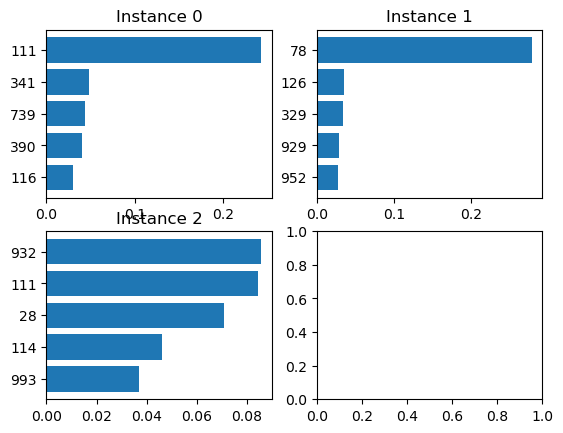

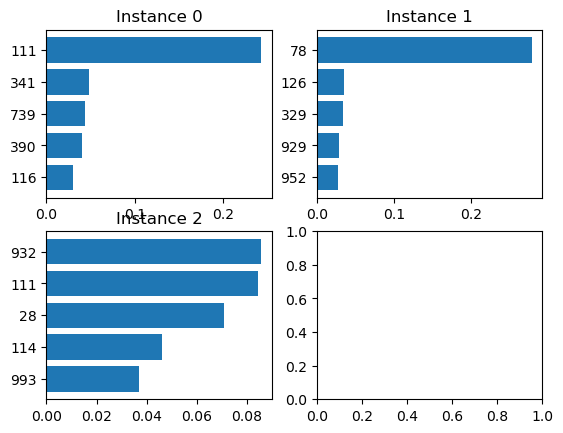

In [22]:
print("==============", names[0], "================")
explainations[0].plot()

============== lime ================


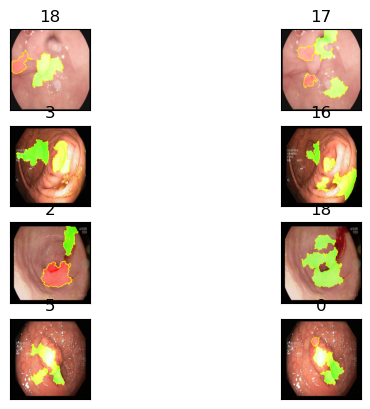

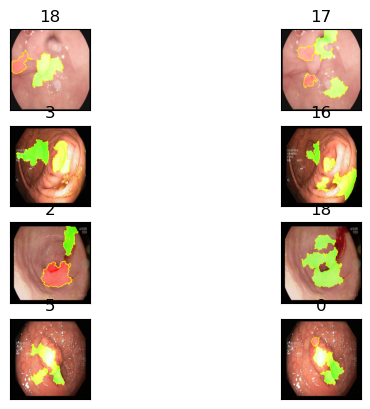

In [140]:
print("==============", names[1], "================")
explainations[1].plot()

## Resnet Explainer

In [15]:
# A ResNet model to explain
resnet_model = models.resnet50(pretrained=True).to(args.device)
resnet_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [16]:
# Initialize a VisionExplainer
explainer = VisionExplainer(
    explainers=["gradcam", "lime", "ig", "ce", "scorecam",
                "smoothgrad", "guidedbp", "layercam"],
    mode="classification",
    model=resnet_model,
    preprocess=preprocess,
    postprocess=postprocess,
    params={
        "gradcam": {"target_layer": resnet_model.layer4[-1]},
        "ce": {"binary_search_steps": 2, "num_iterations": 100},
        "scorecam": {"target_layer": resnet_model.layer4[-1]},
        "layercam": {"target_layer": resnet_model.layer3[-3]},
    }
)
# Generate explanations
local_explanations = explainer.explain(img)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Binary step: 2 |███████████████████████████████████████-| 99.0% 

100%|██████████| 2048/2048 [05:33<00:00,  6.14it/s]


In [19]:
# index=2
# for name, explanations in local_explanations.items():
#     print(f"{name}:")
#     explanations.plot()

In [20]:
names, explainations = list(local_explanations.keys()), list(local_explanations.values())
names

['predict',
 'gradcam',
 'lime',
 'ig',
 'ce',
 'scorecam',
 'smoothgrad',
 'guidedbp',
 'layercam']

In [21]:
help(explainations[0])

Help on PredictedResults in module omnixai.explanations.base object:

class PredictedResults(ExplanationBase)
 |  PredictedResults(predictions=None)
 |  
 |  The class for prediction results.
 |  
 |  Method resolution order:
 |      PredictedResults
 |      ExplanationBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getitem__(self, i: int)
 |  
 |  __init__(self, predictions=None)
 |      :param predictions: For classfication, ``predictions`` are the predicted class probabilities.
 |          For regression, ``predictions`` are the predicted values.
 |  
 |  get_explanations(self)
 |      Gets the prediction results.
 |      
 |      :return: The prediction results.
 |      :rtype: Dict
 |  
 |  ipython_plot(self, index, class_names=None, **kwargs)
 |      Plots prediction results in IPython.
 |      
 |      :param index: The index of the instance which cannot be None.
 |      :param class_names: The class names.
 |  
 |  plot(self, index=None, class_names=None,

============== predict ================


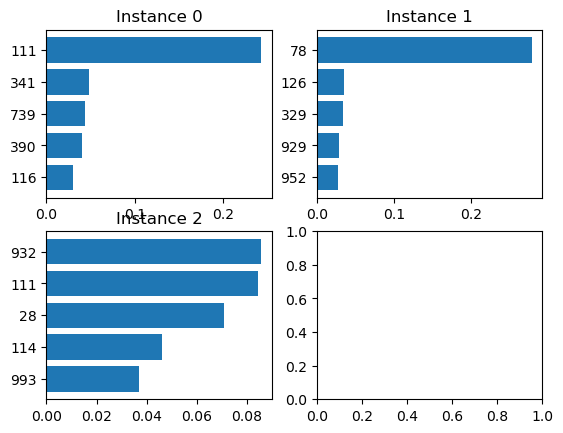

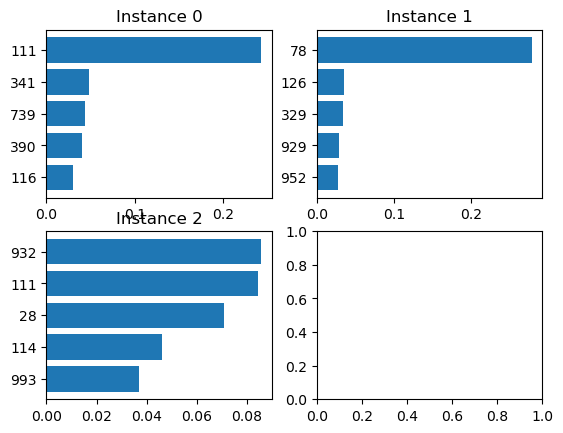

In [22]:
print("==============", names[0], "================")
explainations[0].plot()

============== gradcam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

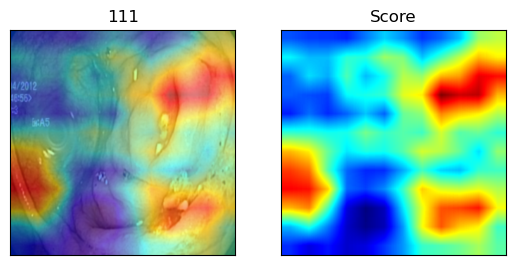

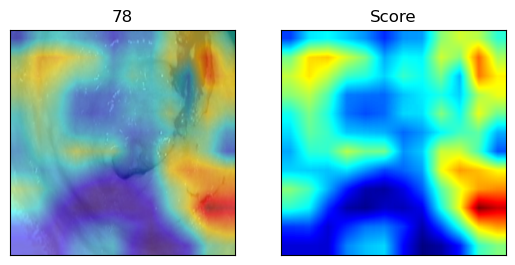

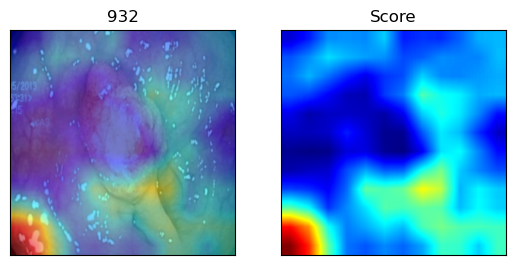

In [23]:
print("==============", names[1], "================")
explainations[1].plot()

============== lime ================


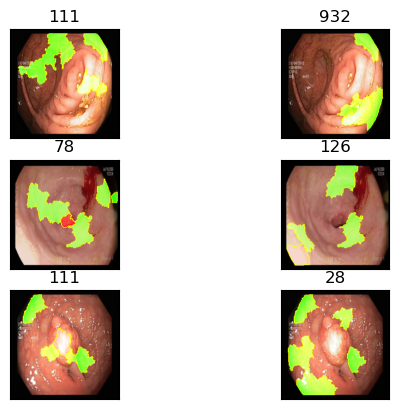

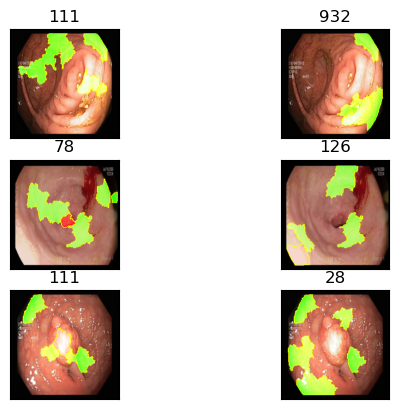

In [24]:
print("==============", names[2], "================")
explainations[2].plot()

============== ig ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

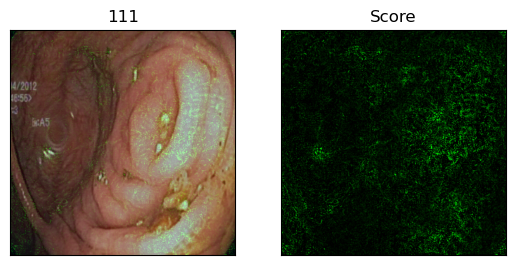

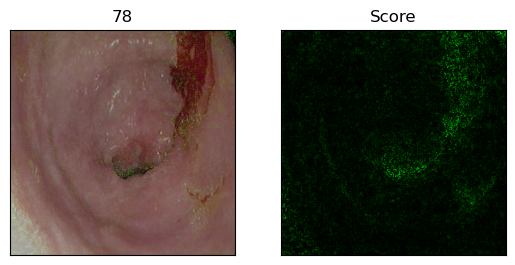

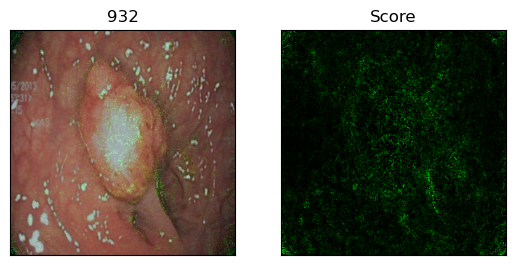

In [25]:
print("==============", names[3], "================")
explainations[3].plot()

============== ce ================


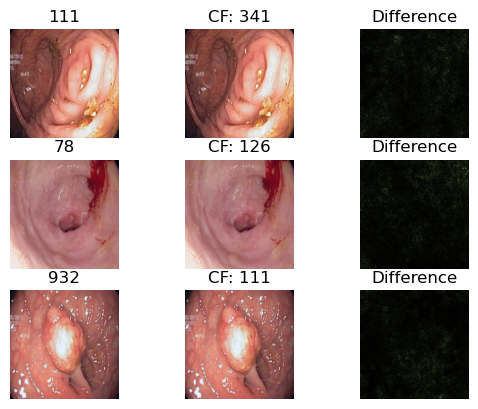

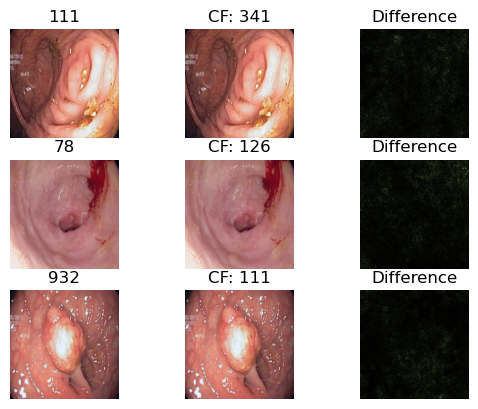

In [26]:
print("==============", names[4], "================")
explainations[4].plot()

============== scorecam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

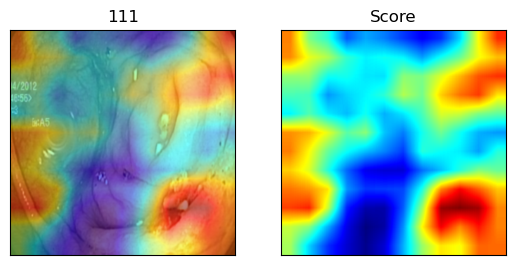

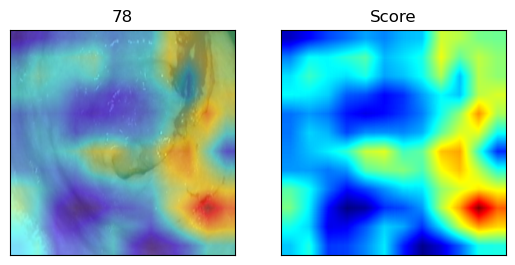

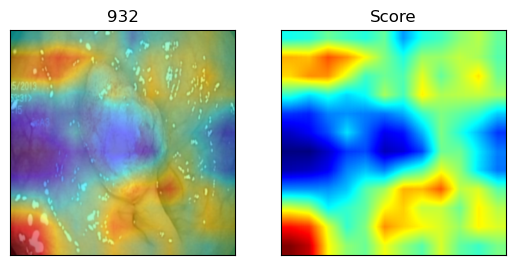

In [27]:
print("==============", names[5], "================")
explainations[5].plot()

============== smoothgrad ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

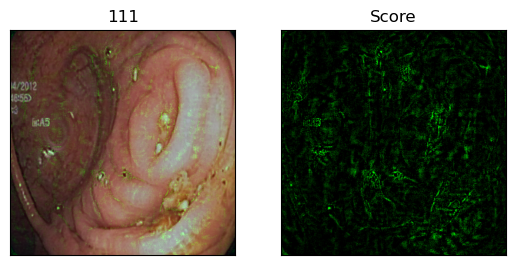

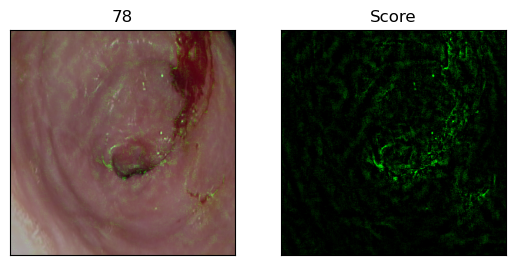

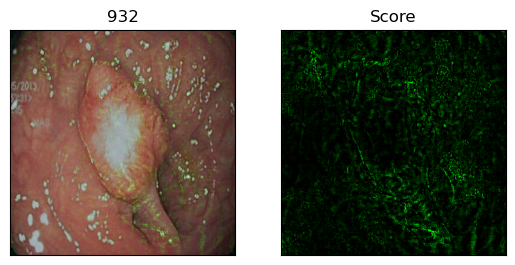

In [28]:
print("==============", names[6], "================")
explainations[6].plot()

============== guidedbp ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

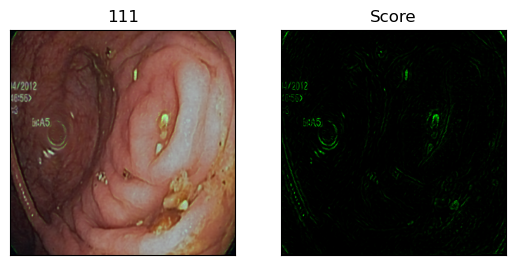

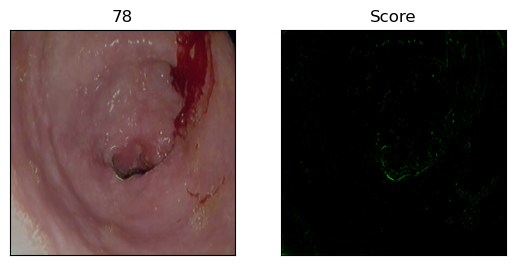

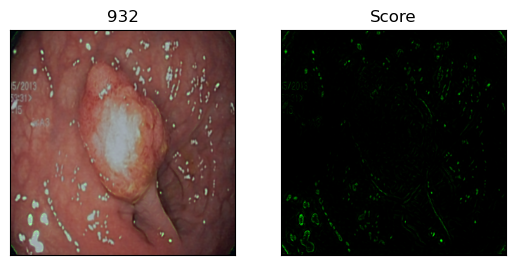

In [29]:
print("==============", names[7], "================")
explainations[7].plot()

============== layercam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

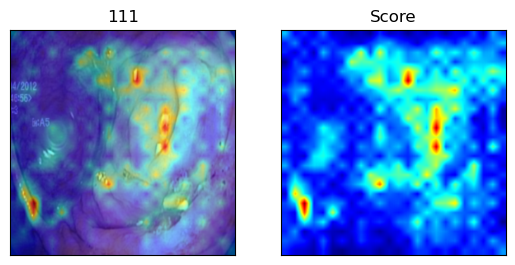

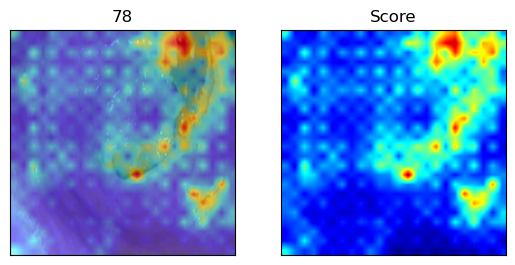

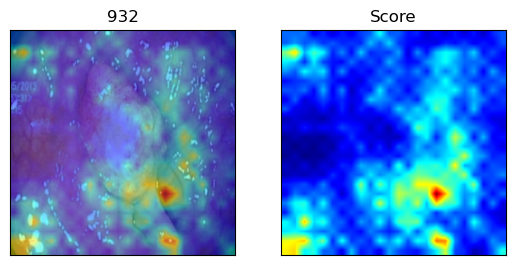

In [30]:
print("==============", names[8], "================")
explainations[8].plot()

## ResNet-152 Explainer

In [31]:
# A ResNet model to explain
resnet_model152 = models.resnet152(pretrained=True).to(args.device)
resnet_model152

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to C:\Users\User1/.cache\torch\hub\checkpoints\resnet152-394f9c45.pth
100%|██████████| 230M/230M [00:02<00:00, 94.5MB/s] 


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [32]:
# Initialize a VisionExplainer
explainer = VisionExplainer(
    explainers=["gradcam", "lime", "ig", "ce", "scorecam",
                "smoothgrad", "guidedbp", "layercam"],
    mode="classification",
    model=resnet_model152,
    preprocess=preprocess,
#     postprocess=postprocess,
    params={
        "gradcam": {"target_layer": resnet_model152.layer4[-1]},
        "ce": {"binary_search_steps": 2, "num_iterations": 100},
        "scorecam": {"target_layer": resnet_model152.layer4[-1]},
        "layercam": {"target_layer": resnet_model152.layer3[-3]},
    }
)
# Generate explanations
local_explanations = explainer.explain(img)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Binary step: 2 |███████████████████████████████████████-| 99.0% 

100%|██████████| 2048/2048 [19:18<00:00,  1.77it/s]


In [ ]:
# index=2
# for name, explanations in local_explanations.items():
#     print(f"{name}:")
#     explanations.plot()

In [33]:
names, explainations = list(local_explanations.keys()), list(local_explanations.values())
names

['predict',
 'gradcam',
 'lime',
 'ig',
 'ce',
 'scorecam',
 'smoothgrad',
 'guidedbp',
 'layercam']

In [34]:
help(explainations[0])

Help on PredictedResults in module omnixai.explanations.base object:

class PredictedResults(ExplanationBase)
 |  PredictedResults(predictions=None)
 |  
 |  The class for prediction results.
 |  
 |  Method resolution order:
 |      PredictedResults
 |      ExplanationBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getitem__(self, i: int)
 |  
 |  __init__(self, predictions=None)
 |      :param predictions: For classfication, ``predictions`` are the predicted class probabilities.
 |          For regression, ``predictions`` are the predicted values.
 |  
 |  get_explanations(self)
 |      Gets the prediction results.
 |      
 |      :return: The prediction results.
 |      :rtype: Dict
 |  
 |  ipython_plot(self, index, class_names=None, **kwargs)
 |      Plots prediction results in IPython.
 |      
 |      :param index: The index of the instance which cannot be None.
 |      :param class_names: The class names.
 |  
 |  plot(self, index=None, class_names=None,

============== predict ================


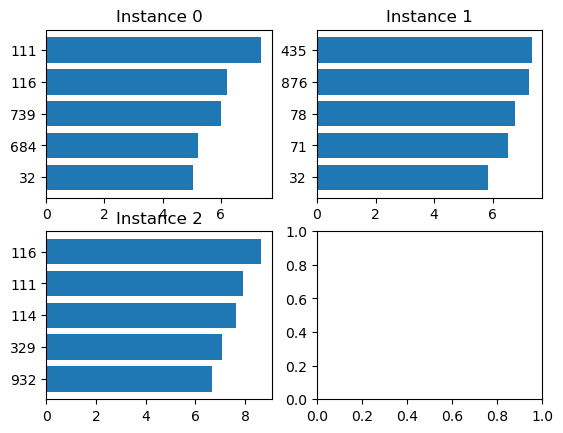

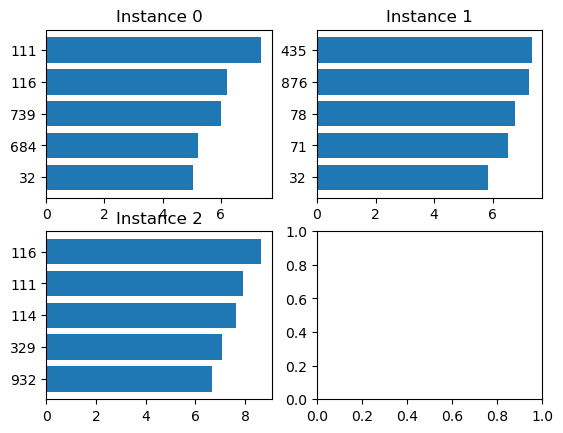

In [35]:
print("==============", names[0], "================")
explainations[0].plot()

============== gradcam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

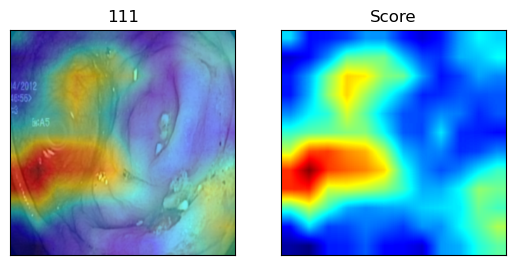

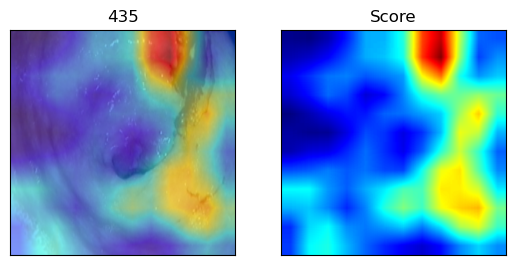

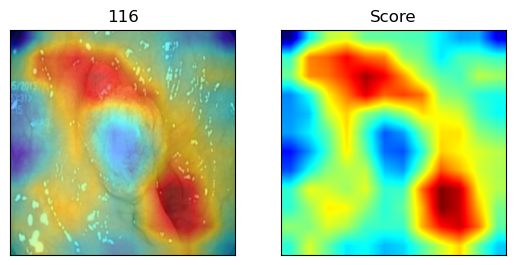

In [36]:
print("==============", names[1], "================")
explainations[1].plot()

============== lime ================


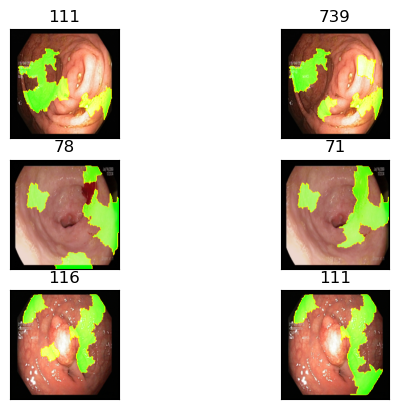

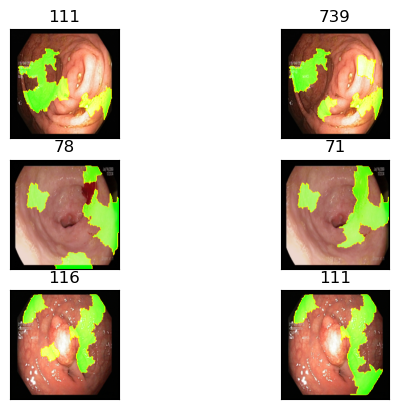

In [37]:
print("==============", names[2], "================")
explainations[2].plot()

============== ig ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

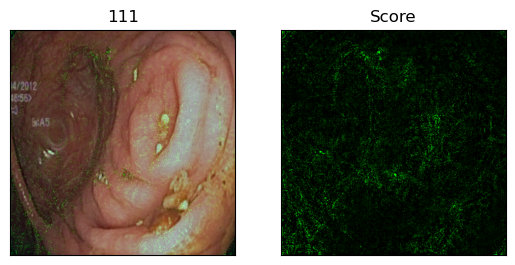

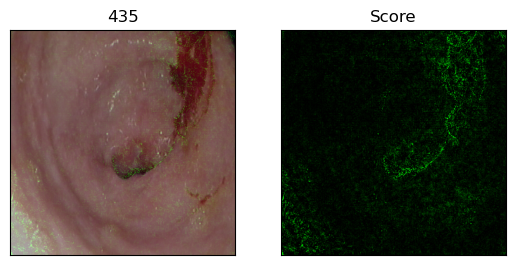

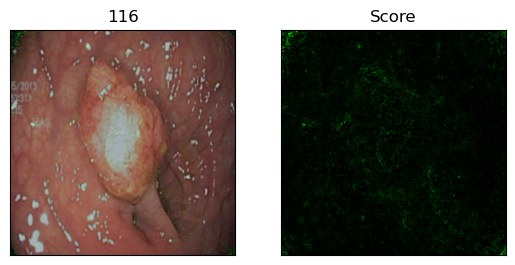

In [38]:
print("==============", names[3], "================")
explainations[3].plot()

============== ce ================


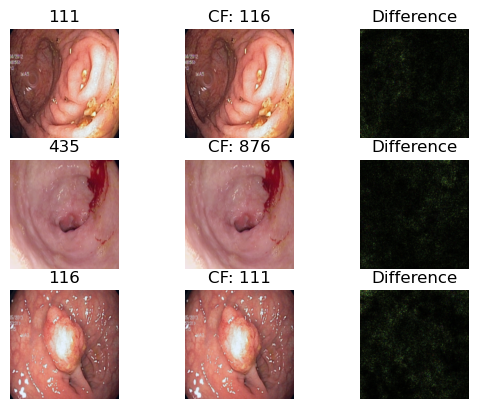

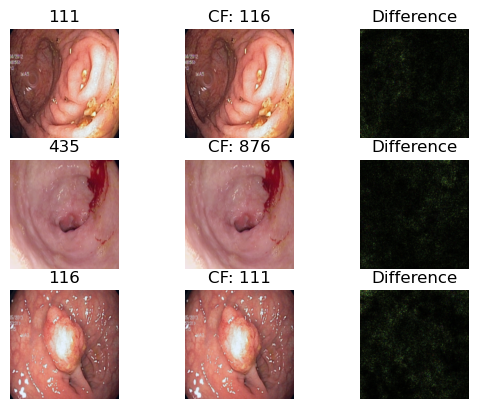

In [39]:
print("==============", names[4], "================")
explainations[4].plot()

============== scorecam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

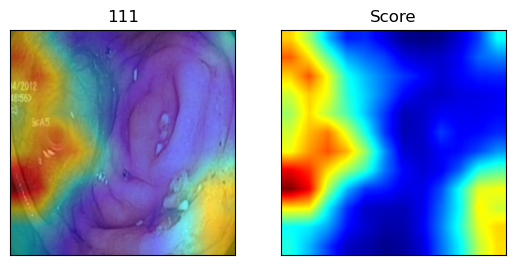

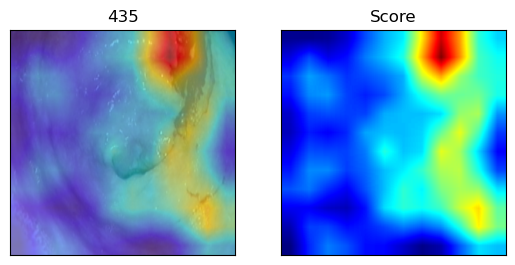

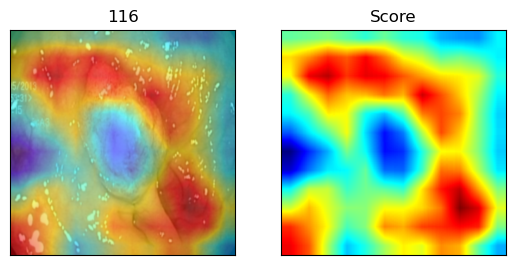

In [40]:
print("==============", names[5], "================")
explainations[5].plot()

============== smoothgrad ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

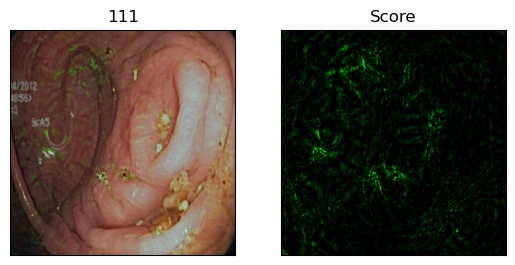

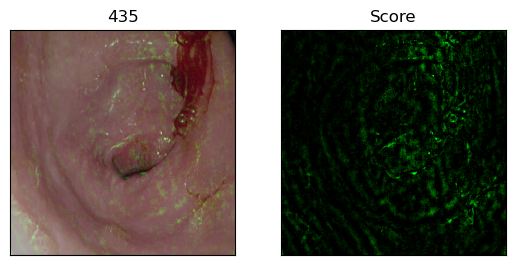

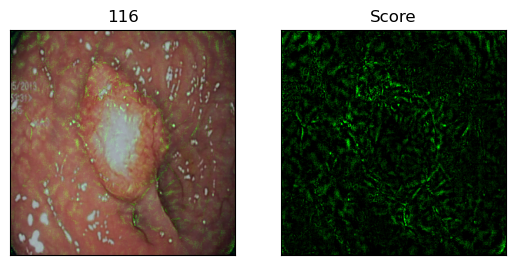

In [41]:
print("==============", names[6], "================")
explainations[6].plot()

============== guidedbp ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

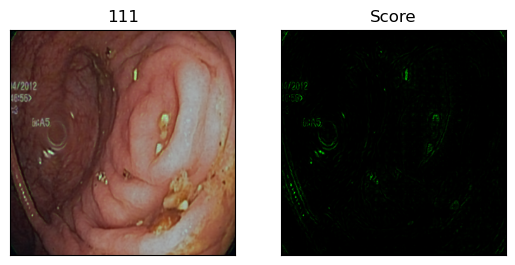

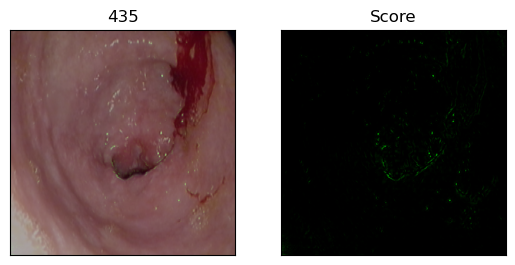

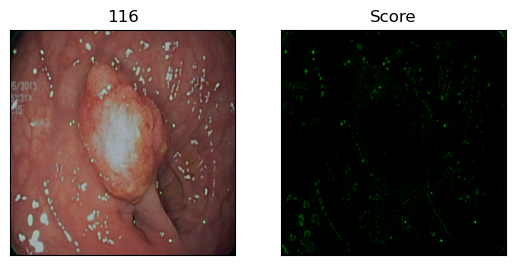

In [42]:
print("==============", names[7], "================")
explainations[7].plot()

============== layercam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

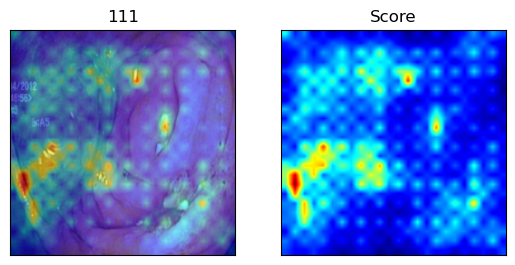

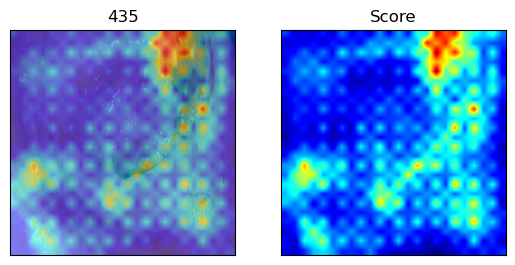

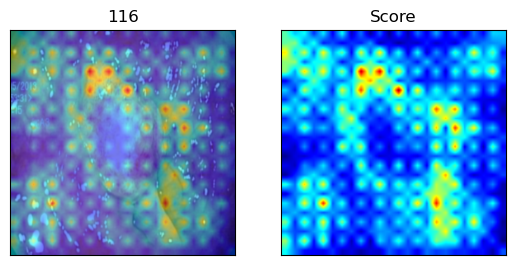

In [43]:
print("==============", names[8], "================")
explainations[8].plot()

## DenseNet-121 Explainer

In [45]:
# A ResNet model to explain
denseNet = models.densenet121(pretrained=True).to(args.device)
denseNet

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [49]:
# Initialize a VisionExplainer
explainer = VisionExplainer(
    explainers=["gradcam", "lime", "ig", "ce", "scorecam",
                "smoothgrad", "guidedbp", "layercam"],
    mode="classification",
    model=denseNet,
    preprocess=preprocess,
#     postprocess=postprocess,
    params={
        "gradcam": {"target_layer": denseNet.features.denseblock4},
        "ce": {"binary_search_steps": 2, "num_iterations": 100},
        "scorecam": {"target_layer": denseNet.features.denseblock4},
        "layercam": {"target_layer": denseNet.features.denseblock4},
    }
)
# Generate explanations
local_explanations = explainer.explain(img)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Binary step: 2 |███████████████████████████████████████-| 99.0% 

100%|██████████| 1024/1024 [05:40<00:00,  3.01it/s]


In [47]:
# index=2
# for name, explanations in local_explanations.items():
#     print(f"{name}:")
#     explanations.plot()

In [50]:
names, explainations = list(local_explanations.keys()), list(local_explanations.values())
names

['predict',
 'gradcam',
 'lime',
 'ig',
 'ce',
 'scorecam',
 'smoothgrad',
 'guidedbp',
 'layercam']

In [51]:
help(explainations[0])

Help on PredictedResults in module omnixai.explanations.base object:

class PredictedResults(ExplanationBase)
 |  PredictedResults(predictions=None)
 |  
 |  The class for prediction results.
 |  
 |  Method resolution order:
 |      PredictedResults
 |      ExplanationBase
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getitem__(self, i: int)
 |  
 |  __init__(self, predictions=None)
 |      :param predictions: For classfication, ``predictions`` are the predicted class probabilities.
 |          For regression, ``predictions`` are the predicted values.
 |  
 |  get_explanations(self)
 |      Gets the prediction results.
 |      
 |      :return: The prediction results.
 |      :rtype: Dict
 |  
 |  ipython_plot(self, index, class_names=None, **kwargs)
 |      Plots prediction results in IPython.
 |      
 |      :param index: The index of the instance which cannot be None.
 |      :param class_names: The class names.
 |  
 |  plot(self, index=None, class_names=None,

============== predict ================


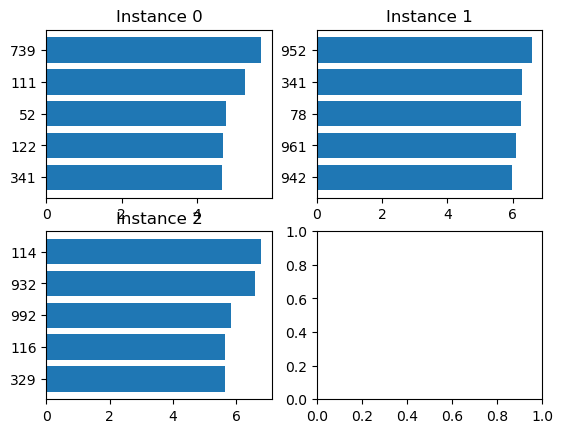

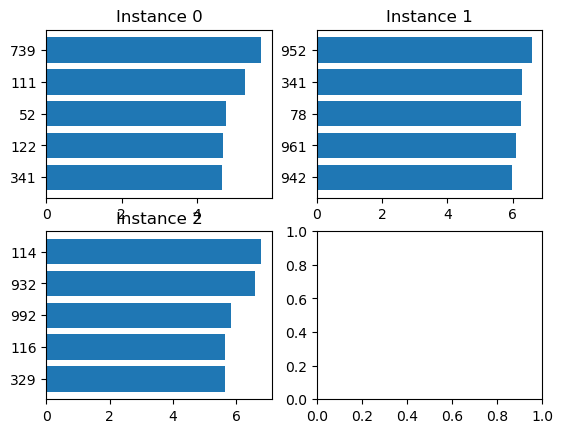

In [52]:
print("==============", names[0], "================")
explainations[0].plot()

============== gradcam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

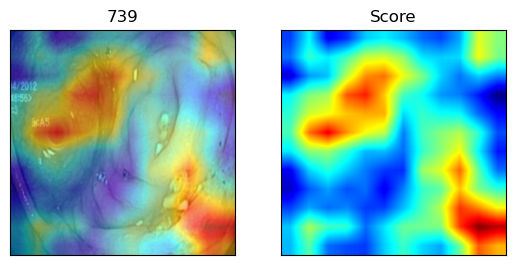

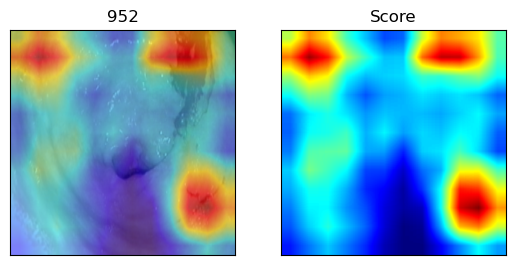

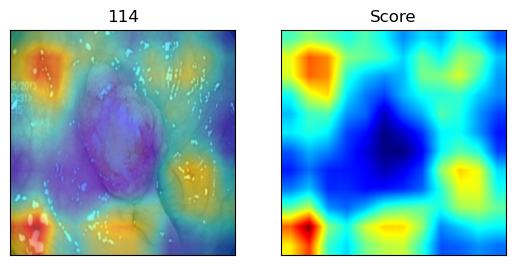

In [53]:
print("==============", names[1], "================")
explainations[1].plot()

============== lime ================


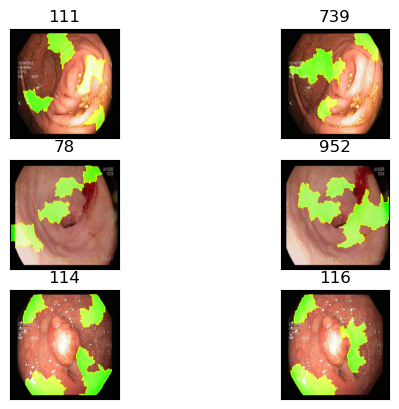

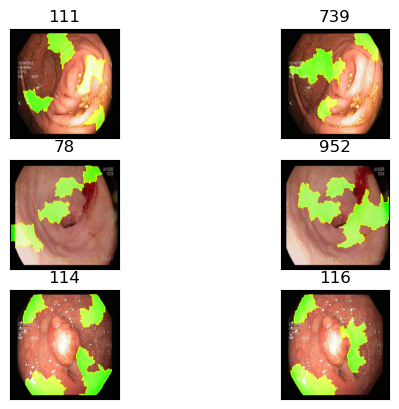

In [54]:
print("==============", names[2], "================")
explainations[2].plot()

============== ig ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

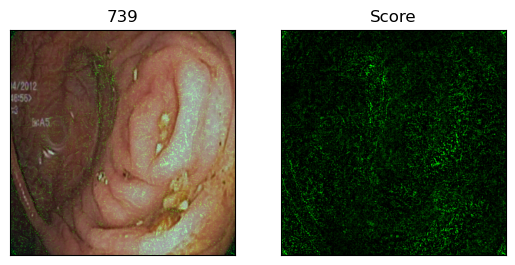

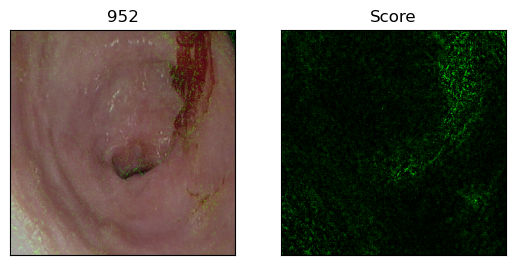

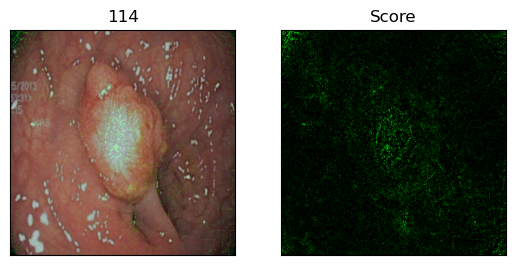

In [55]:
print("==============", names[3], "================")
explainations[3].plot()

============== ce ================


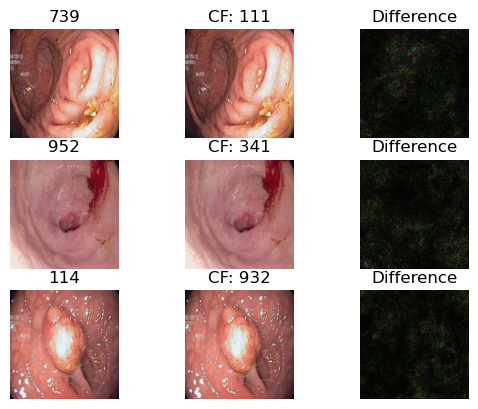

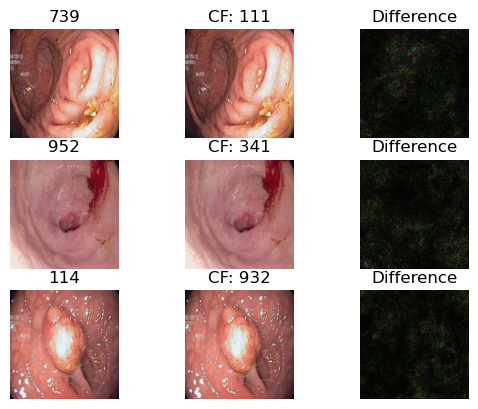

In [56]:
print("==============", names[4], "================")
explainations[4].plot()

============== scorecam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

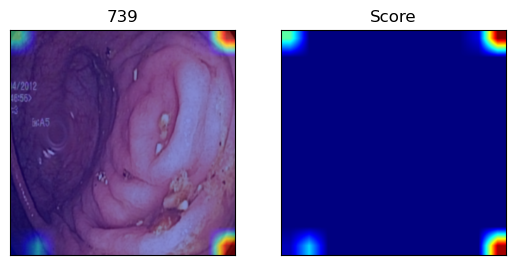

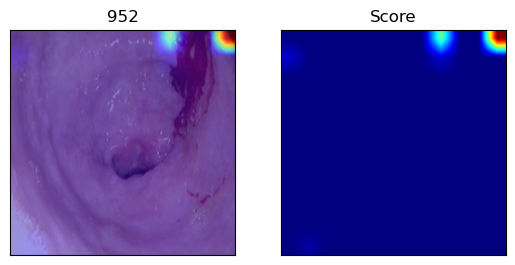

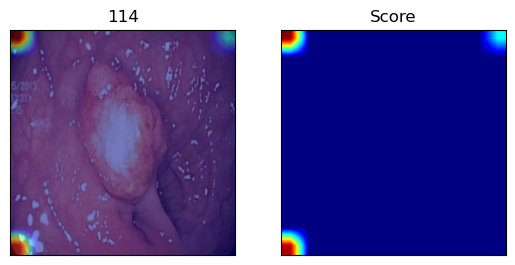

In [57]:
print("==============", names[5], "================")
explainations[5].plot()

============== smoothgrad ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

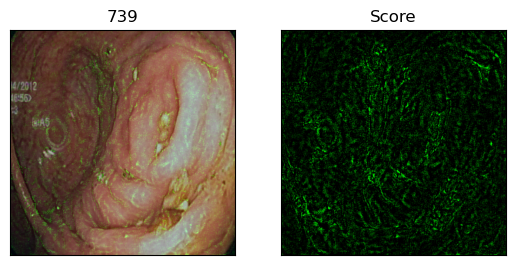

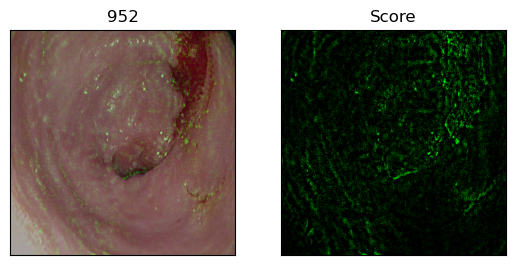

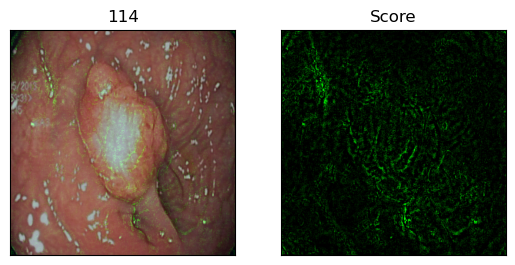

In [58]:
print("==============", names[6], "================")
explainations[6].plot()

============== guidedbp ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

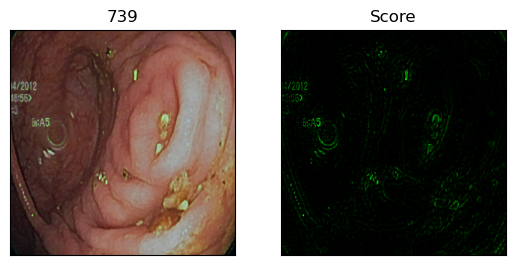

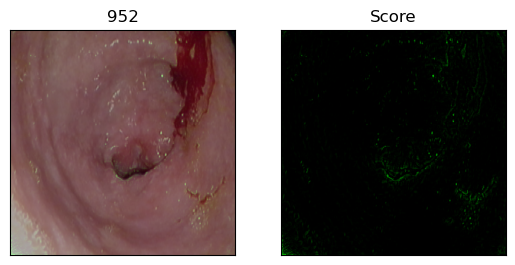

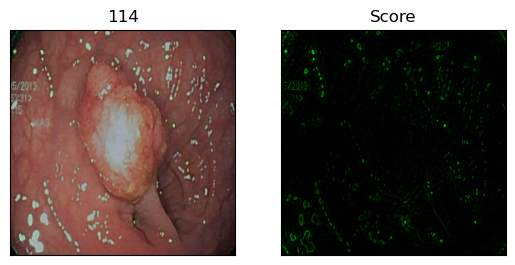

In [59]:
print("==============", names[7], "================")
explainations[7].plot()

============== layercam ================


[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

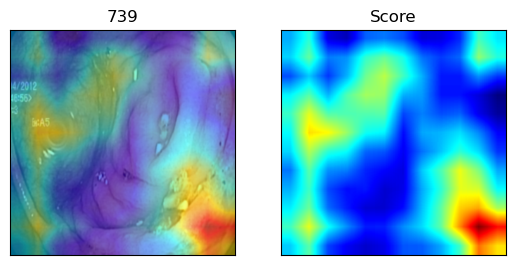

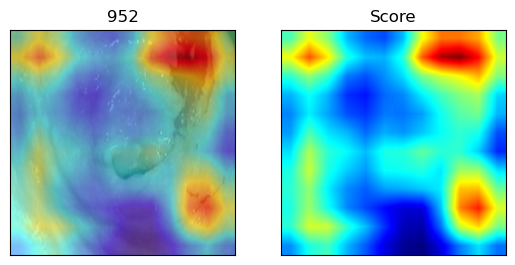

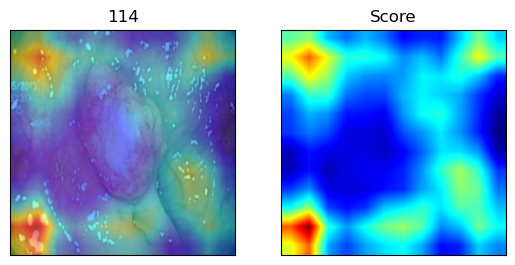

In [60]:
print("==============", names[8], "================")
explainations[8].plot()

## ViT Explainer

In [110]:
# A ResNet model to explain
vit_b_16 = models.vit_b_16(pretrained=True).to(args.device)
vit_b_16

VisionTransformer(
  (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=768, out_features=3072, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=3072, out_features=768, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (self_a

In [118]:
vit_b_16.encoder.layers.encoder_layer_10.self_attention

MultiheadAttention(
  (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
)

In [151]:
# Initialize a VisionExplainer
explainer = VisionExplainer(
    explainers=["lime"],
    #explainers=["gradcam", "lime", "ig", "ce", "scorecam", "smoothgrad", "guidedbp", "layercam"],
    mode="classification",
    model=vit_b_16,
#     preprocess=preprocess,
#     postprocess=postprocess,
    params={
#         "gradcam": {"target_layer": vit_b_16.encoder.layers.encoder_layer_10.self_attention},
        "ce": {"binary_search_steps": 2, "num_iterations": 100},
        "scorecam": {"target_layer": vit_b_16.encoder.layers.encoder_layer_10.self_attention},
        "layercam": {"target_layer": vit_b_16.encoder.layers.encoder_layer_10.self_attention},
    }
)
# Generate explanations
local_explanations = explainer.explain(img)

AssertionError: Wrong image width! Expected 224 but got 3!

In [ ]:
# index=2
# for name, explanations in local_explanations.items():
#     print(f"{name}:")
#     explanations.plot()

In [ ]:
names, explainations = list(local_explanations.keys()), list(local_explanations.values())
names

In [ ]:
help(explainations[0])

In [ ]:
print("==============", names[0], "================")
explainations[0].plot()

In [ ]:
print("==============", names[1], "================")
explainations[1].plot()

In [ ]:
print("==============", names[2], "================")
explainations[2].plot()

In [ ]:
print("==============", names[3], "================")
explainations[3].plot()

In [ ]:
print("==============", names[4], "================")
explainations[4].plot()

In [ ]:
print("==============", names[5], "================")
explainations[5].plot()

In [ ]:
print("==============", names[6], "================")
explainations[6].plot()

In [ ]:
print("==============", names[7], "================")
explainations[7].plot()

In [ ]:
print("==============", names[8], "================")
explainations[8].plot()

In [ ]:
print("==============", names[8], "================")
explainations[8].plot()